<a href="https://colab.research.google.com/github/Fahrezaaaa/Analisis-Rawan-Banjir-Kota-Malang/blob/main/Proyek_Perangkat_Lunakkk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
pip install rasterstats

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 81.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 76.9 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade rasterio

In [ ]:
# Install library yang dibutuhkan
!pip install contextily matplotlib_scalebar

In [ ]:
!pip install contextily

In [ ]:
!pip install geopandas rasterio folium numpy matplotlib shapely scikit-image

import os
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import rasterio
import json
from rasterio.mask import mask
from rasterio.features import rasterize
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
from rasterio import uint8
from shapely.geometry import mapping
from rasterio.plot import show
import contextily as cx # untuk menambahkan basemap


In [ ]:
def crop_raster(raster_path, mask_geom):
    with rasterio.open(raster_path) as src:
        out_image, out_transform = rasterio.mask.mask(src, [mapping(mask_geom)], crop=True)
        out_meta = src.meta
        out_image = out_image.astype(float)  # Pastikan tipe float agar tidak terpotong nilainya
        out_image[out_image == src.nodata] = np.nan  # Ganti nodata dengan NaN agar tak mengganggu

        # The following lines were indented incorrectly. They are moved inside the function
        # and aligned with other statements within the 'with' block.
        dem = src.read(1)
        transform = src.transform
        bounds = src.bounds
        nodata = src.nodata

## Data Administrasi Kota Malang


In [ ]:
Malang = gpd.read_file("/content/drive/MyDrive/ProjectUAS/Malang.shp")


In [ ]:
print("CRS Awal:", Malang.crs)
if Malang.crs != "EPSG:32749":
    Malang = Malang.to_crs(epsg=32749)

CRS Awal: EPSG:4326


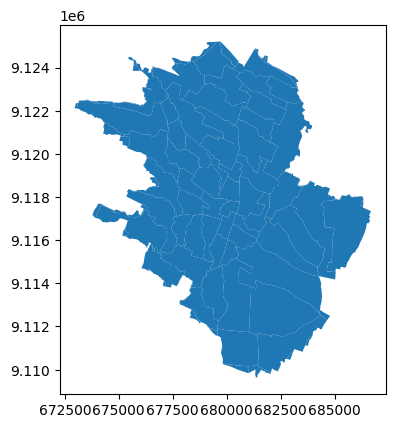

In [ ]:
Malang.plot()
plt.show()

In [ ]:
Malang.head()

,KDPPUM,NAMOBJ,REMARK,KDPBPS,FCODE,LUASWH,UUPP,SRS_ID,LCODE,METADATA,...,WADMKC,WIADKC,WADMKK,WIADKK,WADMPR,WIADPR,TIPADM,SHAPE_Leng,SHAPE_Area,geometry
0,None,KEBONAGUNG,Wilayah Administrasi Keluruhan/Desa,None,None,0.0,None,None,BA0020,None,...,PAKISHAJI,None,MALANG,None,JAWA TIMUR,None,0,0.081488,0.000345,"MULTIPOLYGON Z (((678615.536 9112410.779 0, 67..."
1,None,SITIREJO,Wilayah Administrasi Keluruhan/Desa,None,None,0.0,None,None,BA0020,None,...,WAGIR,None,MALANG,None,JAWA TIMUR,None,0,0.068639,0.000173,"MULTIPOLYGON Z (((678154.508 9113315.792 0, 67..."
2,None,TELOGOWARU,Wilayah Administrasi Keluruhan/Desa,None,None,0.0,None,None,BA0020,None,...,KEDUNGKANDANG,None,KOTA MALANG,None,JAWA TIMUR,None,0,0.092607,0.000303,"POLYGON Z ((684636.598 9112269.11 0, 684624.82..."
3,None,SUMBERSUKO,Wilayah Administrasi Keluruhan/Desa,None,None,0.0,None,None,BA0020,None,...,TAJINAN,None,MALANG,None,JAWA TIMUR,None,0,0.096692,0.000296,"MULTIPOLYGON Z (((682659.155 9110312.964 0, 68..."
4,None,NGINGIT,Wilayah Administrasi Keluruhan/Desa,None,None,0.0,None,None,BA0020,None,...,TUMPANG,None,MALANG,None,JAWA TIMUR,None,0,0.134297,0.000346,"MULTIPOLYGON Z (((684687.081 9112346.769 0, 68..."


Basemap berhasil ditambahkan!
Kompas JPEG berhasil ditambahkan!


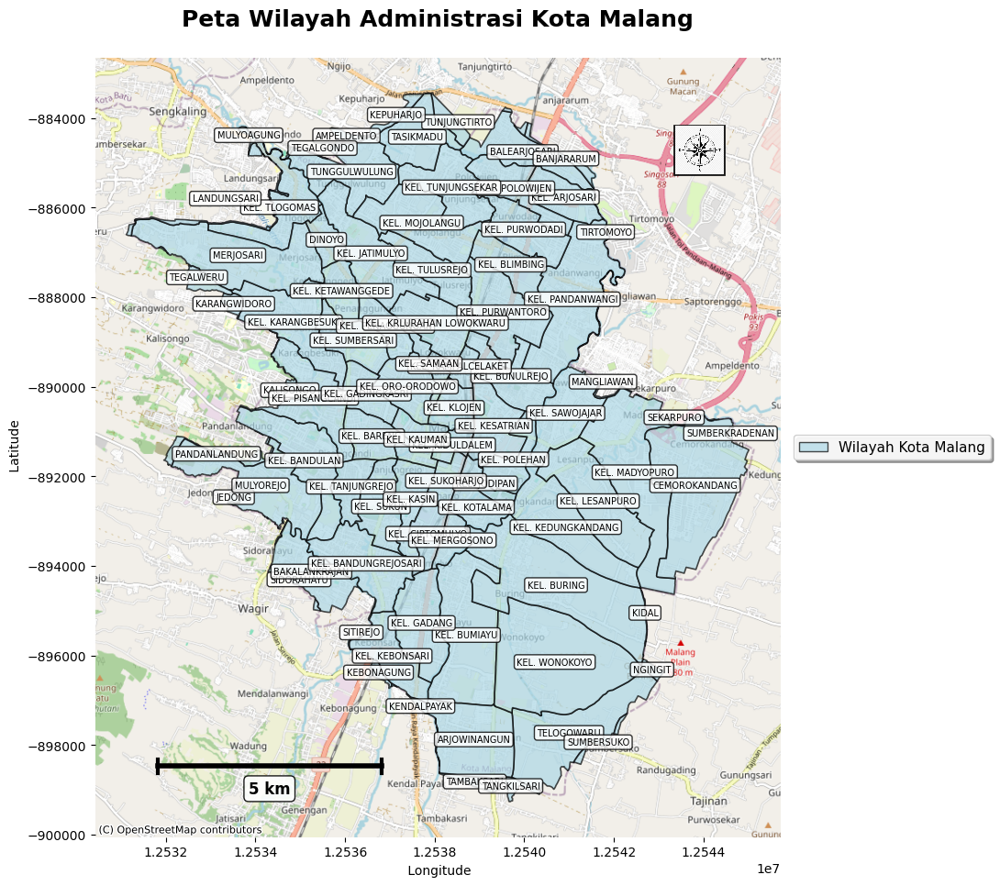

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import FancyBboxPatch
import numpy as np
import contextily as ctx
import geopandas as gpd

# Pastikan CRS sudah benar untuk contextily
# Jika Malang masih dalam EPSG:4326 (WGS84), convert ke Web Mercator (EPSG:3857)
if Malang.crs != 'EPSG:3857':
    Malang_mercator = Malang.to_crs(epsg=3857)
else:
    Malang_mercator = Malang.copy()

# Plot peta dasar
fig, ax = plt.subplots(figsize=(10, 10))

# Plot data GeoDataFrame
Malang_mercator.plot(
    ax=ax,
    color='lightblue',
    edgecolor='black',
    alpha=0.7,  # Sedikit transparan agar basemap terlihat
    linewidth=1.2
)

# === TAMBAHKAN BASEMAP ===
try:
    # Pilihan basemap yang tersedia:
    # 1. OpenStreetMap (default)
    ctx.add_basemap(ax, crs=Malang_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik)

    # 2. Satelit/Imagery - uncomment salah satu yang diinginkan:
    # ctx.add_basemap(ax, crs=Malang_mercator.crs, source=ctx.providers.Esri.WorldImagery)

    # 3. Terrain/Topografi:
    # ctx.add_basemap(ax, crs=Malang_mercator.crs, source=ctx.providers.OpenTopoMap)

    # 4. CartoDB (clean style):
    # ctx.add_basemap(ax, crs=Malang_mercator.crs, source=ctx.providers.CartoDB.Positron)

    # 5. Stamen Terrain:
    # ctx.add_basemap(ax, crs=Malang_mercator.crs, source=ctx.providers.Stamen.Terrain)

    # 6. Custom zoom level (untuk kontrol kualitas gambar):
    # ctx.add_basemap(ax, crs=Malang_mercator.crs, zoom=12, source=ctx.providers.OpenStreetMap.Mapnik)

    print("Basemap berhasil ditambahkan!")

except Exception as e:
    print(f"Error menambahkan basemap: {e}")
    print("Pastikan Anda terkoneksi internet dan contextily terinstall")

# Tambahkan label nama desa/kelurahan dengan background putih agar mudah dibaca
for idx, row in Malang_mercator.iterrows():
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
            row['NAMOBJ'], fontsize=7, ha='center', va='center',
            bbox=dict(boxstyle="round,pad=0.3", facecolor='white',
                     edgecolor='black', alpha=0.8))

# Dapatkan batas koordinat (dalam Web Mercator)
bounds = Malang_mercator.total_bounds
x_range = bounds[2] - bounds[0]
y_range = bounds[3] - bounds[1]

# === TAMBAHKAN SCALE BAR ===
# Untuk Web Mercator, 1 unit ≈ 1 meter
scale_length_m = 5000  # 5 km
scale_x = bounds[0] + x_range * 0.05
scale_y = bounds[1] + y_range * 0.05

# Gambar scale bar
ax.plot([scale_x, scale_x + scale_length_m], [scale_y, scale_y],
        'k-', linewidth=4)

# Tambahkan tick marks
tick_height = y_range * 0.01
ax.plot([scale_x, scale_x], [scale_y - tick_height, scale_y + tick_height],
        'k-', linewidth=3)
ax.plot([scale_x + scale_length_m, scale_x + scale_length_m],
        [scale_y - tick_height, scale_y + tick_height], 'k-', linewidth=3)

# Label scale bar
scale_text = f"{scale_length_m/1000:.0f} km"
ax.text(scale_x + scale_length_m/2, scale_y - y_range * 0.02,
        scale_text, ha='center', va='top', fontsize=12, fontweight='bold',
        bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.9))

# === TAMBAHKAN NORTH ARROW MENGGUNAKAN JPEG ===
arrow_x = bounds[2] - x_range * 0.08
arrow_y = bounds[3] - y_range * 0.08

# Import libraries untuk image
import matplotlib.image as mpimg
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

try:
    # Muat gambar JPEG kompas
    # Ganti 'path/to/your/compass.jpg' dengan path file JPEG Anda
    compass_img = mpimg.imread('/content/drive/MyDrive/ProjectUAS/Arah Mata Angin.jpeg')  # atau 'path/to/your/compass.jpg'

    # Buat OffsetImage dengan ukuran yang sesuai
    # Sesuaikan zoom (0.05-0.2) tergantung ukuran gambar asli
    imagebox = OffsetImage(compass_img, zoom=0.08)

    # Buat AnnotationBbox untuk menempatkan gambar
    ab = AnnotationBbox(imagebox, (arrow_x, arrow_y),
                       frameon=True,  # Aktifkan frame
                       bboxprops=dict(boxstyle="round,pad=0.02",
                                     facecolor='white',
                                     edgecolor='black',
                                     alpha=0.9,
                                     linewidth=2))
    ax.add_artist(ab)

    print("Kompas JPEG berhasil ditambahkan!")

except FileNotFoundError:
    print("File compass.jpg tidak ditemukan. Membuat kompas sederhana...")

    # Fallback: Buat kompas sederhana jika file tidak ditemukan
    # Background untuk north arrow
    north_bg = FancyBboxPatch(
        (arrow_x - x_range * 0.03, arrow_y - y_range * 0.03),
        x_range * 0.06, y_range * 0.08,
        boxstyle="round,pad=0.005",
        facecolor='white', edgecolor='black', alpha=0.9, linewidth=2
    )
    ax.add_patch(north_bg)

    # Buat kompas yang lebih detail
    circle = plt.Circle((arrow_x, arrow_y), x_range * 0.02,
                       facecolor='lightgray', edgecolor='black', alpha=0.8, linewidth=2)
    ax.add_patch(circle)

    # Panah utara (merah)
    arrow_length = x_range * 0.015
    north_arrow = patches.FancyArrowPatch(
        (arrow_x, arrow_y),
        (arrow_x, arrow_y + arrow_length),
        arrowstyle='->',
        mutation_scale=20,
        color='red',
        linewidth=3
    )
    ax.add_patch(north_arrow)

    # Panah selatan (putih dengan border hitam)
    south_arrow = patches.FancyArrowPatch(
        (arrow_x, arrow_y),
        (arrow_x, arrow_y - arrow_length),
        arrowstyle='->',
        mutation_scale=20,
        color='white',
        linewidth=3,
        edgecolor='black'
    )
    ax.add_patch(south_arrow)

    # Label N
    ax.text(arrow_x, arrow_y + arrow_length + y_range * 0.015, 'N',
            ha='center', va='bottom', fontsize=14, fontweight='bold')

except Exception as e:
    print(f"Error loading compass image: {e}")
    print("Menggunakan kompas text sederhana...")

    # Kompas text sederhana sebagai backup terakhir
    ax.text(arrow_x, arrow_y, 'N', ha='center', va='center',
            fontsize=24, fontweight='bold',
            bbox=dict(boxstyle="circle,pad=0.3", facecolor='white',
                     edgecolor='black', linewidth=2))

# === TAMBAHKAN LEGEND ===
# === TAMBAHKAN LEGEND DI SAMPING PETA ===
legend_elements = [
    plt.Rectangle((0,0),1,7, facecolor='lightblue', edgecolor='black',
                  alpha=0.7, label='Wilayah Kota Malang')
]

# Legend di luar area plot sebelah kanan
legend = ax.legend(
    handles=legend_elements,
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),  # Geser ke kanan
    borderaxespad=0,
    frameon=True,
    fancybox=True,
    shadow=True,
    fontsize=11
)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_alpha(0.9)

# Atur judul dan tampilan
ax.set_title("Peta Wilayah Administrasi Kota Malang",
            fontsize=18, fontweight='bold', pad=25)

# Hilangkan axis labels karena menggunakan basemap
ax.set_xlabel(" Longitude")
ax.set_ylabel(" Latitude")
ax.tick_params(axis='both', labelsize=10)  # Aktifkan label tick


# Atur aspek rasio
ax.set_aspect('equal')

# Hilangkan frame
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()



## Peta Tutupan Lahan Kota Malang 2024



REKLASIFIKASI AKTIF:
- Mengubah semua 'Flooded vegetation' (kelas 3) menjadi 'Built-up area' (kelas 6).
- Total 'Flooded vegetation' awal: 913,070 piksel
- Semua telah direklasifikasi ke 'Built-up area'.

DEBUG: Nilai unik dalam data:
Unique values: [  1   2   6 255]
Counts: [ 108183  107626  913070 1050818]

Distribusi Klasifikasi Tutupan Lahan Dynamic World 2024:
Kelas 1 (Trees): 108,183 piksel (9.58%)
Kelas 2 (Grass): 107,626 piksel (9.53%)
Kelas 6 (Built-up area): 913,070 piksel (80.88%)
NoData (luar batas): 1,050,818 piksel
Total piksel valid: 1,128,879

DEBUG: Rentang nilai dalam raster asli:
Min: 1
Max: 3
Unique values in original: [1 2 3]


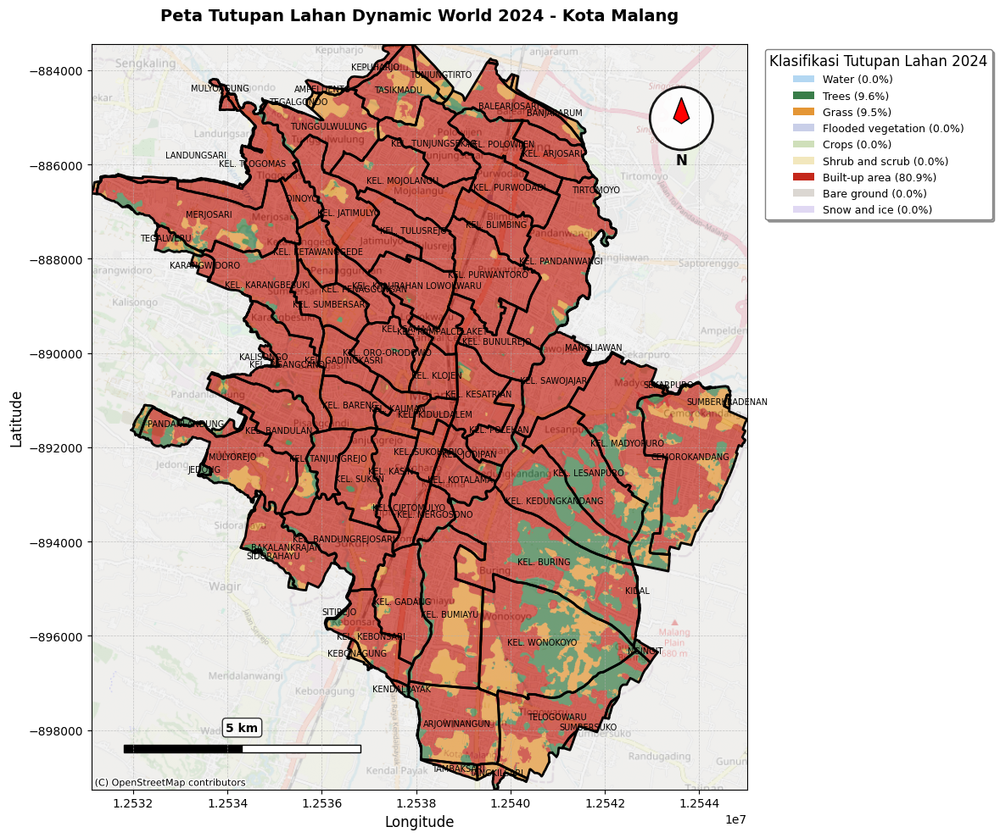


ANALISIS TUTUPAN LAHAN KOTA MALANG 2024
Resolusi piksel: 0.00 x 0.00 meter
Luas per piksel: 0.0000 hektar

Trees               :  108,183 piksel ( 9.58%) =     0.00 ha
Grass               :  107,626 piksel ( 9.53%) =     0.00 ha
Built-up area       :  913,070 piksel (80.88%) =     0.00 ha
TOTAL               : 1,128,879 piksel (100.00%) =     0.00 ha


In [ ]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from rasterio.mask import mask
from rasterio.plot import show
from shapely.geometry import mapping
import rasterio
from matplotlib.colors import ListedColormap, BoundaryNorm

# Import tambahan untuk basemap, scale bar, dan north arrow
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText
from matplotlib.patches import Patch

shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# 2. Baca raster Dynamic World (Tutupan Lahan)
raster_path = "/content/drive/MyDrive/ProjectUAS/DynamicWorld_2024_Malang.tif"
raster = rasterio.open(raster_path)

# 3. Samakan proyeksi shapefile dengan raster
# Setelah reproyeksi ke CRS raster
gdf = gdf.to_crs(raster.crs)

# Tambahkan ini untuk reproyeksi ke Web Mercator (EPSG:3857)
gdf_mercator = gdf.to_crs(epsg=3857)


# 4. Klip raster tutupan lahan dengan batas administrasi
geoms = [mapping(geom) for geom in gdf.geometry]
dw_clip, transform_clip = mask(raster, geoms, crop=True, filled=True, nodata=255)
dw_clip = dw_clip[0].astype(np.uint8)  # Ambil array 2D

# 5. Klasifikasi tutupan lahan berdasarkan Dynamic World
# Mapping nilai piksel ke kategori tutupan lahan
klasifikasi_lahan = np.full_like(dw_clip, fill_value=255, dtype=np.uint8)  # 255 = NoData
valid_mask = dw_clip <= 8

# Dynamic World classification mapping (0-8):
# 0: Water, 1: Trees, 2: Grass, 3: Flooded vegetation, 4: Crops,
# 5: Shrub and scrub, 6: Built-up area, 7: Bare ground, 8: Snow and ice
klasifikasi_lahan[valid_mask] = dw_clip[valid_mask]

# ========================================
# REKLASIFIKASI MANUAL (MODIFIKASI DI SINI)
# ========================================
# Berdasarkan permintaan Anda, reklasifikasi semua 'Flooded vegetation' menjadi 'Built-up area'.
REKLASIFIKASI = True  # Set True untuk aktifkan reklasifikasi

if REKLASIFIKASI:
    print("REKLASIFIKASI AKTIF:")
    print("- Mengubah semua 'Flooded vegetation' (kelas 3) menjadi 'Built-up area' (kelas 6).")

    # Identifikasi piksel flooded vegetation
    flooded_veg_mask = (klasifikasi_lahan == 3)
    flooded_count_original = np.sum(flooded_veg_mask)

    if flooded_count_original > 0:
        # Reklasifikasi 100% flooded vegetation menjadi built-up area
        klasifikasi_lahan[flooded_veg_mask] = 6  # Ubah kelas 3 (Flooded vegetation) menjadi 6 (Built-up area)

        print(f"- Total 'Flooded vegetation' awal: {flooded_count_original:,} piksel")
        print(f"- Semua telah direklasifikasi ke 'Built-up area'.")
    else:
        print("- Tidak ada 'Flooded vegetation' dalam data untuk direklasifikasi.")
    print()

# 6. Distribusi klasifikasi tutupan lahan
labels_tutupan = {
    0: 'Water',
    1: 'Trees',
    2: 'Grass',
    3: 'Flooded vegetation', # Tetap ada di sini untuk mapping lengkap, tapi akan 0% jika direklasifikasi
    4: 'Crops',
    5: 'Shrub and scrub',
    6: 'Built-up area',
    7: 'Bare ground',
    8: 'Snow and ice'
}

unique, counts = np.unique(klasifikasi_lahan, return_counts=True)
print("DEBUG: Nilai unik dalam data:")
print(f"Unique values: {unique}")
print(f"Counts: {counts}")
print()

print("Distribusi Klasifikasi Tutupan Lahan Dynamic World 2024:")
total_valid_pixels = 0
for u, c in zip(unique, counts):
    if u != 255:
        total_valid_pixels += c
        percentage = (c / (klasifikasi_lahan != 255).sum()) * 100
        print(f"Kelas {u} ({labels_tutupan.get(u, 'Tidak Dikenal')}): {c:,} piksel ({percentage:.2f}%)")

print(f"NoData (luar batas): {(klasifikasi_lahan == 255).sum():,} piksel")
print(f"Total piksel valid: {total_valid_pixels:,}")

# Debug tambahan - cek rentang nilai dalam data asli
print(f"\nDEBUG: Rentang nilai dalam raster asli:")
print(f"Min: {np.min(dw_clip[dw_clip != 255]) if (dw_clip != 255).any() else 'N/A'}")
print(f"Max: {np.max(dw_clip[dw_clip != 255]) if (dw_clip != 255).any() else 'N/A'}")
print(f"Unique values in original: {np.unique(dw_clip[dw_clip != 255]) if (dw_clip != 255).any() else 'N/A'}")


# 7. Visualisasi peta tutupan lahan
# Definisi lengkap semua kelas Dynamic World
all_classes = list(range(9))  # 0-8
unique_values = unique[unique != 255]  # Exclude NoData

# Warna untuk setiap kelas tutupan lahan (sesuai standar Dynamic World)
color_mapping = {
    0: '#419bdf',  # Water (biru)
    1: '#397d49',  # Trees (hijau tua)
    2: '#e49635', # Grass (hijau muda)
    3: '#7a87c6',  # Flooded vegetation (biru-ungu)
    4: '#88b053',  # Crops (oranye)
    5: '#dfc35a',  # Shrub and scrub (kuning)
    6: '#c4281b',  # Built-up area (merah)
    7: '#a59b8f',  # Bare ground (coklat muda)
    8: '#b39fe1',  # Snow and ice (ungu muda)
    255: '#f0f0f0'  # NoData (abu-abu)
}

# Perbaikan label_tutupan untuk konsistensi dengan contoh Dynamic World asli
# Note: Label di atas (untuk statistik) dan di bawah (untuk legenda) harus konsisten
labels_tutupan_for_legend = {
    0: 'Water',
    1: 'Trees',
    2: 'Grass',
    3: 'Flooded vegetation',
    4: 'Crops',
    5: 'Shrub and scrub',
    6: 'Built-up area',
    7: 'Bare ground',
    8: 'Snow and ice'
}


# Buat colormap untuk semua kelas yang ada dalam data
data_values = np.concatenate([unique_values, [255]])  # Include NoData
colors_list = [color_mapping[val] for val in data_values]
cmap = ListedColormap(colors_list)

# Buat bounds yang sesuai dengan nilai data
bounds = []
for val in data_values:
    bounds.append(val)
bounds.append(data_values[-1] + 1)  # Tambah batas akhir

norm = BoundaryNorm(bounds, cmap.N)

# 8. Plotting dengan basemap
fig, ax = plt.subplots(figsize=(12, 10), facecolor='white')

# Reprojeksi raster ke Web Mercator untuk basemap
try:
    # Konversi bounds ke Web Mercator
    bounds = gdf_mercator.total_bounds

    # Reproject raster data ke Web Mercator
    from rasterio.warp import reproject, Resampling
    from rasterio.crs import CRS

    # Buat transform untuk Web Mercator
    dst_crs = CRS.from_epsg(3857)

    # Hitung transform dan dimensi untuk Web Mercator
    from rasterio.warp import calculate_default_transform
    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        raster.crs, dst_crs, raster.width, raster.height, *raster.bounds
    )

    # Reproject klasifikasi_lahan ke Web Mercator
    klasifikasi_mercator = np.empty((height_mercator, width_mercator), dtype=np.uint8)
    reproject(
        source=klasifikasi_lahan,
        destination=klasifikasi_mercator,
        src_transform=transform_clip,
        src_crs=raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Tampilkan raster yang sudah diproyeksi
    im = show(klasifikasi_mercator, transform=transform_mercator, ax=ax, cmap=cmap, norm=norm)

    # Tambahkan basemap
    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.3)
        basemap_added = True
    except:
        print("Warning: Tidak dapat menambahkan basemap OpenStreetMap, menggunakan alternatif...")
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.3)
            basemap_added = True
        except:
            print("Warning: Basemap tidak tersedia, melanjutkan tanpa basemap")
            basemap_added = False

    # Tambahkan batas administrasi
    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2)

    # Set extent
    ax.set_xlim(bounds[0], bounds[2])
    ax.set_ylim(bounds[1], bounds[3])

    use_mercator = True

except Exception as e:
    print(f"Warning: Gagal reprojects ke Web Mercator: {e}")
    print("Menggunakan proyeksi asli...")

    # Fallback ke proyeksi asli
    im = show(klasifikasi_lahan, transform=transform_clip, ax=ax, cmap=cmap, norm=norm)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=2)
    use_mercator = False
    basemap_added = False

# Tambahkan judul
title = "Peta Tutupan Lahan Dynamic World 2024 - Kota Malang"
ax.set_title(title, fontsize=14, fontweight='bold', pad=20)

# Label nama wilayah
gdf_to_use = gdf_mercator if use_mercator else gdf
for idx, row in gdf_to_use.iterrows():
    if row.geometry.centroid.is_empty:
        continue
    # Adjust position slightly to avoid overlapping with boundaries too much
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
            row['NAMOBJ'], fontsize=7, ha='center', va='center',
            color='black',)


# Legenda - tampilkan semua 9 kategori Dynamic World
legend_elements = []
for class_id in all_classes:  # 0-8
    # Tentukan status kategori
    current_label = labels_tutupan_for_legend[class_id] # Gunakan labels_tutupan_for_legend di sini

    if class_id in unique_values:
        # Kategori ada dalam data
        count_for_legend = counts[unique == class_id][0] if class_id in unique else 0
        percentage_for_legend = (count_for_legend / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        label_text = f"{current_label} ({percentage_for_legend:.1f}%)"
        alpha = 1.0  # Opaque untuk kategori yang ada
    else:
        # Kategori tidak ada dalam data (setelah reklasifikasi, Flooded vegetation mungkin 0%)
        label_text = f"{current_label} (0.0%)"
        alpha = 0.4  # Transparan untuk kategori yang tidak ada

    legend_elements.append(
        Patch(facecolor=color_mapping[class_id], alpha=alpha, label=label_text)
    )

ax.legend(
    handles=legend_elements,
    title='Klasifikasi Tutupan Lahan 2024',
    title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=9,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True,
    ncol=1
)

# Koordinat dan grid
if use_mercator:
    ax.set_xlabel("Longitude", fontsize=12) # Lebih tepat untuk Web Mercator
    ax.set_ylabel("Latitude", fontsize=12) # Lebih tepat untuk Web Mercator
else:
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# ========================================
# TAMBAHKAN SCALE BAR
# ========================================
def add_scalebar(ax, length_km=5, location='lower left'):
    """Tambahkan scale bar ke peta"""

    # Dapatkan bounds dari axes dalam unit yang sesuai
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        # Untuk Web Mercator, unit sudah dalam meter
        length_m = length_km * 1000
        scale_length = length_m
        unit_text = f"{length_km} km"
    else:
        # Untuk koordinat geografis, estimasi panjang dalam derajat
        # Approximation: 1 degree ≈ 111 km di ekuator (ini hanya estimasi kasar)
        # Lebih baik menggunakan proyeksi yang sesuai atau fungsi geoprocessing
        # Untuk tampilan saja, bisa diestimasi berdasarkan rasio piksel
        # Ini adalah perkiraan yang sangat kasar dan tidak akurat untuk analisis serius
        # Namun, untuk tujuan visualisasi sederhana, ini bisa cukup.
        # Jika perlu akurasi tinggi, disarankan menggunakan proyeksi yang sesuai
        # atau library seperti shapely.geometry.Point().distance()
        scale_length = length_km / 111.32 # Menggunakan 111.32 km per derajat lintang di ekuator
        unit_text = f"{length_km} km"

    # Posisi scale bar
    if location == 'lower right':
        x_pos = xlim[1] - (xlim[1] - xlim[0]) * 0.25
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    elif location == 'lower left':
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    else: # Default ke lower left jika lokasi tidak dikenal
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05


    # Gambar scale bar
    # Batang pertama (hitam)
    scale_bar1 = Rectangle((x_pos, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                           facecolor='black', edgecolor='black')
    ax.add_patch(scale_bar1)
    # Batang kedua (putih)
    scale_bar2 = Rectangle((x_pos + scale_length / 2, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                           facecolor='white', edgecolor='black')
    ax.add_patch(scale_bar2)


    # Tambahkan teks
    ax.text(x_pos + scale_length/2, y_pos + (ylim[1] - ylim[0]) * 0.025,
            unit_text, ha='center', va='bottom', fontsize=10, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# ========================================
# TAMBAHKAN NORTH ARROW (KOMPAS)
# ========================================
def add_north_arrow(ax, location='upper right', size=0.1):
    """Tambahkan panah utara ke peta"""

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    # Posisi kompas
    if location == 'upper right':
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    elif location == 'upper left':
        x_center = xlim[0] + (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    else: # Default ke upper right jika lokasi tidak dikenal
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1

    # Ukuran panah
    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * size

    # Gambar lingkaran latar
    circle = plt.Circle((x_center, y_center), arrow_size * 0.6,
                        facecolor='white', edgecolor='black', alpha=0.9, linewidth=2)
    ax.add_patch(circle)

    # Gambar panah utara
    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.4],  # Ujung atas
        [x_center - arrow_size * 0.15, y_center],  # Kiri
        [x_center, y_center - arrow_size * 0.1],   # Bawah tengah
        [x_center + arrow_size * 0.15, y_center],  # Kanan
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1)
    ax.add_patch(arrow)

    # Tambahkan teks "N"
    ax.text(x_center, y_center - arrow_size * 0.8, 'N',
            ha='center', va='center', fontsize=12, weight='bold')

# Tambahkan scale bar dan north arrow
add_scalebar(ax, length_km=5, location='lower left')
add_north_arrow(ax, location='upper right', size=0.08)


plt.tight_layout()
plt.show()

# 9. Analisis statistik tutupan lahan
print("\n" + "="*60)
print("ANALISIS TUTUPAN LAHAN KOTA MALANG 2024")
print("="*60)

# Hitung luas area (asumsi resolusi piksel)
pixel_area_m2 = abs(transform_clip[0] * transform_clip[4])  # Luas per piksel dalam m²
pixel_area_ha = pixel_area_m2 / 10000  # Konversi ke hektar

print(f"Resolusi piksel: {abs(transform_clip[0]):.2f} x {abs(transform_clip[4]):.2f} meter")
print(f"Luas per piksel: {pixel_area_ha:.4f} hektar")
print()

# Analisis per kategori
for u in sorted(unique):
    if u != 255 and u in labels_tutupan: # Gunakan labels_tutupan dari awal untuk konsistensi
        count = counts[unique == u][0]
        percentage = (count / total_valid_pixels) * 100
        area_ha = count * pixel_area_ha
        print(f"{labels_tutupan[u]:20}: {count:8,} piksel ({percentage:5.2f}%) = {area_ha:8.2f} ha")

total_area_ha = total_valid_pixels * pixel_area_ha
print(f"{'TOTAL':20}: {total_valid_pixels:8,} piksel (100.00%) = {total_area_ha:8.2f} ha")

In [ ]:
# === 10. Simpan hasil klasifikasi sebagai GeoTIFF ===
output_tif_path = "/content/drive/MyDrive/ProjectUAS/Malang_LandCover_.tif"

# Perbarui profil untuk output GeoTIFF
# Pastikan tipe data sesuai dengan klasifikasi_lahan (uint8)
output_profile = raster.profile.copy()
output_profile.update({
    "driver": "GTiff",
    "height": klasifikasi_lahan.shape[0],
    "width": klasifikasi_lahan.shape[1],
    "transform": transform_clip,
    "crs": raster.crs, # Gunakan CRS asli dari raster input
    "dtype": klasifikasi_lahan.dtype, # Pastikan dtype sesuai dengan array klasifikasi
    "nodata": 255 # Pastikan nodata value juga diset
})

try:
    with rasterio.open(output_tif_path, 'w', **output_profile) as dst:
        dst.write(klasifikasi_lahan, 1) # Tulis array ke band 1
    print(f"\nFile GeoTIFF berhasil disimpan di: {output_tif_path}")
except Exception as e:
    print(f"\nError saat menyimpan GeoTIFF: {e}")



File GeoTIFF berhasil disimpan di: /content/drive/MyDrive/ProjectUAS/Malang_LandCover_.tif


##Skoring Tutupan Lahan

ANALISIS KERENTANAN BANJIR TUTUPAN LAHAN KOTA MALANG 2024 (VERSI DIPERBAIKI)
Metodologi Skoring yang Diperbaiki:
- Skor 0: Badan Air (tidak dinilai)
- Skor 1: Sangat Rendah (hutan, vegetasi tinggi)
- Skor 2: Rendah (padang rumput, semak belukar)
- Skor 3: Sedang (lahan pertanian)
- Skor 4: Tinggi (lahan gundul, vegetasi tergenang)
- Skor 5: Sangat Tinggi (area terbangun)
1. Membaca data spasial...
   Shapefile loaded: 82 features
   Raster loaded: 1391x1567, CRS: EPSG:4326
2. Preprocessing data...
   Raster clipped: (1567, 1391)
   Unique DW values: [  1   2   6 255]
3. Menerapkan sistem skoring kerentanan banjir yang diperbaiki...
   DW Class 1 (Trees): 108,183 pixel -> Skor 1
   DW Class 2 (Grass): 107,626 pixel -> Skor 2
   DW Class 6 (Built-up area): 913,070 pixel -> Skor 5
4. Menangani pixel NoData dengan interpolasi spasial...
   Melakukan interpolasi spasial untuk NoData...
   Iterasi 1: Tidak ada pixel NoData tersisa
   Interpolasi selesai. Final NoData pixels: 1,050,818

VALID

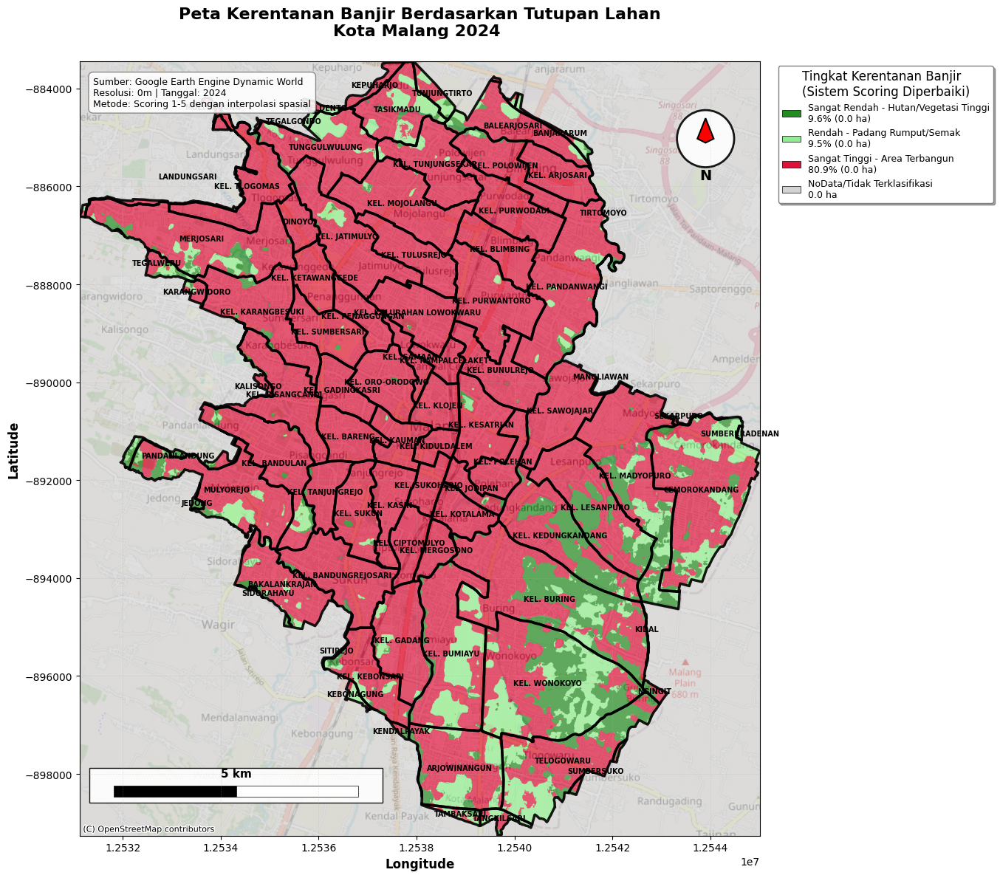

   Peta kerentanan banjir dengan sistem scoring diperbaiki selesai!

RINGKASAN ANALISIS KERENTANAN BANJIR - SISTEM SCORING DIPERBAIKI
TOTAL AREA YANG DINILAI: 0.00 ha

DISTRIBUSI KERENTANAN DENGAN SISTEM SCORING DIPERBAIKI:
• Sangat Rendah (Hutan/Vegetasi Tinggi):     0.00 ha (  9.6%)
• Rendah (Padang Rumput/Semak)        :     0.00 ha (  9.5%)
• Sedang (Lahan Pertanian)            :     0.00 ha (  0.0%)


In [ ]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm
import json
from rasterio import uint8
from pyproj import Transformer
from shapely.geometry import mapping
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText
from scipy.ndimage import generic_filter

# ==========================================
# KONFIGURASI DAN DOKUMENTASI METODOLOGI (DIPERBAIKI)
# ==========================================

# Dynamic World Classes Reference
DW_CLASSES = {
    0: "Water",
    1: "Trees",
    2: "Grass",
    3: "Flooded vegetation",
    4: "Crops",
    5: "Shrub and scrub",
    6: "Built-up area",
    7: "Bare ground",
    8: "Snow and ice"
}

# SISTEM SCORING KERENTANAN BANJIR YANG DIPERBAIKI
# Menggunakan skala 1-5 untuk konsistensi (0 untuk water, 9 untuk NoData)
FLOOD_VULNERABILITY_MAPPING = {
    0: {"score": 0, "label": "Badan Air", "reasoning": "Area air - tidak dinilai kerentanannya"},
    1: {"score": 1, "label": "Hutan/Vegetasi Tinggi", "reasoning": "Sangat rendah - kanopi tinggi, intersepsi hujan optimal, infiltrasi tinggi"},
    2: {"score": 2, "label": "Padang Rumput", "reasoning": "Rendah - penutupan sedang, infiltrasi baik"},
    3: {"score": 4, "label": "Vegetasi Tergenang", "reasoning": "Tinggi - area basah alami, mudah tergenang"},
    4: {"score": 3, "label": "Lahan Pertanian", "reasoning": "Sedang - infiltrasi terbatas, pengolahan tanah"},
    5: {"score": 2, "label": "Semak Belukar", "reasoning": "Rendah - vegetasi membantu infiltrasi meski tidak optimal"},
    6: {"score": 5, "label": "Area Terbangun", "reasoning": "Sangat tinggi - permukaan kedap air, runoff maksimal"},
    7: {"score": 4, "label": "Lahan Gundul", "reasoning": "Tinggi - tidak ada vegetasi, kompaksi tanah, runoff tinggi"},
    8: {"score": 9, "label": "Salju/Es", "reasoning": "Tidak relevan untuk Indonesia"}
}

# Labels untuk visualisasi yang lebih deskriptif
VULNERABILITY_LABELS = {
    0: 'Badan Air (Tidak dinilai)',
    1: 'Sangat Rendah - Hutan/Vegetasi Tinggi',
    2: 'Rendah - Padang Rumput/Semak',
    3: 'Sedang - Lahan Pertanian',
    4: 'Tinggi - Lahan Gundul/Vegetasi Basah',
    5: 'Sangat Tinggi - Area Terbangun',
    9: 'NoData/Tidak Terklasifikasi'
}

# Definisi warna yang lebih intuitif (hijau = aman, merah = bahaya)
VULNERABILITY_COLORS = {
    0: '#0077BE',   # Badan Air (Biru)
    1: '#228B22',   # Sangat Rendah (Hijau tua)
    2: '#90EE90',   # Rendah (Hijau muda)
    3: '#FFFF00',   # Sedang (Kuning)
    4: '#FF8C00',   # Tinggi (Orange)
    5: '#DC143C',   # Sangat Tinggi (Merah)
    9: '#D3D3D3'    # NoData (Abu-abu)
}

print("="*80)
print("ANALISIS KERENTANAN BANJIR TUTUPAN LAHAN KOTA MALANG 2024 (VERSI DIPERBAIKI)")
print("="*80)
print("Metodologi Skoring yang Diperbaiki:")
print("- Skor 0: Badan Air (tidak dinilai)")
print("- Skor 1: Sangat Rendah (hutan, vegetasi tinggi)")
print("- Skor 2: Rendah (padang rumput, semak belukar)")
print("- Skor 3: Sedang (lahan pertanian)")
print("- Skor 4: Tinggi (lahan gundul, vegetasi tergenang)")
print("- Skor 5: Sangat Tinggi (area terbangun)")
print("="*80)

# ==========================================
# 1. BACA DATA SPASIAL
# ==========================================

print("1. Membaca data spasial...")

# Baca shapefile batas administrasi Kota Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)
print(f"   Shapefile loaded: {len(gdf)} features")

# Baca raster Dynamic World (Tutupan Lahan)
raster_path = "/content/drive/MyDrive/ProjectUAS/Malang_LandCover_.tif"
raster = rasterio.open(raster_path)
print(f"   Raster loaded: {raster.width}x{raster.height}, CRS: {raster.crs}")

# ==========================================
# 2. PREPROCESSING DATA
# ==========================================

print("2. Preprocessing data...")

# Samakan proyeksi shapefile dengan raster
gdf = gdf.to_crs(raster.crs)
gdf_mercator = gdf.to_crs(epsg=3857)  # Untuk basemap

# Klip raster tutupan lahan dengan batas administrasi
geoms = [mapping(geom) for geom in gdf.geometry]
dw_clip, transform_clip = mask(raster, geoms, crop=True, filled=True, nodata=255)
dw_clip = dw_clip[0].astype(np.uint8)  # Ambil array 2D

print(f"   Raster clipped: {dw_clip.shape}")
print(f"   Unique DW values: {np.unique(dw_clip)}")

# Validasi data input
valid_dw_classes = np.array([0, 1, 2, 3, 4, 5, 6, 7, 8])
invalid_pixels = np.sum(~np.isin(dw_clip[dw_clip != 255], valid_dw_classes))
if invalid_pixels > 0:
    print(f"   WARNING: {invalid_pixels} pixel memiliki nilai DW tidak valid")

# ==========================================
# 3. SISTEM SKORING YANG DIPERBAIKI
# ==========================================

print("3. Menerapkan sistem skoring kerentanan banjir yang diperbaiki...")

# Inisialisasi array skor dengan NoData (9)
vulnerability_score = np.full_like(dw_clip, fill_value=9, dtype=np.uint8)

# Buat mask untuk pixel valid (dalam batas administrasi)
valid_mask = (dw_clip != 255)

# Terapkan scoring berdasarkan mapping yang diperbaiki
for dw_class, mapping_info in FLOOD_VULNERABILITY_MAPPING.items():
    score = mapping_info["score"]
    class_mask = (dw_clip == dw_class) & valid_mask

    if np.any(class_mask):
        vulnerability_score[class_mask] = score
        pixel_count = np.sum(class_mask)
        print(f"   DW Class {dw_class} ({DW_CLASSES[dw_class]}): {pixel_count:,} pixel -> Skor {score}")

# ==========================================
# 4. PENANGANAN NoData DENGAN INTERPOLASI SPASIAL
# ==========================================

print("4. Menangani pixel NoData dengan interpolasi spasial...")

def weighted_mode_filter(arr):
    """
    Filter yang menggunakan weighted mode berdasarkan jarak
    Memberikan prioritas pada nilai yang lebih dekat
    """
    # Ambil nilai tengah sebagai referensi
    center_idx = len(arr) // 2

    # Hanya ambil nilai valid (bukan NoData)
    valid_vals = arr[(arr != 9) & (arr != 255)]

    if len(valid_vals) == 0:
        return 9  # Tetap NoData jika tidak ada tetangga valid

    # Hitung bobot berdasarkan jarak dari center
    weights = []
    values = []

    for i, val in enumerate(arr):
        if val != 9 and val != 255:  # Nilai valid
            # Hitung jarak Manhattan dari center (untuk kernel 3x3)
            row, col = divmod(i, 3)
            center_row, center_col = 1, 1
            distance = abs(row - center_row) + abs(col - center_col)
            weight = 1.0 / (distance + 1)  # Semakin dekat, semakin tinggi bobotnya

            weights.append(weight)
            values.append(val)

    if not values:
        return 9

    # Weighted voting
    unique_vals = np.unique(values)
    weighted_counts = {}

    for val in unique_vals:
        weighted_counts[val] = sum(w for v, w in zip(values, weights) if v == val)

    # Kembalikan nilai dengan bobot tertinggi
    return max(weighted_counts.keys(), key=lambda x: weighted_counts[x])

# Lakukan interpolasi iteratif dengan maksimal 3 iterasi
print("   Melakukan interpolasi spasial untuk NoData...")

for iteration in range(3):
    # Hitung pixel NoData yang perlu diisi
    nodata_mask = (vulnerability_score == 9) & valid_mask
    pixels_to_fill = np.sum(nodata_mask)

    if pixels_to_fill == 0:
        print(f"   Iterasi {iteration + 1}: Tidak ada pixel NoData tersisa")
        break

    print(f"   Iterasi {iteration + 1}: {pixels_to_fill:,} pixel NoData akan diinterpolasi")

    # Terapkan weighted mode filter
    filled_scores = generic_filter(vulnerability_score, weighted_mode_filter,
                                 size=3, mode='constant', cval=9)

    # Update hanya pixel NoData
    vulnerability_score[nodata_mask] = filled_scores[nodata_mask]

# Untuk pixel yang masih NoData, gunakan strategi fallback
remaining_nodata = (vulnerability_score == 9) & valid_mask
if np.sum(remaining_nodata) > 0:
    print(f"   {np.sum(remaining_nodata):,} pixel masih NoData setelah interpolasi")

    # Gunakan skor sedang (3) sebagai default untuk area yang tidak terklasifikasi
    vulnerability_score[remaining_nodata] = 3
    print(f"   Pixel tersisa diset sebagai kerentanan Sedang (skor 3)")

print(f"   Interpolasi selesai. Final NoData pixels: {np.sum(vulnerability_score == 9):,}")

# ==========================================
# 5. VALIDASI DAN QUALITY ASSURANCE
# ==========================================

def comprehensive_validation(vulnerability_score, dw_clip):
    """Validasi komprehensif hasil scoring"""
    print("\n" + "="*60)
    print("VALIDASI KOMPREHENSIF HASIL SCORING")
    print("="*60)

    # 1. Distribusi skor
    unique_scores, counts = np.unique(vulnerability_score, return_counts=True)
    total_valid = np.sum((vulnerability_score != 9) & (vulnerability_score != 0))

    print("1. DISTRIBUSI SKOR KERENTANAN:")
    for score, count in zip(unique_scores, counts):
        if score in VULNERABILITY_LABELS:
            if score == 0:
                print(f"   Skor {score}: {count:8,} pixel - {VULNERABILITY_LABELS[score]}")
            elif score == 9:
                print(f"   Skor {score}: {count:8,} pixel - {VULNERABILITY_LABELS[score]}")
            else:
                pct = (count / total_valid) * 100 if total_valid > 0 else 0
                print(f"   Skor {score}: {count:8,} pixel ({pct:5.1f}%) - {VULNERABILITY_LABELS[score]}")

    # 2. Analisis keseimbangan kerentanan
    print(f"\n2. ANALISIS KESEIMBANGAN (dari {total_valid:,} pixel yang dinilai):")

    very_low = np.sum(vulnerability_score == 1)
    low = np.sum(vulnerability_score == 2)
    medium = np.sum(vulnerability_score == 3)
    high = np.sum(vulnerability_score == 4)
    very_high = np.sum(vulnerability_score == 5)

    categories = {
        'Sangat Rendah': very_low,
        'Rendah': low,
        'Sedang': medium,
        'Tinggi': high,
        'Sangat Tinggi': very_high
    }

    for category, count in categories.items():
        pct = (count / total_valid) * 100 if total_valid > 0 else 0
        print(f"   {category:12}: {count:8,} pixel ({pct:5.1f}%)")

    # 3. Quality checks
    print(f"\n3. QUALITY CHECKS:")

    # Check proporsi area berisiko tinggi
    high_risk = high + very_high
    high_risk_pct = (high_risk / total_valid) * 100 if total_valid > 0 else 0
    print(f"   Area berisiko tinggi (skor 4-5): {high_risk_pct:.1f}%")

    if high_risk_pct > 60:
        print("   ⚠️  WARNING: Area berisiko tinggi >60%, periksa akurasi data")
    elif high_risk_pct < 20:
        print("   ⚠️  INFO: Area berisiko tinggi <20%, mungkin area rural/natural")
    else:
        print("   ✓  Proporsi area berisiko tinggi dalam rentang normal")

    # Check NoData
    nodata_pct = (np.sum(vulnerability_score == 9) / len(vulnerability_score.flat)) * 100
    print(f"   Persentase NoData: {nodata_pct:.2f}%")

    if nodata_pct > 5:
        print("   ⚠️  WARNING: NoData >5%, periksa kualitas input data")
    else:
        print("   ✓  Persentase NoData acceptable")

    # Check konsistensi dengan input DW
    print(f"\n4. KONSISTENSI DENGAN DATA INPUT:")
    built_up_pixels = np.sum(dw_clip == 6)  # Built-up area
    very_high_vuln = np.sum(vulnerability_score == 5)

    consistency_ratio = very_high_vuln / built_up_pixels if built_up_pixels > 0 else 0
    print(f"   Built-up area (DW=6): {built_up_pixels:,} pixel")
    print(f"   Kerentanan sangat tinggi (skor=5): {very_high_vuln:,} pixel")
    print(f"   Rasio konsistensi: {consistency_ratio:.2f}")

    if 0.8 <= consistency_ratio <= 1.2:
        print("   ✓  Konsistensi baik antara input dan output")
    else:
        print("   ⚠️  Perhatikan konsistensi scoring dengan data input")

    print("="*60)
    return True

# Jalankan validasi komprehensif
comprehensive_validation(vulnerability_score, dw_clip)

# ==========================================
# 6. PERHITUNGAN STATISTIK LUAS AREA
# ==========================================

print("6. Menghitung statistik luas area...")

# Hitung luas area per pixel
pixel_area_m2 = abs(transform_clip[0] * transform_clip[4])
pixel_area_ha = pixel_area_m2 / 10000

print(f"   Resolusi pixel: {abs(transform_clip[0]):.1f} x {abs(transform_clip[4]):.1f} meter")
print(f"   Luas per pixel: {pixel_area_ha:.4f} hektar")

# Statistik detail per kategori kerentanan
unique_scores, counts = np.unique(vulnerability_score, return_counts=True)
total_assessed = np.sum((vulnerability_score != 9) & (vulnerability_score != 0))

print(f"\nSTATISTIK LUAS AREA BERDASARKAN TINGKAT KERENTANAN:")
print("-" * 80)

for score, count in zip(unique_scores, counts):
    area_ha = count * pixel_area_ha

    if score == 0:  # Water
        print(f"{VULNERABILITY_LABELS[score]:40}: {count:8,} pixel = {area_ha:8.2f} ha")
    elif score == 9:  # NoData
        print(f"{VULNERABILITY_LABELS[score]:40}: {count:8,} pixel = {area_ha:8.2f} ha")
    else:  # Vulnerability scores
        pct = (count / total_assessed) * 100 if total_assessed > 0 else 0
        print(f"{VULNERABILITY_LABELS[score]:40}: {count:8,} pixel ({pct:5.1f}%) = {area_ha:8.2f} ha")

total_area_assessed = total_assessed * pixel_area_ha
total_area_all = len(vulnerability_score.flat) * pixel_area_ha

print("-" * 80)
print(f"{'TOTAL AREA YANG DINILAI':40}: {total_assessed:8,} pixel (100.0%) = {total_area_assessed:8.2f} ha")
print(f"{'TOTAL AREA KESELURUHAN':40}: {len(vulnerability_score.flat):8,} pixel = {total_area_all:8.2f} ha")

# ==========================================
# 7. VISUALISASI PETA YANG DIPERBAIKI
# ==========================================

print("7. Membuat visualisasi peta kerentanan banjir...")

# Setup colormap berdasarkan skor yang ada
scores_present = sorted([s for s in unique_scores if s in VULNERABILITY_COLORS])
colors_list = [VULNERABILITY_COLORS[score] for score in scores_present]
cmap = ListedColormap(colors_list)

# Setup bounds untuk normalisasi
bounds = [score - 0.5 for score in scores_present] + [scores_present[-1] + 0.5]
norm = BoundaryNorm(bounds, cmap.N)

# ==========================================
# 8. PLOTTING DENGAN ENHANCED LAYOUT
# ==========================================

fig, ax = plt.subplots(figsize=(16, 12), facecolor='white')

# Reprojeksi dan plotting (menggunakan kode yang sama seperti sebelumnya)
try:
    from rasterio.warp import reproject, Resampling, calculate_default_transform
    from rasterio.crs import CRS

    bounds_mercator = gdf_mercator.total_bounds
    dst_crs = CRS.from_epsg(3857)
    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        raster.crs, dst_crs, raster.width, raster.height, *raster.bounds
    )

    vulnerability_score_mercator = np.empty((height_mercator, width_mercator), dtype=np.uint8)
    reproject(
        source=vulnerability_score,
        destination=vulnerability_score_mercator,
        src_transform=transform_clip,
        src_crs=raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    im = show(vulnerability_score_mercator, transform=transform_mercator, ax=ax, cmap=cmap, norm=norm)

    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.3)
        basemap_added = True
    except:
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.3)
            basemap_added = True
        except:
            basemap_added = False

    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5, alpha=0.9)
    ax.set_xlim(bounds_mercator[0], bounds_mercator[2])
    ax.set_ylim(bounds_mercator[1], bounds_mercator[3])

    use_mercator = True
    gdf_to_use = gdf_mercator

except Exception as e:
    print(f"   Menggunakan proyeksi asli: {e}")
    im = show(vulnerability_score, transform=transform_clip, ax=ax, cmap=cmap, norm=norm)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5, alpha=0.9)
    use_mercator = False
    gdf_to_use = gdf

# Enhanced title
title = "Peta Kerentanan Banjir Berdasarkan Tutupan Lahan\nKota Malang 2024 "
ax.set_title(title, fontsize=16, fontweight='bold', pad=25)

# Tambahkan nama wilayah dengan styling yang lebih baik
for idx, row in gdf_to_use.iterrows():
    if not row.geometry.centroid.is_empty:
        ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
                row['NAMOBJ'], fontsize=7, ha='center', va='center',
                color='black', weight='bold',
           )

# Enhanced legend dengan informasi yang lebih detail
legend_elements = []
for score in scores_present:
    if score in unique_scores:
        count = counts[unique_scores == score][0]
        area_ha = count * pixel_area_ha

        if score == 0:
            label_text = f"{VULNERABILITY_LABELS[score]}\n{area_ha:.1f} ha"
        elif score == 9:
            label_text = f"{VULNERABILITY_LABELS[score]}\n{area_ha:.1f} ha"
        else:
            pct = (count / total_assessed) * 100 if total_assessed > 0 else 0
            label_text = f"{VULNERABILITY_LABELS[score]}\n{pct:.1f}% ({area_ha:.1f} ha)"

        legend_elements.append(
            Patch(facecolor=VULNERABILITY_COLORS[score],
                  edgecolor='black', linewidth=0.5,
                  label=label_text)
        )

ax.legend(
    handles=legend_elements,
    title='Tingkat Kerentanan Banjir\n(Sistem Scoring Diperbaiki)',
    title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=9,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True
)

# ==========================================
# 9. SCALE BAR DAN KOMPLEMEN PETA
# ==========================================

def add_scalebar(ax, length_km=5, location='lower left'):
    """Enhanced scale bar"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        length_m = length_km * 1000
        scale_length = length_m
    else:
        scale_length = length_km / 111.0

    x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
    y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    bar_height = (ylim[1] - ylim[0]) * 0.015

    # Background
    bg_rect = Rectangle((x_pos - scale_length*0.1, y_pos - bar_height*0.5),
                       scale_length*1.2, bar_height*3,
                       facecolor='white', edgecolor='black', alpha=0.9, linewidth=1)
    ax.add_patch(bg_rect)

    # Scale segments
    for i in range(2):
        color = 'black' if i % 2 == 0 else 'white'
        rect = Rectangle((x_pos + i*scale_length/2, y_pos), scale_length/2, bar_height,
                        facecolor=color, edgecolor='black', linewidth=0.5)
        ax.add_patch(rect)

    ax.text(x_pos + scale_length/2, y_pos + bar_height*2,
            f"{length_km} km", ha='center', va='center', fontsize=11, weight='bold')

def add_north_arrow(ax, location='upper right'):
    """Enhanced north arrow"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.08
    y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * 0.06

    # Background circle
    circle = plt.Circle((x_center, y_center), arrow_size * 0.7,
                       facecolor='white', edgecolor='black', alpha=0.9, linewidth=2)
    ax.add_patch(circle)

    # North arrow
    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.5],
        [x_center - arrow_size * 0.2, y_center],
        [x_center, y_center - arrow_size * 0.1],
        [x_center + arrow_size * 0.2, y_center],
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1.5)
    ax.add_patch(arrow)

    ax.text(x_center, y_center - arrow_size * 0.9, 'N',
            ha='center', va='center', fontsize=14, weight='bold')

# Tambahkan elemen peta
add_scalebar(ax, length_km=5)
add_north_arrow(ax)

# Grid dan styling
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.3)
ax.set_xlabel("Longitude", fontsize=12, weight='bold')
ax.set_ylabel("Latitude", fontsize=12, weight='bold')

# Enhanced metadata
metadata_text = (f"Sumber: Google Earth Engine Dynamic World\n"
                f"Resolusi: {abs(transform_clip[0]):.0f}m | "
                f"Tanggal: 2024\n"
                f"Metode: Scoring 1-5 dengan interpolasi spasial")

ax.text(0.02, 0.98, metadata_text, transform=ax.transAxes, fontsize=9,
        verticalalignment='top',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='gray'))

plt.tight_layout()
plt.show()

print("   Peta kerentanan banjir dengan sistem scoring diperbaiki selesai!")

# ==========================================
# 10. RINGKASAN ANALISIS FINAL
# ==========================================

print("\n" + "="*80)
print("RINGKASAN ANALISIS KERENTANAN BANJIR - SISTEM SCORING DIPERBAIKI")
print("="*80)

# Perhitungan area berdasarkan kategori kerentanan
area_very_low = np.sum(vulnerability_score == 1) * pixel_area_ha
area_low = np.sum(vulnerability_score == 2) * pixel_area_ha
area_medium = np.sum(vulnerability_score == 3) * pixel_area_ha
area_high = np.sum(vulnerability_score == 4) * pixel_area_ha
area_very_high = np.sum(vulnerability_score == 5) * pixel_area_ha

print(f"TOTAL AREA YANG DINILAI: {total_area_assessed:.2f} ha")
print()
print("DISTRIBUSI KERENTANAN DENGAN SISTEM SCORING DIPERBAIKI:")
print(f"• Sangat Rendah (Hutan/Vegetasi Tinggi): {area_very_low:8.2f} ha ({area_very_low/total_area_assessed*100:5.1f}%)")
print(f"• Rendah (Padang Rumput/Semak)        : {area_low:8.2f} ha ({area_low/total_area_assessed*100:5.1f}%)")
print(f"• Sedang (Lahan Pertanian)            : {area_medium:8.2f} ha ({area_medium/total_area_assessed*100:5.1f}%)")


In [ ]:
# === 9. Simpan hasil skoring sebagai GeoTIFF ===
output_skor_tif_path = "/content/drive/MyDrive/Output/Skoring_DynamicWorld.tif" # Ganti dengan path yang Anda inginkan

# Perbarui profil untuk output GeoTIFF
# Pastikan tipe data sesuai dengan skor_landcover (uint8)
output_profile_skor = raster.profile.copy() # Ambil profil dari raster asli
output_profile_skor.update({
    "driver": "GTiff",
    "height": vulnerability_score.shape[0],
    "width":vulnerability_score.shape[1],
    "transform": transform_clip, # Gunakan transform dari hasil clipping
    "crs": raster.crs, # Gunakan CRS dari raster input
    "dtype": vulnerability_score.dtype, # Pastikan dtype sesuai dengan array skor_landcover (np.uint8)
    "nodata": 255 # Pastikan nodata value juga diset (sesuai dengan inisialisasi skor_landcover)
})

try:
    with rasterio.open(output_skor_tif_path, 'w', **output_profile_skor) as dst:
        dst.write(vulnerability_score, 1) # Tulis array skor_landcover ke band 1
    print(f"\nFile GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: {output_skor_tif_path}")
except Exception as e:
    print(f"\nError saat menyimpan GeoTIFF Skor Kerentanan Banjir: {e}")


File GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: /content/drive/MyDrive/Output/Skoring_DynamicWorld.tif


##DEM MALANG


STATISTIK ELEVASI:
Elevasi minimum: 391.00 m
Elevasi maksimum: 706.00 m
Elevasi rata-rata: 474.83 m
Standar deviasi: 48.32 m

DEBUG: Nilai unik dalam klasifikasi:
Unique values: [  0   1 255]
Counts: [ 93232  32191 117713]

Distribusi Klasifikasi Elevasi DEM - Kota Malang:
Kelas 0 (Dataran rendah - < 500m): 93,232 piksel (74.33%)
Kelas 1 (Dataran Menengah - 500-750m): 32,191 piksel (25.67%)
NoData (luar batas): 117,713 piksel
Total piksel valid: 125,423


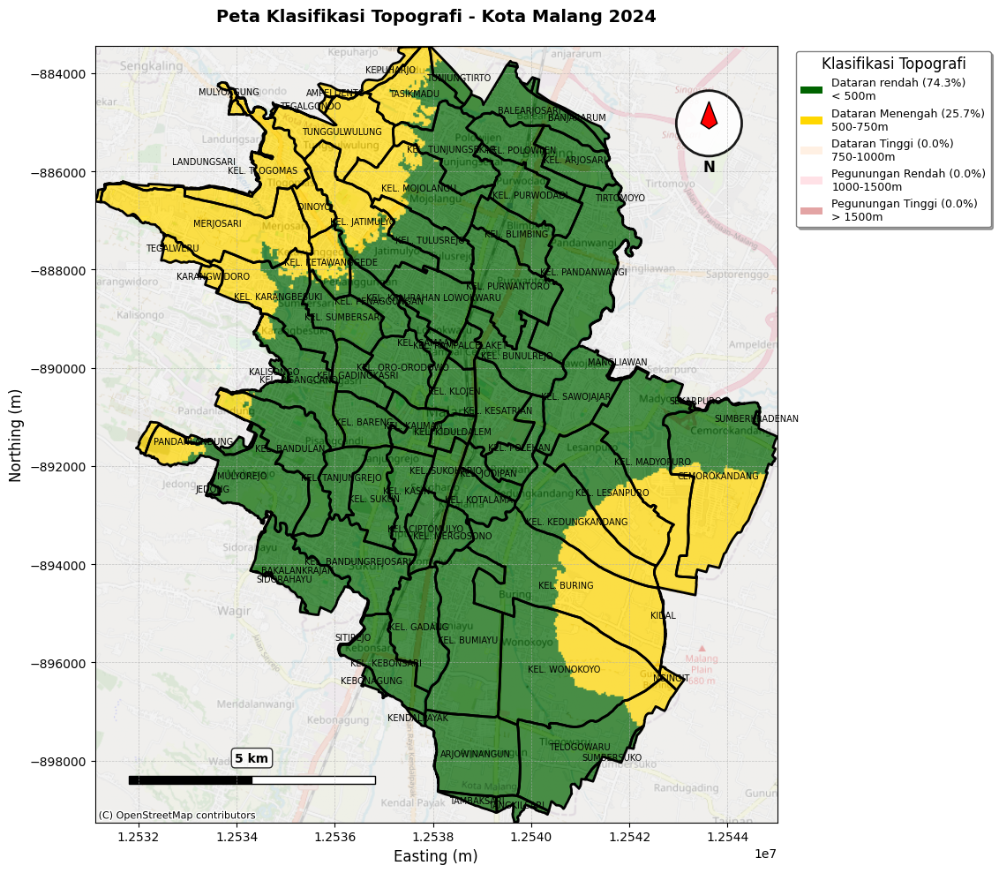


ANALISIS KLASIFIKASI TOPOGRAFI KOTA MALANG 2024
Resolusi piksel: 0.00 x 0.00 meter
Luas per piksel: 0.0000 hektar

Dataran rendah       (< 500m      ):   93,232 piksel (74.33%) =     0.00 ha
Dataran Menengah     (500-750m    ):   32,191 piksel (25.67%) =     0.00 ha
TOTAL                              :  125,423 piksel (100.00%) =     0.00 ha

ANALISIS STATISTIK ELEVASI DETAIL

Dataran rendah (< 500m):
  - Elevasi minimum : 391.00 m
  - Elevasi maksimum: 499.00 m
  - Elevasi rata-rata: 451.73 m
  - Standar deviasi : 24.34 m

Dataran Menengah (500-750m):
  - Elevasi minimum : 500.00 m
  - Elevasi maksimum: 706.00 m
  - Elevasi rata-rata: 541.71 m
  - Standar deviasi : 36.95 m


In [ ]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from rasterio.mask import mask
from rasterio.plot import show
from shapely.geometry import mapping
import rasterio
from matplotlib.colors import ListedColormap, BoundaryNorm

# Import tambahan untuk basemap, scale bar, dan north arrow
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText
from matplotlib.patches import Patch

# 1. Baca shapefile batas administrasi Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# 2. Baca raster DEM (Digital Elevation Model)
dem_path = "/content/drive/MyDrive/EarthEngine/DEM_Malang.tif"  # Ganti dengan path DEM Anda
dem_raster = rasterio.open(dem_path)

# 3. Samakan proyeksi shapefile dengan raster
gdf = gdf.to_crs(dem_raster.crs)
gdf_mercator = gdf.to_crs(epsg=3857)

# 4. Klip raster DEM dengan batas administrasi
geoms = [mapping(geom) for geom in gdf.geometry]
dem_clip, transform_clip = mask(dem_raster, geoms, crop=True, filled=True, nodata=-9999)
dem_clip = dem_clip[0]  # Ambil array 2D

# Hapus nilai NoData untuk analisis
valid_mask = dem_clip != -9999
dem_valid = dem_clip[valid_mask]

# 5. Klasifikasi elevasi berdasarkan rentang ketinggian
print("STATISTIK ELEVASI:")
print(f"Elevasi minimum: {np.min(dem_valid):.2f} m")
print(f"Elevasi maksimum: {np.max(dem_valid):.2f} m")
print(f"Elevasi rata-rata: {np.mean(dem_valid):.2f} m")
print(f"Standar deviasi: {np.std(dem_valid):.2f} m")
print()

# ========================================
# KLASIFIKASI ELEVASI (MODIFIKASI DI SINI)
# ========================================
# Buat array klasifikasi
klasifikasi_elevasi = np.full_like(dem_clip, fill_value=255, dtype=np.uint8)  # 255 = NoData

# Definisi kelas elevasi berdasarkan gambar yang diberikan
KELAS_ELEVASI = {
    0: {"range": (0, 500), "nama": "Dataran rendah", "deskripsi": "< 500m"},
    1: {"range": (500, 750), "nama": "Dataran Menengah", "deskripsi": "500-750m"},
    2: {"range": (750, 1000), "nama": "Dataran Tinggi", "deskripsi": "750-1000m"},
    3: {"range": (1000, 1500), "nama": "Pegunungan Rendah", "deskripsi": "1000-1500m"},
    4: {"range": (1500, float('inf')), "nama": "Pegunungan Tinggi", "deskripsi": "> 1500m"}
}

# Aplikasikan klasifikasi
for kelas_id, info in KELAS_ELEVASI.items():
    min_elev, max_elev = info["range"]
    if max_elev == float('inf'):
        mask_kelas = (dem_clip >= min_elev) & valid_mask
    else:
        mask_kelas = (dem_clip >= min_elev) & (dem_clip < max_elev) & valid_mask

    klasifikasi_elevasi[mask_kelas] = kelas_id

# ========================================
# ANALISIS DISTRIBUSI ELEVASI
# ========================================
unique, counts = np.unique(klasifikasi_elevasi, return_counts=True)
print("DEBUG: Nilai unik dalam klasifikasi:")
print(f"Unique values: {unique}")
print(f"Counts: {counts}")
print()

print("Distribusi Klasifikasi Elevasi DEM - Kota Malang:")
total_valid_pixels = 0
for u, c in zip(unique, counts):
    if u != 255:
        total_valid_pixels += c
        percentage = (c / (klasifikasi_elevasi != 255).sum()) * 100
        kelas_info = KELAS_ELEVASI.get(u, {"nama": "Tidak Dikenal", "deskripsi": "N/A"})
        print(f"Kelas {u} ({kelas_info['nama']} - {kelas_info['deskripsi']}): {c:,} piksel ({percentage:.2f}%)")

print(f"NoData (luar batas): {(klasifikasi_elevasi == 255).sum():,} piksel")
print(f"Total piksel valid: {total_valid_pixels:,}")

# 7. Visualisasi peta klasifikasi elevasi
# Warna untuk setiap kelas elevasi (sesuai gambar)
color_mapping = {
    0: '#006400',  # Sangat Rawan (hijau tua) - original image color looks like dark green
    1: '#FFD700',  # Rawan (kuning) - original image color looks like yellow
    2: '#FFDAB9',  # Cukup Rawan (peach/jingga muda) - original image color looks like light orange/peach
    3: '#FFB6C1',  # Rawan Rendah (pink muda) - original image color looks like light pink
    4: '#b91c1c',  # Tidak Rawan (coklat muda) - original image color looks like light brown
    255: '#f0f0f0' # NoData (abu-abu muda)
}

# Buat colormap untuk kelas yang ada dalam data
data_values = unique[unique != 255]  # Exclude NoData
all_values = np.concatenate([data_values, [255]])  # Include NoData
colors_list = [color_mapping[val] for val in all_values]
cmap = ListedColormap(colors_list)

# Buat bounds yang sesuai dengan nilai data
bounds = []
for val in all_values:
    bounds.append(val)
bounds.append(all_values[-1] + 1)  # Tambah batas akhir

norm = BoundaryNorm(bounds, cmap.N)

# 8. Plotting dengan basemap
fig, ax = plt.subplots(figsize=(12, 10), facecolor='white')

# Reprojeksi raster ke Web Mercator untuk basemap
try:
    bounds = gdf_mercator.total_bounds

    # Reproject raster data ke Web Mercator
    from rasterio.warp import reproject, Resampling
    from rasterio.crs import CRS

    dst_crs = CRS.from_epsg(3857)

    from rasterio.warp import calculate_default_transform
    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        dem_raster.crs, dst_crs, dem_raster.width, dem_raster.height, *dem_raster.bounds
    )

    # Reproject klasifikasi_elevasi ke Web Mercator
    klasifikasi_mercator = np.empty((height_mercator, width_mercator), dtype=np.uint8)
    reproject(
        source=klasifikasi_elevasi,
        destination=klasifikasi_mercator,
        src_transform=transform_clip,
        src_crs=dem_raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Tampilkan raster yang sudah diproyeksi
    im = show(klasifikasi_mercator, transform=transform_mercator, ax=ax, cmap=cmap, norm=norm)

    # Tambahkan basemap
    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.3)
        basemap_added = True
    except:
        print("Warning: Tidak dapat menambahkan basemap OpenStreetMap, menggunakan alternatif...")
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.3)
            basemap_added = True
        except:
            print("Warning: Basemap tidak tersedia, melanjutkan tanpa basemap")
            basemap_added = False

    # Tambahkan batas administrasi
    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2)

    # Set extent
    ax.set_xlim(bounds[0], bounds[2])
    ax.set_ylim(bounds[1], bounds[3])

    use_mercator = True

except Exception as e:
    print(f"Warning: Gagal reprojects ke Web Mercator: {e}")
    print("Menggunakan proyeksi asli...")

    # Fallback ke proyeksi asli
    im = show(klasifikasi_elevasi, transform=transform_clip, ax=ax, cmap=cmap, norm=norm)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=2)
    use_mercator = False
    basemap_added = False

# Tambahkan judul
title = "Peta Klasifikasi Topografi - Kota Malang 2024"
ax.set_title(title, fontsize=14, fontweight='bold', pad=20)

# Label nama wilayah
gdf_to_use = gdf_mercator if use_mercator else gdf
for idx, row in gdf_to_use.iterrows():
    if row.geometry.centroid.is_empty:
        continue
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
            row['NAMOBJ'], fontsize=7, ha='center', va='center',
            color='black')

# Legenda - tampilkan semua kelas elevasi
legend_elements = []
all_classes = sorted(list(KELAS_ELEVASI.keys()))

for class_id in all_classes:
    kelas_info = KELAS_ELEVASI[class_id]

    # Check if the class_id exists in the unique values from the classified raster
    if class_id in unique:
        count_for_legend = counts[unique == class_id][0]
        percentage_for_legend = (count_for_legend / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        label_text = f"{kelas_info['nama']} ({percentage_for_legend:.1f}%)\n{kelas_info['deskripsi']}"
        alpha = 1.0  # Opaque for categories present in data
    else:
        label_text = f"{kelas_info['nama']} (0.0%)\n{kelas_info['deskripsi']}"
        alpha = 0.4  # Transparent for categories not present in data

    legend_elements.append(
        Patch(facecolor=color_mapping[class_id], alpha=alpha, label=label_text)
    )

ax.legend(
    handles=legend_elements,
    title='Klasifikasi Topografi',
    title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=9,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True,
    ncol=1
)

# Koordinat dan grid
if use_mercator:
    ax.set_xlabel("Easting (m)", fontsize=12)
    ax.set_ylabel("Northing (m)", fontsize=12)
else:
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# ========================================
# TAMBAHKAN SCALE BAR
# ========================================
def add_scalebar(ax, length_km=5, location='lower left'):
    """Tambahkan scale bar ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        length_m = length_km * 1000
        scale_length = length_m
        unit_text = f"{length_km} km"
    else:
        # Approximate conversion for non-mercator, highly dependent on latitude
        # This is a simplification and less accurate than proper CRS-aware scale bar.
        # For more accuracy, consider using geopandas.plotting.plot_scale
        scale_length = length_km / 111.32  # Approx degrees per km at equator
        unit_text = f"{length_km} km"

    # Posisi scale bar
    if location == 'lower right':
        x_pos = xlim[1] - (xlim[1] - xlim[0]) * 0.25
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    elif location == 'lower left':
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    else: # Default to lower left if location is invalid
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05

    # Gambar scale bar
    scale_bar1 = Rectangle((x_pos, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                            facecolor='black', edgecolor='black')
    ax.add_patch(scale_bar1)
    scale_bar2 = Rectangle((x_pos + scale_length / 2, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                            facecolor='white', edgecolor='black')
    ax.add_patch(scale_bar2)

    # Tambahkan teks
    ax.text(x_pos + scale_length/2, y_pos + (ylim[1] - ylim[0]) * 0.025,
            unit_text, ha='center', va='bottom', fontsize=10, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# ========================================
# TAMBAHKAN NORTH ARROW (KOMPAS)
# ========================================
def add_north_arrow(ax, location='upper right', size=0.1):
    """Tambahkan panah utara ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if location == 'upper right':
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    elif location == 'upper left':
        x_center = xlim[0] + (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    else: # Default to upper right if location is invalid
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1

    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * size

    # Gambar lingkaran latar
    circle = plt.Circle((x_center, y_center), arrow_size * 0.6,
                        facecolor='white', edgecolor='black', alpha=0.9, linewidth=2)
    ax.add_patch(circle)

    # Gambar panah utara
    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.4],  # Ujung atas
        [x_center - arrow_size * 0.15, y_center],  # Kiri
        [x_center, y_center - arrow_size * 0.1],   # Bawah tengah
        [x_center + arrow_size * 0.15, y_center],  # Kanan
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1)
    ax.add_patch(arrow)

    # Tambahkan teks "N"
    ax.text(x_center, y_center - arrow_size * 0.8, 'N',
            ha='center', va='center', fontsize=12, weight='bold')

# Tambahkan scale bar dan north arrow
add_scalebar(ax, length_km=5, location='lower left')
add_north_arrow(ax, location='upper right', size=0.08)

plt.tight_layout()
plt.show()

# 9. Analisis statistik elevasi
print("\n" + "="*60)
print("ANALISIS KLASIFIKASI TOPOGRAFI KOTA MALANG 2024")
print("="*60)

# Hitung luas area (asumsi resolusi piksel)
pixel_area_m2 = abs(transform_clip[0] * transform_clip[4])  # Luas per piksel dalam m²
pixel_area_ha = pixel_area_m2 / 10000  # Konversi ke hektar

print(f"Resolusi piksel: {abs(transform_clip[0]):.2f} x {abs(transform_clip[4]):.2f} meter")
print(f"Luas per piksel: {pixel_area_ha:.4f} hektar")
print()

# Analisis per kategori elevasi
for u in sorted(unique):
    if u != 255 and u in KELAS_ELEVASI:
        count = counts[unique == u][0]
        percentage = (count / total_valid_pixels) * 100
        area_ha = count * pixel_area_ha
        kelas_info = KELAS_ELEVASI[u]
        print(f"{kelas_info['nama']:20} ({kelas_info['deskripsi']:12}): {count:8,} piksel ({percentage:5.2f}%) = {area_ha:8.2f} ha")

total_area_ha = total_valid_pixels * pixel_area_ha
print(f"{'TOTAL':35}: {total_valid_pixels:8,} piksel (100.00%) = {total_area_ha:8.2f} ha")

# ========================================
# ANALISIS TAMBAHAN UNTUK DEM
# ========================================
print("\n" + "="*60)
print("ANALISIS STATISTIK ELEVASI DETAIL")
print("="*60)

# Statistik per kelas elevasi
for kelas_id in sorted(data_values):
    if kelas_id in KELAS_ELEVASI:
        kelas_info = KELAS_ELEVASI[kelas_id]
        mask_kelas = klasifikasi_elevasi == kelas_id
        elevasi_kelas = dem_clip[mask_kelas]

        if len(elevasi_kelas) > 0:
            print(f"\n{kelas_info['nama']} ({kelas_info['deskripsi']}):")
            print(f"  - Elevasi minimum : {np.min(elevasi_kelas):.2f} m")
            print(f"  - Elevasi maksimum: {np.max(elevasi_kelas):.2f} m")
            print(f"  - Elevasi rata-rata: {np.mean(elevasi_kelas):.2f} m")
            print(f"  - Standar deviasi : {np.std(elevasi_kelas):.2f} m")

In [ ]:
import rasterio

# Simpan hasil klasifikasi ke Google Drive
with rasterio.open(
    "/content/drive/MyDrive/ProjectUAS/klasifikasi_topografi_malang.tif",
    'w',
    driver='GTiff',
    height=klasifikasi_elevasi.shape[0],
    width=klasifikasi_elevasi.shape[1],
    count=1,
    dtype=klasifikasi_elevasi.dtype,
    crs=dem_raster.crs,
    transform=transform_clip,
    nodata=255
) as dst:
    dst.write(klasifikasi_elevasi, 1)

print("✓ File tersimpan di Google Drive!")

✓ File tersimpan di Google Drive!


## SKORING DEM MALANG


Statistik Elevasi Kota Malang:
Elevasi minimum: 391.00 meter
Elevasi maksimum: 706.00 meter
Elevasi rata-rata: 474.83 meter
Elevasi median: 464.00 meter

Analisis Percentile Elevasi:
P10 (10% terendah): 422.00 m
P25 (25% terendah): 440.00 m
P50 (Median): 464.00 m
P75 (75% terendah): 501.00 m
P90 (90% terendah): 542.00 m

Threshold Kerentanan Banjir Berdasarkan Elevasi:
Sangat Rentan (Skor 5): ≤ 435.00 m
Rentan (Skor 4): 435.00 - 453.00 m
Cukup Rentan (Skor 3): 453.00 - 476.00 m
Kurang Rentan (Skor 2): 476.00 - 510.00 m
Tidak Rentan (Skor 1): > 510.00 m

DEBUG: Distribusi Skor Kerentanan Banjir:
Unique values: [0 1 2 3 4 5]
Counts: [117713  25003  24846  24904  25050  25620]

Distribusi Kerentanan Banjir Berdasarkan Elevasi:
------------------------------------------------------------
Skor 1 (Tidak Rentan (>510m)): 25,003 piksel (19.93%)
Skor 2 (Kurang Rentan (476-510m)): 24,846 piksel (19.81%)
Skor 3 (Cukup Rentan (453-476m)): 24,904 piksel (19.86%)
Skor 4 (Rentan (435-453m)): 25,050 p

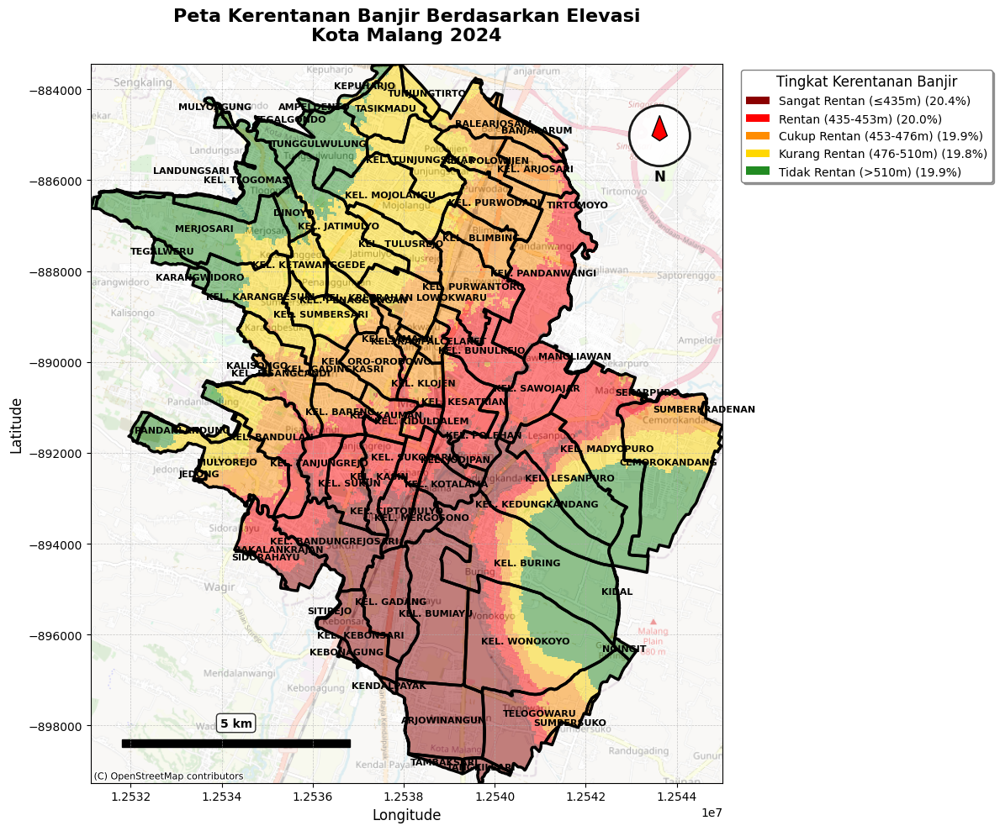

In [ ]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm
import json
from rasterio import uint8
from pyproj import Transformer
from shapely.geometry import mapping
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText

# 1. Baca shapefile batas administrasi Kota Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# === 2. Baca raster DEM/Elevasi ===
dem_path = "/content/drive/MyDrive/EarthEngine/DEM_Malang.tif"
dem_raster = rasterio.open(dem_path)

# 3. Samakan proyeksi shapefile dengan raster
gdf = gdf.to_crs(dem_raster.crs)

# Reproyeksi ke Web Mercator untuk basemap
gdf_mercator = gdf.to_crs(epsg=3857)

# 4. Klip raster elevasi dengan batas administrasi
geoms = [mapping(geom) for geom in gdf.geometry]
dem_clip, transform_clip = mask(dem_raster, geoms, crop=True, filled=True, nodata=-9999)
dem_clip = dem_clip[0].astype(np.float32)

# === PERBAIKAN: Buat mask yang lebih ketat untuk area dalam batas administrasi ===
# Buat mask untuk data valid (bukan NoData DAN di dalam batas administrasi)
valid_mask = (dem_clip != -9999) & (dem_clip != dem_raster.nodata if dem_raster.nodata is not None else True)

# Tambahan: Buat mask geometris untuk memastikan hanya area dalam polygon yang diproses
from rasterio.features import geometry_mask
geom_mask = geometry_mask(geoms, transform=transform_clip,
                         invert=True, out_shape=dem_clip.shape)

# Gabungkan kedua mask
final_valid_mask = valid_mask & geom_mask

print(f"Statistik Elevasi Kota Malang:")
print(f"Elevasi minimum: {dem_clip[final_valid_mask].min():.2f} meter")
print(f"Elevasi maksimum: {dem_clip[final_valid_mask].max():.2f} meter")
print(f"Elevasi rata-rata: {dem_clip[final_valid_mask].mean():.2f} meter")
print(f"Elevasi median: {np.median(dem_clip[final_valid_mask]):.2f} meter")
print()

# === 5. Analisis Distribusi Elevasi dengan Metode yang Lebih Baik ===
elevasi_valid = dem_clip[final_valid_mask]

# Metode statistik untuk menentukan threshold
q10 = np.percentile(elevasi_valid, 10)
q25 = np.percentile(elevasi_valid, 25)
q50 = np.percentile(elevasi_valid, 50)  # median
q75 = np.percentile(elevasi_valid, 75)
q90 = np.percentile(elevasi_valid, 90)

print(f"Analisis Percentile Elevasi:")
print(f"P10 (10% terendah): {q10:.2f} m")
print(f"P25 (25% terendah): {q25:.2f} m")
print(f"P50 (Median): {q50:.2f} m")
print(f"P75 (75% terendah): {q75:.2f} m")
print(f"P90 (90% terendah): {q90:.2f} m")
print()

# === 6. PERBAIKAN: Skoring Elevasi dengan NoData yang Benar ===
# Inisialisasi dengan NoData value
nodata_value = 0  # Gunakan 0 sebagai NoData untuk visualisasi yang lebih baik
skor_kerentanan = np.full_like(dem_clip, fill_value=nodata_value, dtype=np.uint8)

# Threshold berdasarkan karakteristik topografi Malang
if elevasi_valid.min() < 200:  # Jika ada area sangat rendah
    threshold_1 = min(200, q10)  # Dataran sangat rendah
    threshold_2 = min(400, q25)  # Dataran rendah
    threshold_3 = min(600, q50)  # Dataran sedang
    threshold_4 = min(800, q75)  # Perbukitan rendah
else:  # Jika wilayah umumnya tinggi
    threshold_1 = q20 = np.percentile(elevasi_valid, 20)
    threshold_2 = q40 = np.percentile(elevasi_valid, 40)
    threshold_3 = q60 = np.percentile(elevasi_valid, 60)
    threshold_4 = q80 = np.percentile(elevasi_valid, 80)

# === PERBAIKAN UTAMA: Hanya klasifikasi area yang benar-benar valid ===
# Klasifikasi hanya untuk area yang berada dalam batas administrasi
skor_kerentanan[final_valid_mask & (dem_clip <= threshold_1)] = 5  # Sangat Rentan
skor_kerentanan[final_valid_mask & (dem_clip > threshold_1) & (dem_clip <= threshold_2)] = 4  # Rentan
skor_kerentanan[final_valid_mask & (dem_clip > threshold_2) & (dem_clip <= threshold_3)] = 3  # Cukup Rentan
skor_kerentanan[final_valid_mask & (dem_clip > threshold_3) & (dem_clip <= threshold_4)] = 2  # Kurang Rentan
skor_kerentanan[final_valid_mask & (dem_clip > threshold_4)] = 1  # Tidak Rentan

# Area di luar batas atau NoData tetap bernilai 0 (NoData)

print(f"Threshold Kerentanan Banjir Berdasarkan Elevasi:")
print(f"Sangat Rentan (Skor 5): ≤ {threshold_1:.2f} m")
print(f"Rentan (Skor 4): {threshold_1:.2f} - {threshold_2:.2f} m")
print(f"Cukup Rentan (Skor 3): {threshold_2:.2f} - {threshold_3:.2f} m")
print(f"Kurang Rentan (Skor 2): {threshold_3:.2f} - {threshold_4:.2f} m")
print(f"Tidak Rentan (Skor 1): > {threshold_4:.2f} m")
print()

# === 7. PERBAIKAN: Definisi Warna dengan NoData Transparan ===
colors_kerentanan = {
    0: '#FFFFFF00',  # NoData - Transparan (RGBA dengan alpha=0)
    5: '#8B0000',    # Sangat Rentan - Merah Tua (Dark Red)
    4: '#FF0000',    # Rentan - Merah (Red)
    3: '#FF8C00',    # Cukup Rentan - Oranye (Dark Orange)
    2: '#FFD700',    # Kurang Rentan - Kuning (Gold)
    1: '#228B22'     # Tidak Rentan - Hijau (Forest Green)
}

labels_kerentanan = {
    5: f'Sangat Rentan (≤{threshold_1:.0f}m)',
    4: f'Rentan ({threshold_1:.0f}-{threshold_2:.0f}m)',
    3: f'Cukup Rentan ({threshold_2:.0f}-{threshold_3:.0f}m)',
    2: f'Kurang Rentan ({threshold_3:.0f}-{threshold_4:.0f}m)',
    1: f'Tidak Rentan (>{threshold_4:.0f}m)'
}

# === 8. Validasi dan Debugging ===
unique_kerentanan, counts_kerentanan = np.unique(skor_kerentanan, return_counts=True)
print("DEBUG: Distribusi Skor Kerentanan Banjir:")
print(f"Unique values: {unique_kerentanan}")
print(f"Counts: {counts_kerentanan}")
print()

# Hitung total piksel valid (tidak termasuk NoData)
total_valid_pixels = np.sum(counts_kerentanan[unique_kerentanan != nodata_value])

print("Distribusi Kerentanan Banjir Berdasarkan Elevasi:")
print("-" * 60)
for u, c in zip(unique_kerentanan, counts_kerentanan):
    if u != nodata_value and u in labels_kerentanan:
        percentage = (c / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        print(f"Skor {u} ({labels_kerentanan.get(u, 'Tidak Dikenal')}): {c:,} piksel ({percentage:.2f}%)")

nodata_count = counts_kerentanan[unique_kerentanan == nodata_value][0] if nodata_value in unique_kerentanan else 0
print(f"NoData (luar batas): {nodata_count:,} piksel")
print(f"Total piksel valid: {total_valid_pixels:,}")
print()

# === 9. Plotting dengan Perbaikan NoData ===
# Hanya ambil nilai yang bukan NoData untuk colormap
values_in_map = sorted([val for val in unique_kerentanan if val != nodata_value])
colors_list = [colors_kerentanan[val] for val in values_in_map]

# === PERBAIKAN UTAMA: Buat colormap dengan NoData transparan ===
# Tambahkan warna transparan untuk NoData di awal
all_colors = ['#FFFFFF00'] + colors_list  # Transparan untuk nilai 0 (NoData)
all_values = [nodata_value] + values_in_map

# Buat colormap dan normalisasi
cmap = ListedColormap(all_colors)
bounds = []
for i, val in enumerate(all_values):
    bounds.append(val - 0.5)
bounds.append(all_values[-1] + 0.5)
norm = BoundaryNorm(bounds, cmap.N)

# Set colormap untuk menangani NoData
cmap.set_bad(color='none', alpha=0)  # Set bad values (NoData) sebagai transparan

fig, ax = plt.subplots(figsize=(14, 10), facecolor='white')

# === PERBAIKAN: Masking untuk visualisasi ===
# Buat masked array untuk menghilangkan NoData dari visualisasi
skor_masked = np.ma.masked_where(skor_kerentanan == nodata_value, skor_kerentanan)

# Reprojeksi untuk basemap
try:
    bounds_mercator = gdf_mercator.total_bounds

    from rasterio.warp import reproject, Resampling, calculate_default_transform
    from rasterio.crs import CRS

    dst_crs = CRS.from_epsg(3857)

    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        dem_raster.crs, dst_crs, dem_raster.width, dem_raster.height, *dem_raster.bounds
    )

    skor_mercator = np.empty((height_mercator, width_mercator), dtype=np.uint8)
    reproject(
        source=skor_kerentanan,
        destination=skor_mercator,
        src_transform=transform_clip,
        src_crs=dem_raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Mask NoData untuk visualisasi
    skor_mercator_masked = np.ma.masked_where(skor_mercator == nodata_value, skor_mercator)

    im = ax.imshow(skor_mercator_masked, extent=[
        bounds_mercator[0], bounds_mercator[2],
        bounds_mercator[1], bounds_mercator[3]
    ], cmap=cmap, norm=norm, interpolation='nearest', alpha=0.8)

    # Basemap
    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.4)
        basemap_added = True
    except:
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.4)
            basemap_added = True
        except:
            basemap_added = False

    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5)
    ax.set_xlim(bounds_mercator[0], bounds_mercator[2])
    ax.set_ylim(bounds_mercator[1], bounds_mercator[3])
    use_mercator = True

except Exception as e:
    print(f"Warning: Gagal reproject ke Web Mercator: {e}")

    # Fallback: gunakan koordinat asli
    bounds_orig = [transform_clip[2], transform_clip[2] + transform_clip[0] * skor_kerentanan.shape[1],
                   transform_clip[5] + transform_clip[4] * skor_kerentanan.shape[0], transform_clip[5]]

    im = ax.imshow(skor_masked, extent=bounds_orig, cmap=cmap, norm=norm,
                   interpolation='nearest', alpha=0.8)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5)
    use_mercator = False
    basemap_added = False

# Judul
title = "Peta Kerentanan Banjir Berdasarkan Elevasi\nKota Malang 2024"
ax.set_title(title, fontsize=16, fontweight='bold', pad=20)

# Label nama wilayah
gdf_to_use = gdf_mercator if use_mercator else gdf
for idx, row in gdf_to_use.iterrows():
    if not row.geometry.centroid.is_empty:
        ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
                row['NAMOBJ'], fontsize=8, ha='center', va='center',
                color='black', weight='bold',
               )

# === 11. Legenda (hanya untuk nilai yang ada, tidak termasuk NoData) ===
legend_elements = []
for score_val in sorted(labels_kerentanan.keys(), reverse=True):  # Urutkan dari tinggi ke rendah
    if score_val in unique_kerentanan and score_val != nodata_value:
        count_legend = counts_kerentanan[unique_kerentanan == score_val][0]
        percentage_legend = (count_legend / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        label_text = f"{labels_kerentanan[score_val]} ({percentage_legend:.1f}%)"
        alpha_val = 1.0
    else:
        label_text = f"{labels_kerentanan[score_val]} (0.0%)"
        alpha_val = 0.4

    legend_elements.append(
        Patch(facecolor=colors_kerentanan[score_val], alpha=alpha_val, label=label_text)
    )

ax.legend(
    handles=legend_elements,
    title='Tingkat Kerentanan Banjir',
    title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=10,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True,
    ncol=1
)

# Grid dan label
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# Scale bar dan north arrow functions
def add_scalebar(ax, length_km=5, location='lower left'):
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        length_m = length_km * 1000
        scale_length = length_m
        unit_text = f"{length_km} km"
    else:
        scale_length = length_km / 111.0
        unit_text = f"{length_km} km"

    if location == 'lower right':
        x_pos = xlim[1] - (xlim[1] - xlim[0]) * 0.25
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    elif location == 'lower left':
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05

    scale_bar = Rectangle((x_pos, y_pos), scale_length, (ylim[1] - ylim[0]) * 0.01,
                          facecolor='black', edgecolor='black')
    ax.add_patch(scale_bar)

    ax.text(x_pos + scale_length/2, y_pos + (ylim[1] - ylim[0]) * 0.025,
            unit_text, ha='center', va='bottom', fontsize=10, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

def add_north_arrow(ax, location='upper right', size=0.08):
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if location == 'upper right':
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    elif location == 'upper left':
        x_center = xlim[0] + (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1

    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * size

    circle = plt.Circle((x_center, y_center), arrow_size * 0.6,
                        facecolor='white', edgecolor='black', alpha=0.9, linewidth=2)
    ax.add_patch(circle)

    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.4],
        [x_center - arrow_size * 0.15, y_center],
        [x_center, y_center - arrow_size * 0.1],
        [x_center + arrow_size * 0.15, y_center],
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1)
    ax.add_patch(arrow)

    ax.text(x_center, y_center - arrow_size * 0.8, 'N',
            ha='center', va='center', fontsize=12, weight='bold')

add_scalebar(ax, length_km=5, location='lower left')
add_north_arrow(ax, location='upper right', size=0.08)

plt.tight_layout()
plt.show()


In [ ]:
# === 9. Simpan hasil skoring sebagai GeoTIFF ===
output_skor_tif_path = "/content/drive/MyDrive/Output/Skoring_Elevasii.tif" # Ganti dengan path yang Anda inginkan

# Perbarui profil untuk output GeoTIFF
# Pastikan tipe data sesuai dengan skor_landcover (uint8)
output_profile_skor = raster.profile.copy() # Ambil profil dari raster asli
output_profile_skor.update({
    "driver": "GTiff",
    "height": skor_kerentanan.shape[0],
    "width": skor_kerentanan.shape[1],
    "transform": transform_clip, # Gunakan transform dari hasil clipping
    "crs": raster.crs, # Gunakan CRS dari raster input
    "dtype": skor_kerentanan.dtype, # Pastikan dtype sesuai dengan array skor_landcover (np.uint8)
    "nodata": 255 # Pastikan nodata value juga diset (sesuai dengan inisialisasi skor_landcover)
})

try:
    with rasterio.open(output_skor_tif_path, 'w', **output_profile_skor) as dst:
        dst.write(skor_kerentanan, 1) # Tulis array skor_landcover ke band 1
    print(f"\nFile GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: {output_skor_tif_path}")
except Exception as e:
    print(f"\nError saat menyimpan GeoTIFF Skor Kerentanan Banjir: {e}")


File GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: /content/drive/MyDrive/Output/Skoring_Elevasii.tif


##DATA SLOPE


Nilai kemiringan min setelah masking (raw): 1.0
Nilai kemiringan max setelah masking (raw): 5.0
Nilai kemiringan min setelah potensi penyesuaian (untuk klasifikasi): 1.0
Nilai kemiringan max setelah potensi penyesuaian (untuk klasifikasi): 5.0
Base map OpenStreetMap berhasil ditambahkan

=== ANALISIS STATISTIK KLASIFIKASI SLOPE ===
Total pixel valid: 125432

Distribusi Klasifikasi Slope:
Datar (0-3°): 38231 pixel (30.48%)
Landai (3-8°): 1251 pixel (1.00%)


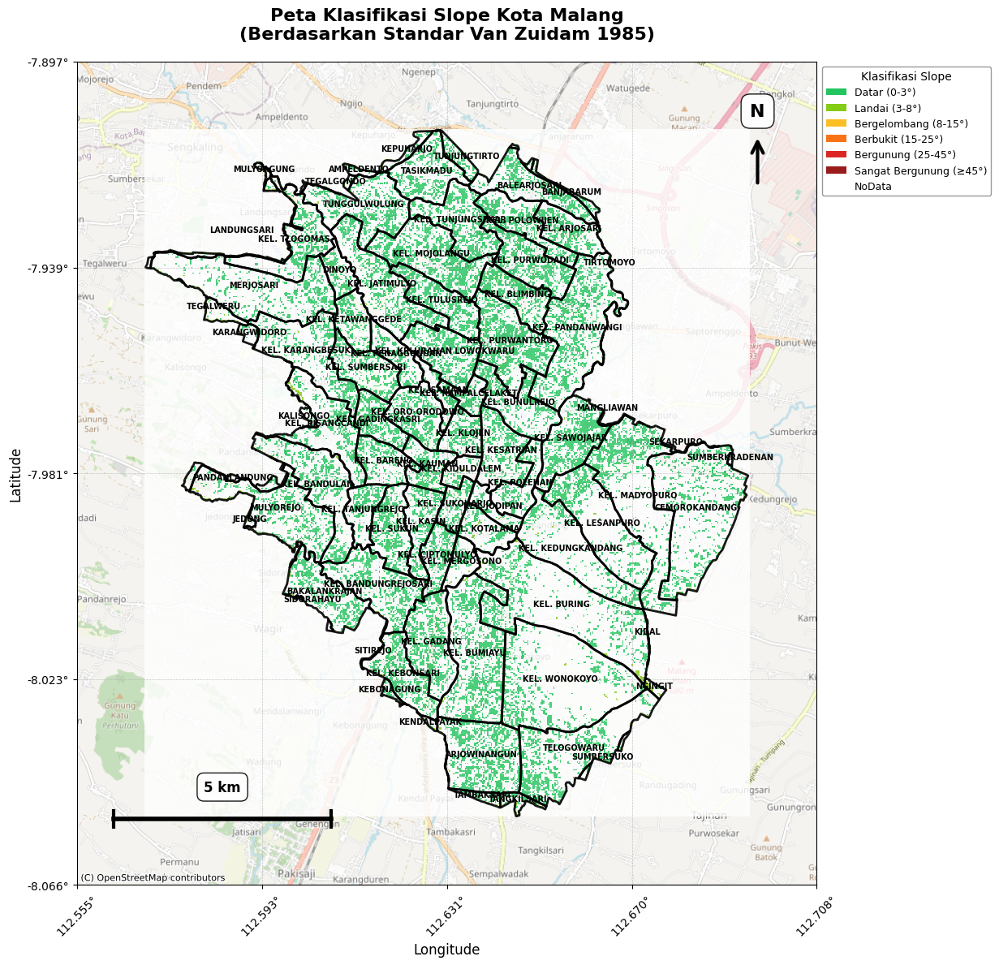

In [ ]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, FancyArrowPatch, Rectangle
from matplotlib.colors import ListedColormap, BoundaryNorm
import json
from rasterio import uint8
from pyproj import Transformer
import math
import contextily as ctx
from rasterio.warp import transform_bounds

# 1. Baca shapefile batas administrasi Kota Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# === 2. Baca dan masking raster slope dengan penanganan NoData ===
raster_path = "/content/drive/MyDrive/EarthEngine/Malangslope.tif"
with rasterio.open(raster_path, nodata=255) as src:
    gdf = gdf.to_crs(src.crs)
    geoms = [feature["geometry"] for feature in json.loads(gdf.to_json())["features"]]

    slope_masked, out_transform = mask(src, geoms, crop=True, nodata=255)
    slope = slope_masked[0].astype(float)

    valid_mask = (slope != 255) & (~np.isnan(slope))

    # Get the profile here while src is open
    profile = src.profile.copy()
    profile.update({
        "height": slope.shape[0],
        "width": slope.shape[1],
        "transform": out_transform,
        "nodata": 255
    })

# --- **Crucial Improvement: Check and Adjust Slope Units** ---
min_slope_val = np.nanmin(slope[valid_mask])
max_slope_val = np.nanmax(slope[valid_mask])

print(f"Nilai kemiringan min setelah masking (raw): {min_slope_val}")
print(f"Nilai kemiringan max setelah masking (raw): {max_slope_val}")

# Heuristic to check if slope values are likely in decimal form
if max_slope_val < 1.0 and max_slope_val != 0:
    print("Slope values appear to be in decimal form. Scaling to percentage...")
    slope_for_classification = slope * 100
else:
    slope_for_classification = slope

print(f"Nilai kemiringan min setelah potensi penyesuaian (untuk klasifikasi): {np.nanmin(slope_for_classification[valid_mask])}")
print(f"Nilai kemiringan max setelah potensi penyesuaian (untuk klasifikasi): {np.nanmax(slope_for_classification[valid_mask])}")

# === 3. Klasifikasi Kemiringan (berdasarkan standar Indonesia) ===
klasifikasi_slope = np.full_like(slope_for_classification, fill_value=255, dtype=np.uint8)

# Klasifikasi berdasarkan standar Van Zuidam (1985) dan Pusat Penelitian Tanah (1983)
klasifikasi_slope[(slope_for_classification < 2) & valid_mask] = 1  # Datar
klasifikasi_slope[(slope_for_classification >= 3) & (slope_for_classification < 8) & valid_mask] = 2  # Landai
klasifikasi_slope[(slope_for_classification >= 8) & (slope_for_classification < 15) & valid_mask] = 3  # Bergelombang
klasifikasi_slope[(slope_for_classification >= 15) & (slope_for_classification < 25) & valid_mask] = 4  # Berbukit
klasifikasi_slope[(slope_for_classification >= 25) & (slope_for_classification < 45) & valid_mask] = 5  # Bergunung
klasifikasi_slope[(slope_for_classification >= 45) & valid_mask] = 6  # Sangat Bergunung

# === 4. Fungsi untuk Scale Bar dan North Arrow ===
def add_scale_bar(ax, transform, crs, length_km=5, location='lower right'):
    """
    Menambahkan scale bar ke peta
    """
    # Get map bounds
    bounds = ax.get_xlim(), ax.get_ylim()

    # Convert to geographic coordinates for distance calculation
    transformer = Transformer.from_crs(crs, "EPSG:4326", always_xy=True)

    # Calculate approximate scale at the center of the map
    center_x = (bounds[0][0] + bounds[0][1]) / 2
    center_y = (bounds[1][0] + bounds[1][1]) / 2

    # Convert to lat/lon
    center_lon, center_lat = transformer.transform(center_x, center_y)

    # Calculate meters per degree at this latitude
    lat_rad = math.radians(center_lat)
    meters_per_deg_lat = 111132.92 - 559.82 * math.cos(2 * lat_rad) + 1.175 * math.cos(4 * lat_rad)
    meters_per_deg_lon = 111412.84 * math.cos(lat_rad) - 93.5 * math.cos(3 * lat_rad)

    # Calculate scale bar length in map units
    target_length_m = length_km * 1000

    # Use longitude scale (assuming UTM or similar projected coordinate system)
    # For UTM, 1 unit = 1 meter, so we can use the target length directly
    if crs.to_string().startswith('EPSG:326') or crs.to_string().startswith('EPSG:327'):  # UTM zones
        scale_length = target_length_m
    else:
        # For geographic coordinates, convert to degrees
        scale_length = target_length_m / meters_per_deg_lon

    # Position the scale bar
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    if location == 'lower right':
        x_start = bounds[0][1] - x_range * 0.25
        y_pos = bounds[1][0] + y_range * 0.05
    elif location == 'lower left':
        x_start = bounds[0][0] + x_range * 0.05
        y_pos = bounds[1][0] + y_range * 0.05

    # Draw scale bar
    ax.plot([x_start, x_start + scale_length], [y_pos, y_pos], 'k-', linewidth=3)
    ax.plot([x_start, x_start], [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=2)
    ax.plot([x_start + scale_length, x_start + scale_length], [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=2)

    # Add text
    ax.text(x_start + scale_length/2, y_pos + y_range*0.02, f'{length_km} km',
            ha='center', va='bottom', fontsize=10, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

def add_north_arrow(ax, location='upper right', size=0.08):
    """
    Menambahkan north arrow ke peta
    """
    bounds = ax.get_xlim(), ax.get_ylim()
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    if location == 'upper right':
        x_pos = bounds[0][1] - x_range * 0.1
        y_pos = bounds[1][1] - y_range * 0.15
    elif location == 'upper left':
        x_pos = bounds[0][0] + x_range * 0.1
        y_pos = bounds[1][1] - y_range * 0.15

    # Arrow dimensions
    arrow_length = y_range * size
    arrow_width = x_range * size * 0.3

    # Draw north arrow
    arrow = FancyArrowPatch((x_pos, y_pos), (x_pos, y_pos + arrow_length),
                            connectionstyle="arc3",
                            arrowstyle='->',
                            mutation_scale=20,
                            color='black',
                            linewidth=2)
    ax.add_patch(arrow)

    # Add "N" text
    ax.text(x_pos, y_pos + arrow_length + y_range*0.02, 'N',
            ha='center', va='bottom', fontsize=14, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# === 5. Visualisasi dengan Style Profesional ===
# Warna yang sesuai dengan klasifikasi slope (dari hijau ke merah)
colors = ['#22c55e', '#84cc16', '#fbbf24', '#f97316', '#dc2626', '#991b1b', 'white']
labels = {
    1:'Datar (0-3°)',
    2:'Landai (3-8°)',
    3:'Bergelombang (8-15°)',
    4:'Berbukit (15-25°)',
    5:'Bergunung (25-45°)',
    6:'Sangat Bergunung (≥45°)',
    7:'NoData'
}
cmap = ListedColormap(colors)
norm = BoundaryNorm([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 256], cmap.N)

fig, ax = plt.subplots(figsize=(15, 12))

# Konversi CRS untuk base map (Web Mercator - EPSG:3857)
gdf_web_mercator = gdf.to_crs(epsg=3857)

# Set extent for focusing on the Malang area (in Web Mercator)
minx, miny, maxx, maxy = gdf_web_mercator.total_bounds
buffer = max((maxx - minx), (maxy - miny)) * 0.1
extent = [minx - buffer, maxx + buffer, miny - buffer, maxy + buffer]
ax.set_xlim(extent[0], extent[1])
ax.set_ylim(extent[2], extent[3])

# Tambahkan base map OpenStreetMap
try:
    ctx.add_basemap(ax,
                    crs=gdf_web_mercator.crs, # Ensure CRS is explicitly passed
                    source=ctx.providers.OpenStreetMap.Mapnik,
                    alpha=0.7,
                    zoom='auto') # Let contextily determine the best zoom level
    print("Base map OpenStreetMap berhasil ditambahkan")

except Exception as e:
    print(f"Warning: Tidak dapat menambahkan base map OSM: {e}")
    print("Melanjutkan tanpa base map...")

# Transform raster slope ke Web Mercator untuk overlay
if profile['crs'] != 'EPSG:3857':
    # Transform bounds ke Web Mercator
    left, bottom, right, top = transform_bounds(profile['crs'], 'EPSG:3857',
                                                *rasterio.transform.array_bounds(klasifikasi_slope.shape[0],
                                                                                 klasifikasi_slope.shape[1],
                                                                                 out_transform))
    extent_slope = [left, right, bottom, top]
else:
    # If the original CRS was already 3857, use the original transform to get extent
    left, bottom, right, top = rasterio.transform.array_bounds(klasifikasi_slope.shape[0],
                                                               klasifikasi_slope.shape[1],
                                                               out_transform)
    extent_slope = [left, right, bottom, top]

# Plot slope data dengan transparansi
if extent_slope:
    im = ax.imshow(klasifikasi_slope, extent=extent_slope, cmap=cmap, norm=norm, alpha=0.8, interpolation='nearest')
else:
    # Fallback if extent_slope isn't determined (though it should be)
    show(klasifikasi_slope, transform=out_transform, ax=ax, cmap=cmap, norm=norm, alpha=0.8)

# Plot boundary administrasi
gdf_web_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2, alpha=0.9)

# Menambahkan label nama desa/kecamatan
for x, y, label in zip(gdf_web_mercator.geometry.centroid.x,
                       gdf_web_mercator.geometry.centroid.y,
                       gdf_web_mercator['NAMOBJ']):
    ax.text(x, y, label, fontsize=7, ha='center', color='black', weight='bold')

# Judul peta
ax.set_title("Peta Klasifikasi Slope Kota Malang\n(Berdasarkan Standar Van Zuidam 1985)",
            fontsize=16, fontweight='bold', pad=20)

# -------------------- Grid Latitude dan Longitude --------------------
# Konversi koordinat untuk grid dalam Web Mercator
bounds_wm = ax.get_xlim(), ax.get_ylim()

# Transform ke lat/lon untuk label
transformer_wm = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)
min_lon, min_lat = transformer_wm.transform(bounds_wm[0][0], bounds_wm[1][0])
max_lon, max_lat = transformer_wm.transform(bounds_wm[0][1], bounds_wm[1][1])

# Buat grid dalam koordinat Web Mercator
num_lines = 5
lon_vals = np.linspace(min_lon, max_lon, num_lines)
lat_vals = np.linspace(min_lat, max_lat, num_lines)

# Transform kembali ke Web Mercator untuk plotting
transformer_back = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
x_ticks = []
y_ticks = []
x_labels = []
y_labels = []

for lon in lon_vals:
    x, _ = transformer_back.transform(lon, (min_lat + max_lat) / 2)
    x_ticks.append(x)
    x_labels.append(f"{lon:.3f}°")

for lat in lat_vals:
    _, y = transformer_back.transform((min_lon + max_lon) / 2, lat)
    y_ticks.append(y)
    y_labels.append(f"{lat:.3f}°")

ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks)
ax.set_xticklabels(x_labels, rotation=45)
ax.set_yticklabels(y_labels)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

# ==================== Scale Bar dan North Arrow (disesuaikan untuk Web Mercator) ====================
# Menambahkan scale bar dengan koordinat Web Mercator
def add_scale_bar_wm(ax, length_km=5, location='lower right'):
    """Scale bar untuk Web Mercator coordinates"""
    bounds = ax.get_xlim(), ax.get_ylim()
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    # Untuk Web Mercator, 1 unit ≈ 1 meter di khatulistiwa
    scale_length = length_km * 1000

    if location == 'lower right':
        x_start = bounds[0][1] - x_range * 0.25
        y_pos = bounds[1][0] + y_range * 0.08
    elif location == 'lower left':
        x_start = bounds[0][0] + x_range * 0.05
        y_pos = bounds[1][0] + y_range * 0.08

    # Draw scale bar
    ax.plot([x_start, x_start + scale_length], [y_pos, y_pos], 'k-', linewidth=4)
    ax.plot([x_start, x_start], [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=3)
    ax.plot([x_start + scale_length, x_start + scale_length],
            [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=3)

    # Add text with background
    ax.text(x_start + scale_length/2, y_pos + y_range*0.03, f'{length_km} km',
            ha='center', va='bottom', fontsize=12, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='black'))

def add_north_arrow_wm(ax, location='upper right', size=0.06):
    """North arrow untuk Web Mercator coordinates"""
    bounds = ax.get_xlim(), ax.get_ylim()
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    if location == 'upper right':
        x_pos = bounds[0][1] - x_range * 0.08
        y_pos = bounds[1][1] - y_range * 0.15
    elif location == 'upper left':
        x_pos = bounds[0][0] + x_range * 0.08
        y_pos = bounds[1][1] - y_range * 0.15

    # Arrow dimensions
    arrow_length = y_range * size

    # Draw north arrow
    arrow = FancyArrowPatch((x_pos, y_pos), (x_pos, y_pos + arrow_length),
                            connectionstyle="arc3",
                            arrowstyle='->',
                            mutation_scale=25,
                            color='black',
                            linewidth=3)
    ax.add_patch(arrow)

    # Add "N" text with background
    ax.text(x_pos, y_pos + arrow_length + y_range*0.02, 'N',
            ha='center', va='bottom', fontsize=16, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='black'))

# Tambahkan scale bar dan north arrow
add_scale_bar_wm(ax, length_km=5, location='lower left')
add_north_arrow_wm(ax, location='upper right', size=0.06)

# Legend
legend_elements = [Patch(facecolor=colors[i], label=labels[i+1]) for i in range(len(labels)-1)]
# Handle NoData label separately if it exists
if 7 in labels:
    legend_elements.append(Patch(facecolor=colors[-1], label=labels[7]))

ax.legend(handles=legend_elements, title='Klasifikasi Slope', loc='upper left', bbox_to_anchor=(1.0, 1.0), fontsize=9, frameon=True, edgecolor='gray')

# === 6. Analisis Statistik Klasifikasi ===
print("\n=== ANALISIS STATISTIK KLASIFIKASI SLOPE ===")
unique_values, counts = np.unique(klasifikasi_slope[valid_mask], return_counts=True)
total_pixels = np.sum(counts)

print(f"Total pixel valid: {total_pixels}")
print("\nDistribusi Klasifikasi Slope:")
for val, count in zip(unique_values, counts):
    if val in labels:
        percentage = (count / total_pixels) * 100
        print(f"{labels[val]}: {count} pixel ({percentage:.2f}%)")

plt.tight_layout()
plt.show()

##  Skoring  Data Slope Malang

Nilai kemiringan min setelah masking: 0.0000
Nilai kemiringan max setelah masking: 5.0000
Nilai kemiringan min untuk skoring: 0.0000
Nilai kemiringan max untuk skoring: 5.0000

DEBUG - Hasil skoring:
Skor 1: 155994 pixels
Skor 2: 87201 pixels
Skor 3: 0 pixels
Skor 4: 0 pixels
Skor 5: 0 pixels
Total pixels valid: 243195
Total pixels NaN: 0
DEBUG - Pixels sebelum clipping: 243195
DEBUG - Pixels setelah clipping: 125432

DEBUG - Distribusi nilai skor slope setelah clipping:
Nilai unik dalam skor_slope_clipped: [1. 2.]
Min: 1.0, Max: 2.0
Error dalam reprojeksi raster: negative dimensions are not allowed
Menggunakan raster original...
Base map OpenStreetMap berhasil ditambahkan
DEBUG - Menggunakan fallback method
DEBUG - Extent manual: [12531105.0, 12545025.0, -899259.5930876485, -883446.416885992]


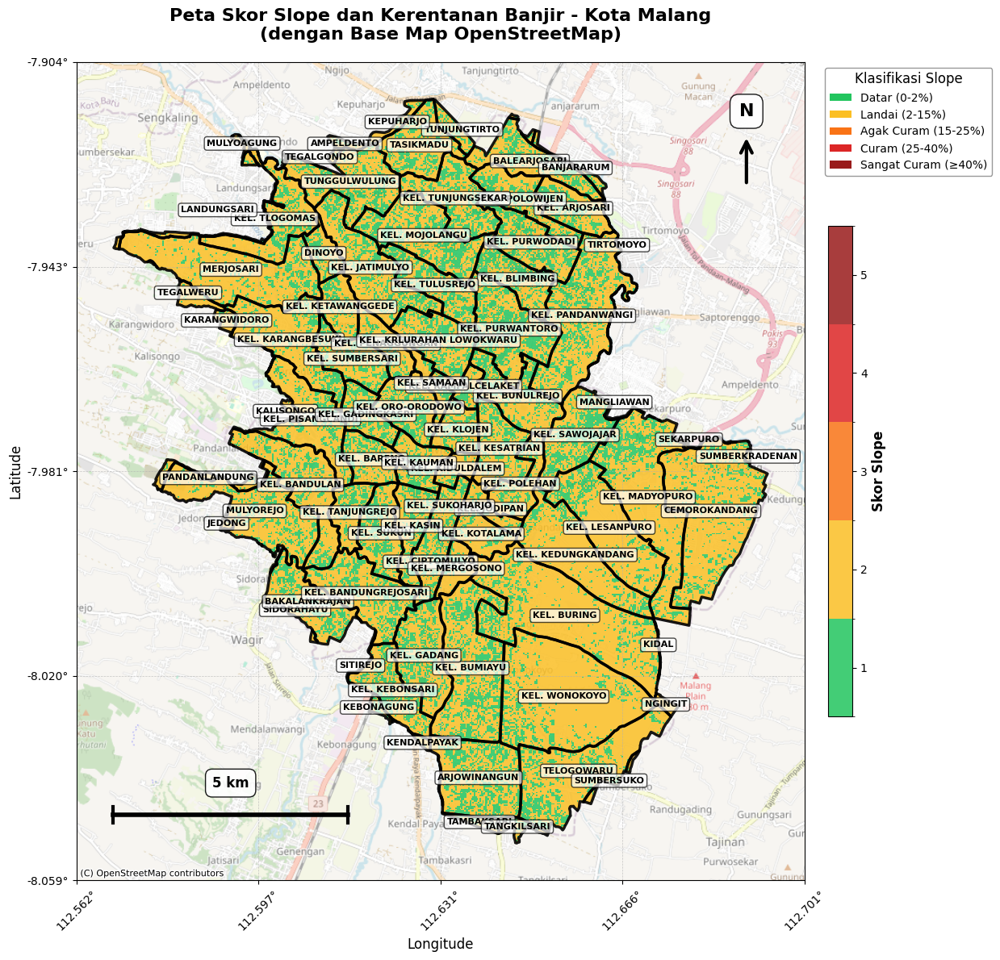


=== STATISTIK DATA SLOPE (SETELAH CLIPPING) ===
Skor 1 (Datar (0-2%)): 38,231 pixels (30.48%)
Skor 2 (Landai (2-15%)): 87,201 pixels (69.52%)

Total pixels valid: 125,432
Total pixels NoData: 117,763


In [ ]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch, FancyArrowPatch, Rectangle
from matplotlib.colors import ListedColormap, BoundaryNorm
import json
from rasterio import uint8
from pyproj import Transformer
import math
import contextily as ctx
from rasterio.warp import transform_bounds, reproject, Resampling
from rasterio.transform import from_bounds
from rasterio.features import geometry_mask
import warnings
warnings.filterwarnings('ignore')

# 1. Baca shapefile batas administrasi Kota Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# === 2. Baca dan masking raster slope dengan penanganan NoData ===
raster_path = "/content/drive/MyDrive/EarthEngine/Malangslope.tif"
with rasterio.open(raster_path) as src:
    # Pastikan CRS sama
    gdf = gdf.to_crs(src.crs)
    geoms = [feature["geometry"] for feature in json.loads(gdf.to_json())["features"]]

    # Masking dengan penanganan NoData yang lebih baik
    slope_masked, out_transform = mask(src, geoms, crop=True, nodata=src.nodata)
    slope = slope_masked[0].astype(float)

    # Handle NoData values
    if src.nodata is not None:
        slope[slope == src.nodata] = np.nan

    # Buat mask untuk data valid
    valid_mask = ~np.isnan(slope)

    # Get the profile
    profile = src.profile.copy()
    profile.update({
        "height": slope.shape[0],
        "width": slope.shape[1],
        "transform": out_transform,
        "nodata": np.nan
    })

# --- Periksa dan sesuaikan unit slope ---
if np.any(valid_mask):
    min_slope_val = np.nanmin(slope[valid_mask])
    max_slope_val = np.nanmax(slope[valid_mask])

    print(f"Nilai kemiringan min setelah masking: {min_slope_val:.4f}")
    print(f"Nilai kemiringan max setelah masking: {max_slope_val:.4f}")

    # Heuristik untuk mengecek apakah nilai slope dalam bentuk desimal
    if max_slope_val < 1.0 and max_slope_val > 0:
        print("Nilai slope dalam bentuk desimal. Mengkonversi ke persentase...")
        slope_for_scoring = slope * 100
    else:
        slope_for_scoring = slope.copy()

    print(f"Nilai kemiringan min untuk skoring: {np.nanmin(slope_for_scoring[valid_mask]):.4f}")
    print(f"Nilai kemiringan max untuk skoring: {np.nanmax(slope_for_scoring[valid_mask]):.4f}")
else:
    print("Warning: Tidak ada data slope yang valid!")
    slope_for_scoring = slope.copy()

# === 3. Skoring Kemiringan - PERBAIKAN ===
skor_slope = np.full_like(slope_for_scoring, fill_value=np.nan, dtype=np.float32)

# Aplikasikan skoring hanya pada data yang valid
if np.any(valid_mask):
    skor_slope[(slope_for_scoring < 2) & valid_mask] = 1  # Datar
    skor_slope[(slope_for_scoring >= 2) & (slope_for_scoring < 15) & valid_mask] = 2  # Landai
    skor_slope[(slope_for_scoring >= 15) & (slope_for_scoring < 25) & valid_mask] = 3  # Agak Curam
    skor_slope[(slope_for_scoring >= 25) & (slope_for_scoring < 40) & valid_mask] = 4  # Curam
    skor_slope[(slope_for_scoring >= 40) & valid_mask] = 5  # Sangat Curam

    # Debug informasi
    print(f"\nDEBUG - Hasil skoring:")
    for i in range(1, 6):
        count = np.sum(skor_slope == i)
        print(f"Skor {i}: {count} pixels")
    print(f"Total pixels valid: {np.sum(~np.isnan(skor_slope))}")
    print(f"Total pixels NaN: {np.sum(np.isnan(skor_slope))}")
else:
    print("WARNING: Tidak ada data valid untuk skoring!")

# === 3.5. TAMBAHAN: Buat mask untuk area di luar batas administrasi ===
def create_admin_mask(raster_shape, raster_transform, admin_geom):
    """
    Membuat mask untuk area di luar batas administrasi
    Returns: mask array dimana True = di luar batas, False = di dalam batas
    """
    # Buat mask dari geometri administrasi
    mask_array = geometry_mask(
        admin_geom,
        transform=raster_transform,
        invert=False,  # False = area di luar geometri akan bernilai True
        out_shape=raster_shape
    )
    return mask_array

# Buat mask untuk area di luar batas administrasi
admin_mask = create_admin_mask(skor_slope.shape, out_transform, geoms)

# Terapkan mask: set area di luar batas menjadi NaN
skor_slope_clipped = skor_slope.copy()
skor_slope_clipped[admin_mask] = np.nan

print(f"DEBUG - Pixels sebelum clipping: {np.sum(~np.isnan(skor_slope))}")
print(f"DEBUG - Pixels setelah clipping: {np.sum(~np.isnan(skor_slope_clipped))}")

# === 4. Fungsi untuk Reproject Raster ke Web Mercator ===
def reproject_raster_to_web_mercator(data, src_transform, src_crs, target_bounds=None):
    """
    Reproject raster data ke Web Mercator (EPSG:3857)
    """
    dst_crs = 'EPSG:3857'

    if target_bounds is None:
        # Transform bounds ke Web Mercator
        left, bottom, right, top = transform_bounds(src_crs, dst_crs,
                                                   *rasterio.transform.array_bounds(data.shape[0],
                                                                                   data.shape[1],
                                                                                   src_transform))
    else:
        left, bottom, right, top = target_bounds

    # Calculate dimensions untuk output
    width = int((right - left) / 100)  # 100m resolution
    height = int((top - bottom) / 100)

    # Create destination transform
    dst_transform = from_bounds(left, bottom, right, top, width, height)

    # Create destination array
    dst_data = np.empty((height, width), dtype=data.dtype)

    # Reproject
    reproject(
        data, dst_data,
        src_transform=src_transform, src_crs=src_crs,
        dst_transform=dst_transform, dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    return dst_data, dst_transform, left, bottom, right, top

# === 5. Fungsi untuk Scale Bar dan North Arrow ===
def add_scale_bar_wm(ax, length_km=5, location='lower right'):
    """Scale bar untuk Web Mercator coordinates"""
    bounds = ax.get_xlim(), ax.get_ylim()
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    # Untuk Web Mercator, 1 unit ≈ 1 meter di khatulistiwa
    scale_length = length_km * 1000

    if location == 'lower right':
        x_start = bounds[0][1] - x_range * 0.25
        y_pos = bounds[1][0] + y_range * 0.08
    elif location == 'lower left':
        x_start = bounds[0][0] + x_range * 0.05
        y_pos = bounds[1][0] + y_range * 0.08

    # Draw scale bar
    ax.plot([x_start, x_start + scale_length], [y_pos, y_pos], 'k-', linewidth=4)
    ax.plot([x_start, x_start], [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=3)
    ax.plot([x_start + scale_length, x_start + scale_length],
            [y_pos - y_range*0.01, y_pos + y_range*0.01], 'k-', linewidth=3)

    # Add text with background
    ax.text(x_start + scale_length/2, y_pos + y_range*0.03, f'{length_km} km',
            ha='center', va='bottom', fontsize=12, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='black'))

def add_north_arrow_wm(ax, location='upper right', size=0.06):
    """North arrow untuk Web Mercator coordinates"""
    bounds = ax.get_xlim(), ax.get_ylim()
    x_range = bounds[0][1] - bounds[0][0]
    y_range = bounds[1][1] - bounds[1][0]

    if location == 'upper right':
        x_pos = bounds[0][1] - x_range * 0.08
        y_pos = bounds[1][1] - y_range * 0.15
    elif location == 'upper left':
        x_pos = bounds[0][0] + x_range * 0.08
        y_pos = bounds[1][1] - y_range * 0.15

    # Arrow dimensions
    arrow_length = y_range * size

    # Draw north arrow
    arrow = FancyArrowPatch((x_pos, y_pos), (x_pos, y_pos + arrow_length),
                            connectionstyle="arc3",
                            arrowstyle='->',
                            mutation_scale=25,
                            color='black',
                            linewidth=3)
    ax.add_patch(arrow)

    # Add "N" text with background
    ax.text(x_pos, y_pos + arrow_length + y_range*0.02, 'N',
            ha='center', va='bottom', fontsize=16, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='black'))

# === 6. Visualisasi dengan Style Profesional ===
# Setup colormap dan normalisasi - PERBAIKAN
colors = ['#22c55e', '#fbbf24', '#f97316', '#dc2626', '#991b1b']
labels = {
    1: 'Datar (0-2%)',
    2: 'Landai (2-15%)',
    3: 'Agak Curam (15-25%)',
    4: 'Curam (25-40%)',
    5: 'Sangat Curam (≥40%)'
}

# Debug: Cek distribusi nilai skor setelah clipping
print(f"\nDEBUG - Distribusi nilai skor slope setelah clipping:")
if np.any(~np.isnan(skor_slope_clipped)):
    unique_vals = np.unique(skor_slope_clipped[~np.isnan(skor_slope_clipped)])
    print(f"Nilai unik dalam skor_slope_clipped: {unique_vals}")
    print(f"Min: {np.nanmin(skor_slope_clipped)}, Max: {np.nanmax(skor_slope_clipped)}")
else:
    print("Semua nilai adalah NaN!")

# Buat colormap dengan explicit mapping
from matplotlib.colors import ListedColormap, BoundaryNorm
cmap = ListedColormap(colors)
# Boundaries untuk 5 kelas (1,2,3,4,5)
bounds = [0.5, 1.5, 2.5, 3.5, 4.5, 5.5]
norm = BoundaryNorm(bounds, ncolors=len(colors))

# Create figure
fig, ax = plt.subplots(figsize=(15, 12))

# Konversi shapefile ke Web Mercator
gdf_web_mercator = gdf.to_crs(epsg=3857)

# Set extent berdasarkan boundaries shapefile
minx, miny, maxx, maxy = gdf_web_mercator.total_bounds
buffer = max((maxx - minx), (maxy - miny)) * 0.05
extent = [minx - buffer, maxx + buffer, miny - buffer, maxy + buffer]

# Reproject raster ke Web Mercator - GUNAKAN DATA YANG SUDAH DI-CLIP
try:
    skor_slope_wm, transform_wm, left, bottom, right, top = reproject_raster_to_web_mercator(
        skor_slope_clipped, out_transform, profile['crs'], target_bounds=extent
    )
    extent_slope = [left, right, bottom, top]
    print("Raster berhasil diproyeksikan ke Web Mercator")
except Exception as e:
    print(f"Error dalam reprojeksi raster: {e}")
    print("Menggunakan raster original...")
    skor_slope_wm = skor_slope_clipped
    extent_slope = None

# Set map extent
ax.set_xlim(extent[0], extent[1])
ax.set_ylim(extent[2], extent[3])

# Tambahkan base map
try:
    ctx.add_basemap(ax,
                    crs=gdf_web_mercator.crs,
                    source=ctx.providers.OpenStreetMap.Mapnik,
                    alpha=0.6,
                    zoom='auto')
    print("Base map OpenStreetMap berhasil ditambahkan")
except Exception as e:
    print(f"Warning: Tidak dapat menambahkan base map OSM: {e}")
    ax.set_facecolor('#f0f0f0')  # Background abu-abu terang sebagai fallback

# Plot slope data - MENGGUNAKAN DATA YANG SUDAH DI-CLIP
if extent_slope:
    # Mask NaN values untuk transparansi
    skor_slope_masked = np.ma.masked_where(np.isnan(skor_slope_wm), skor_slope_wm)
    print(f"DEBUG - Extent slope: {extent_slope}")
    print(f"DEBUG - Shape skor_slope_wm: {skor_slope_wm.shape}")
    print(f"DEBUG - Nilai min/max setelah masking: {np.nanmin(skor_slope_wm)}/{np.nanmax(skor_slope_wm)}")

    im = ax.imshow(skor_slope_masked, extent=extent_slope, cmap=cmap, norm=norm,
                   alpha=0.85, interpolation='nearest', aspect='auto')
else:
    # Fallback method - gunakan extent manual
    print("DEBUG - Menggunakan fallback method")
    skor_slope_masked = np.ma.masked_where(np.isnan(skor_slope_clipped), skor_slope_clipped)

    # Hitung extent dari transform
    height, width = skor_slope_clipped.shape
    left, top = rasterio.transform.xy(out_transform, 0, 0)
    right, bottom = rasterio.transform.xy(out_transform, height-1, width-1)

    # Transform ke Web Mercator jika perlu
    if profile['crs'] != 'EPSG:3857':
        transformer = Transformer.from_crs(profile['crs'], 'EPSG:3857', always_xy=True)
        left, top = transformer.transform(left, top)
        right, bottom = transformer.transform(right, bottom)

    extent_manual = [left, right, bottom, top]
    print(f"DEBUG - Extent manual: {extent_manual}")

    im = ax.imshow(skor_slope_masked, extent=extent_manual, cmap=cmap, norm=norm,
                   alpha=0.85, interpolation='nearest', aspect='auto')

# Tambahkan colorbar untuk memastikan warna terlihat
cbar = plt.colorbar(im, ax=ax, shrink=0.6, pad=0.02)
cbar.set_label('Skor Slope', fontsize=12, fontweight='bold')
cbar.set_ticks([1, 2, 3, 4, 5])
cbar.set_ticklabels(['1', '2', '3', '4', '5'])

# Plot boundary administrasi
gdf_web_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5, alpha=0.9)

# Menambahkan label nama desa/kecamatan
if 'NAMOBJ' in gdf_web_mercator.columns:
    for x, y, label in zip(gdf_web_mercator.geometry.centroid.x,
                          gdf_web_mercator.geometry.centroid.y,
                          gdf_web_mercator['NAMOBJ']):
        ax.text(x, y, label, fontsize=8, ha='center', va='center',
               color='black', weight='bold',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.7))

# Judul peta
ax.set_title("Peta Skor Slope dan Kerentanan Banjir - Kota Malang\n(dengan Base Map OpenStreetMap)",
            fontsize=16, fontweight='bold', pad=20)

# Grid koordinat
try:
    # Konversi bounds untuk grid
    bounds_wm = ax.get_xlim(), ax.get_ylim()
    transformer_wm = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)
    min_lon, min_lat = transformer_wm.transform(bounds_wm[0][0], bounds_wm[1][0])
    max_lon, max_lat = transformer_wm.transform(bounds_wm[0][1], bounds_wm[1][1])

    # Buat grid
    num_lines = 5
    lon_vals = np.linspace(min_lon, max_lon, num_lines)
    lat_vals = np.linspace(min_lat, max_lat, num_lines)

    # Transform kembali ke Web Mercator
    transformer_back = Transformer.from_crs("EPSG:4326", "EPSG:3857", always_xy=True)
    x_ticks = []
    y_ticks = []
    x_labels = []
    y_labels = []

    for lon in lon_vals:
        x, _ = transformer_back.transform(lon, (min_lat + max_lat) / 2)
        x_ticks.append(x)
        x_labels.append(f"{lon:.3f}°")

    for lat in lat_vals:
        _, y = transformer_back.transform((min_lon + max_lon) / 2, lat)
        y_ticks.append(y)
        y_labels.append(f"{lat:.3f}°")

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels(x_labels, rotation=45, fontsize=10)
    ax.set_yticklabels(y_labels, fontsize=10)
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
except Exception as e:
    print(f"Warning: Tidak dapat menambahkan grid koordinat: {e}")

# Tambahkan scale bar dan north arrow
add_scale_bar_wm(ax, length_km=5, location='lower left')
add_north_arrow_wm(ax, location='upper right', size=0.06)

# Legend
legend_elements = [Patch(facecolor=colors[i], label=labels[i+1]) for i in range(len(labels))]
ax.legend(handles=legend_elements, title='Klasifikasi Slope',
         loc='upper left', bbox_to_anchor=(1.02, 1.0),
         fontsize=10, frameon=True, facecolor='white',
         edgecolor='gray', title_fontsize=12)

# Tight layout dan tampilkan
plt.tight_layout()
plt.show()

# === 7. Statistik Data ===
if np.any(~np.isnan(skor_slope_clipped)):
    print("\n=== STATISTIK DATA SLOPE (SETELAH CLIPPING) ===")
    unique_scores, counts = np.unique(skor_slope_clipped[~np.isnan(skor_slope_clipped)], return_counts=True)
    total_pixels = np.sum(counts)

    for score, count in zip(unique_scores, counts):
        percentage = (count / total_pixels) * 100
        print(f"Skor {int(score)} ({labels[int(score)]}): {count:,} pixels ({percentage:.2f}%)")

    print(f"\nTotal pixels valid: {total_pixels:,}")
    print(f"Total pixels NoData: {np.sum(np.isnan(skor_slope_clipped)):,}")
else:
    print("Tidak ada data slope yang valid untuk dianalisis!")

In [ ]:
# === 9. Simpan hasil skoring sebagai GeoTIFF ===
output_skor_tif_path = "/content/drive/MyDrive/Output/Skoring_Sloope.tif" # Ganti dengan path yang Anda inginkan

# Perbarui profil untuk output GeoTIFF
# Pastikan tipe data sesuai dengan skor_landcover (uint8)
# --- Use the 'profile' variable captured earlier, which holds the metadata ---
# output_profile_skor = raster.profile.copy() # Original line causing error
output_profile_skor = profile.copy() # Use the profile variable

output_profile_skor.update({
    "driver": "GTiff",
    "height": skor_slope.shape[0], # Assuming skor_landcover has the correct dimensions from clipping
    "width": skor_slope.shape[1],  # Assuming skor_landcover has the correct dimensions from clipping
    "transform": transform_clip, # Use transform_clip from the masking operation
    "crs": profile['crs'], # Use CRS from the original profile
    "dtype": skor_slope.dtype, # Pastikan dtype sesuai dengan array skor_landcover (np.uint8)
    "nodata": 255 # Pastikan nodata value juga diset (sesuai dengan inisialisasi skor_landcover)
})

try:
    with rasterio.open(output_skor_tif_path, 'w', **output_profile_skor) as dst:
        dst.write(skor_slope, 1) # Tulis array skor_landcover ke band 1
    print(f"\nFile GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: {output_skor_tif_path}")
except Exception as e:
    print(f"\nError saat menyimpan GeoTIFF Skor Kerentanan Banjir: {e}")


File GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: /content/drive/MyDrive/Output/Skoring_Sloope.tif


## DATA Curah Hujan


STATISTIK CURAH HUJAN:
Curah hujan minimum: 2417.91 mm
Curah hujan maksimum: 3091.02 mm
Curah hujan rata-rata: 2872.89 mm
Standar deviasi: 164.81 mm

Membuat klasifikasi berdasarkan distribusi data...
Quantile 20%: 2629.00 mm
Quantile 40%: 2915.28 mm
Quantile 60%: 2915.28 mm
Quantile 80%: 3091.02 mm

DEBUG: Nilai unik dalam klasifikasi:
Unique values: [  0   1   3   4 255]
Counts: [   11 13882 21444  9808 42461]

Distribusi Klasifikasi Curah Hujan - Kota Malang:
Kelas 0 (Sangat Rendah - < 2629 mm): 11 piksel (0.02%)
Kelas 1 (Rendah - 2629-2915 mm): 13,882 piksel (30.75%)
Kelas 3 (Tinggi - 2915-3091 mm): 21,444 piksel (47.50%)
Kelas 4 (Sangat Tinggi - > 3091 mm): 9,808 piksel (21.73%)
NoData (luar batas): 42,461 piksel
Total piksel valid: 45,145


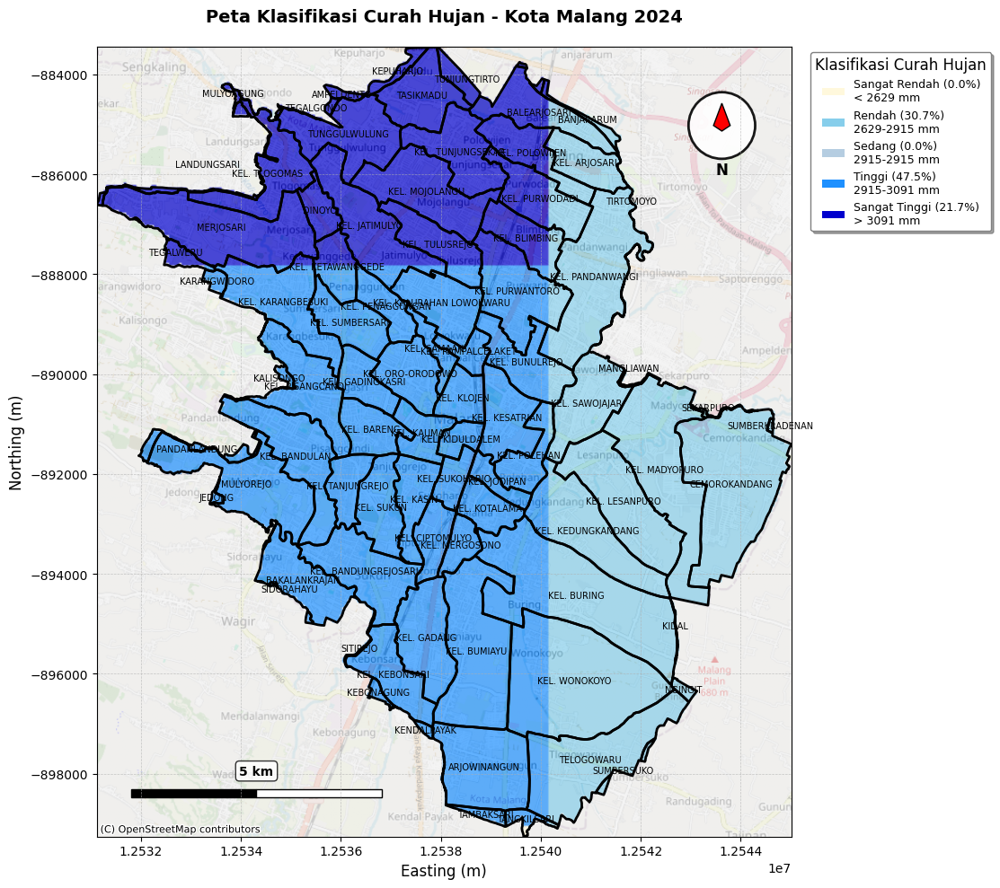


ANALISIS KLASIFIKASI CURAH HUJAN KOTA MALANG 2024
Resolusi piksel: 0.00 x 0.00 meter
Luas per piksel: 0.0000 hektar

Sangat Rendah        (< 2629 mm   ):       11 piksel ( 0.02%) =     0.00 ha
Rendah               (2629-2915 mm):   13,882 piksel (30.75%) =     0.00 ha
Tinggi               (2915-3091 mm):   21,444 piksel (47.50%) =     0.00 ha
Sangat Tinggi        (> 3091 mm   ):    9,808 piksel (21.73%) =     0.00 ha
TOTAL                              :   45,145 piksel (100.00%) =     0.00 ha

ANALISIS STATISTIK CURAH HUJAN DETAIL

Sangat Rendah (< 2629 mm):
  - Curah hujan minimum : 2417.91 mm
  - Curah hujan maksimum: 2584.52 mm
  - Curah hujan rata-rata: 2569.37 mm
  - Standar deviasi     : 47.90 mm

Rendah (2629-2915 mm):
  - Curah hujan minimum : 2629.00 mm
  - Curah hujan maksimum: 2806.02 mm
  - Curah hujan rata-rata: 2653.51 mm
  - Standar deviasi     : 61.14 mm

Tinggi (2915-3091 mm):
  - Curah hujan minimum : 2915.28 mm
  - Curah hujan maksimum: 2915.28 mm
  - Curah hujan ra

In [ ]:
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from rasterio.mask import mask
from rasterio.plot import show
from shapely.geometry import mapping
import rasterio
from matplotlib.colors import ListedColormap, BoundaryNorm

# Import tambahan untuk basemap, scale bar, dan north arrow
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText
from matplotlib.patches import Patch

# 1. Baca shapefile batas administrasi Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# 2. Baca raster Curah Hujan
rainfall_path = "/content/drive/MyDrive/GEE_Exports/ChMalang.tif" # Ganti dengan path curah hujan Anda
rainfall_raster = rasterio.open(rainfall_path)

# 3. Samakan proyeksi shapefile dengan raster
gdf = gdf.to_crs(rainfall_raster.crs)
gdf_mercator = gdf.to_crs(epsg=3857)

# 4. Klip raster curah hujan dengan batas administrasi
geoms = [mapping(geom) for geom in gdf.geometry]
rainfall_clip, transform_clip = mask(rainfall_raster, geoms, crop=True, filled=True, nodata=-9999)
rainfall_clip = rainfall_clip[0]  # Ambil array 2D

# Hapus nilai NoData untuk analisis
valid_mask = rainfall_clip != -9999
rainfall_valid = rainfall_clip[valid_mask]

# 5. Klasifikasi curah hujan berdasarkan rentang intensitas
print("STATISTIK CURAH HUJAN:")
print(f"Curah hujan minimum: {np.min(rainfall_valid):.2f} mm")
print(f"Curah hujan maksimum: {np.max(rainfall_valid):.2f} mm")
print(f"Curah hujan rata-rata: {np.mean(rainfall_valid):.2f} mm")
print(f"Standar deviasi: {np.std(rainfall_valid):.2f} mm")
print()

# ========================================
# KLASIFIKASI CURAH HUJAN (MODIFIKASI DI SINI)
# ========================================
# Buat array klasifikasi
klasifikasi_curah_hujan = np.full_like(rainfall_clip, fill_value=255, dtype=np.uint8)  # 255 = NoData

# Klasifikasi otomatis berdasarkan data menggunakan quantile
print("Membuat klasifikasi berdasarkan distribusi data...")
q20 = np.percentile(rainfall_valid, 20)
q40 = np.percentile(rainfall_valid, 40)
q60 = np.percentile(rainfall_valid, 60)
q80 = np.percentile(rainfall_valid, 80)

print(f"Quantile 20%: {q20:.2f} mm")
print(f"Quantile 40%: {q40:.2f} mm")
print(f"Quantile 60%: {q60:.2f} mm")
print(f"Quantile 80%: {q80:.2f} mm")
print()

# Definisi kelas curah hujan berdasarkan distribusi data aktual
KELAS_CURAH_HUJAN = {
    0: {"range": (0, q20), "nama": "Sangat Rendah", "deskripsi": f"< {q20:.0f} mm"},
    1: {"range": (q20, q40), "nama": "Rendah", "deskripsi": f"{q20:.0f}-{q40:.0f} mm"},
    2: {"range": (q40, q60), "nama": "Sedang", "deskripsi": f"{q40:.0f}-{q60:.0f} mm"},
    3: {"range": (q60, q80), "nama": "Tinggi", "deskripsi": f"{q60:.0f}-{q80:.0f} mm"},
    4: {"range": (q80, float('inf')), "nama": "Sangat Tinggi", "deskripsi": f"> {q80:.0f} mm"}
}

# Aplikasikan klasifikasi
for kelas_id, info in KELAS_CURAH_HUJAN.items():
    min_rainfall, max_rainfall = info["range"]
    if max_rainfall == float('inf'):
        mask_kelas = (rainfall_clip >= min_rainfall) & valid_mask
    else:
        mask_kelas = (rainfall_clip >= min_rainfall) & (rainfall_clip < max_rainfall) & valid_mask

    klasifikasi_curah_hujan[mask_kelas] = kelas_id

# ========================================
# ANALISIS DISTRIBUSI CURAH HUJAN
# ========================================
unique, counts = np.unique(klasifikasi_curah_hujan, return_counts=True)
print("DEBUG: Nilai unik dalam klasifikasi:")
print(f"Unique values: {unique}")
print(f"Counts: {counts}")
print()

print("Distribusi Klasifikasi Curah Hujan - Kota Malang:")
total_valid_pixels = 0
for u, c in zip(unique, counts):
    if u != 255:
        total_valid_pixels += c
        percentage = (c / (klasifikasi_curah_hujan != 255).sum()) * 100
        kelas_info = KELAS_CURAH_HUJAN.get(u, {"nama": "Tidak Dikenal", "deskripsi": "N/A"})
        print(f"Kelas {u} ({kelas_info['nama']} - {kelas_info['deskripsi']}): {c:,} piksel ({percentage:.2f}%)")

print(f"NoData (luar batas): {(klasifikasi_curah_hujan == 255).sum():,} piksel")
print(f"Total piksel valid: {total_valid_pixels:,}")

# 7. Visualisasi peta klasifikasi curah hujan
# Warna untuk setiap kelas curah hujan (gradasi yang lebih jelas)
color_mapping = {
    0: '#FFF8DC',  # Sangat Rendah (cream)
    1: '#87CEEB',  # Rendah (biru muda)
    2: '#4682B4',  # Sedang (biru sedang)
    3: '#1E90FF',  # Tinggi (biru dodger)
    4: '#0000CD',  # Sangat Tinggi (biru medium)
    255: '#f0f0f0' # NoData (abu-abu muda)
}

# Buat colormap untuk kelas yang ada dalam data
data_values = unique[unique != 255]  # Exclude NoData
all_values = np.concatenate([data_values, [255]])  # Include NoData
colors_list = [color_mapping[val] for val in all_values]
cmap = ListedColormap(colors_list)

# Buat bounds yang sesuai dengan nilai data
bounds = []
for val in all_values:
    bounds.append(val)
bounds.append(all_values[-1] + 1)  # Tambah batas akhir

norm = BoundaryNorm(bounds, cmap.N)

# 8. Plotting dengan basemap
fig, ax = plt.subplots(figsize=(12, 10), facecolor='white')

# Reprojeksi raster ke Web Mercator untuk basemap
try:
    bounds = gdf_mercator.total_bounds

    # Reproject raster data ke Web Mercator
    from rasterio.warp import reproject, Resampling
    from rasterio.crs import CRS

    dst_crs = CRS.from_epsg(3857)

    from rasterio.warp import calculate_default_transform
    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        rainfall_raster.crs, dst_crs, rainfall_raster.width, rainfall_raster.height, *rainfall_raster.bounds
    )

    # Reproject klasifikasi_curah_hujan ke Web Mercator
    klasifikasi_mercator = np.empty((height_mercator, width_mercator), dtype=np.uint8)
    reproject(
        source=klasifikasi_curah_hujan,
        destination=klasifikasi_mercator,
        src_transform=transform_clip,
        src_crs=rainfall_raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Tampilkan raster yang sudah diproyeksi
    im = show(klasifikasi_mercator, transform=transform_mercator, ax=ax, cmap=cmap, norm=norm)

    # Tambahkan basemap
    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.3)
        basemap_added = True
    except:
        print("Warning: Tidak dapat menambahkan basemap OpenStreetMap, menggunakan alternatif...")
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.3)
            basemap_added = True
        except:
            print("Warning: Basemap tidak tersedia, melanjutkan tanpa basemap")
            basemap_added = False

    # Tambahkan batas administrasi
    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=2)

    # Set extent
    ax.set_xlim(bounds[0], bounds[2])
    ax.set_ylim(bounds[1], bounds[3])

    use_mercator = True

except Exception as e:
    print(f"Warning: Gagal reprojects ke Web Mercator: {e}")
    print("Menggunakan proyeksi asli...")

    # Fallback ke proyeksi asli
    im = show(klasifikasi_curah_hujan, transform=transform_clip, ax=ax, cmap=cmap, norm=norm)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=2)
    use_mercator = False
    basemap_added = False

# Tambahkan judul
title = "Peta Klasifikasi Curah Hujan - Kota Malang 2024"
ax.set_title(title, fontsize=14, fontweight='bold', pad=20)

# Label nama wilayah
gdf_to_use = gdf_mercator if use_mercator else gdf
for idx, row in gdf_to_use.iterrows():
    if row.geometry.centroid.is_empty:
        continue
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
            row['NAMOBJ'], fontsize=7, ha='center', va='center',
            color='black')

# Legenda - tampilkan semua kelas curah hujan
legend_elements = []
all_classes = sorted(list(KELAS_CURAH_HUJAN.keys()))

for class_id in all_classes:
    kelas_info = KELAS_CURAH_HUJAN[class_id]

    # Check if the class_id exists in the unique values from the classified raster
    if class_id in unique:
        count_for_legend = counts[unique == class_id][0]
        percentage_for_legend = (count_for_legend / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        label_text = f"{kelas_info['nama']} ({percentage_for_legend:.1f}%)\n{kelas_info['deskripsi']}"
        alpha = 1.0  # Opaque for categories present in data
    else:
        label_text = f"{kelas_info['nama']} (0.0%)\n{kelas_info['deskripsi']}"
        alpha = 0.4  # Transparent for categories not present in data

    legend_elements.append(
        Patch(facecolor=color_mapping[class_id], alpha=alpha, label=label_text)
    )

ax.legend(
    handles=legend_elements,
    title='Klasifikasi Curah Hujan',
    title_fontsize=12,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=9,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True,
    ncol=1
)

# Koordinat dan grid
if use_mercator:
    ax.set_xlabel("Easting (m)", fontsize=12)
    ax.set_ylabel("Northing (m)", fontsize=12)
else:
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# ========================================
# TAMBAHKAN SCALE BAR
# ========================================
def add_scalebar(ax, length_km=5, location='lower left'):
    """Tambahkan scale bar ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        length_m = length_km * 1000
        scale_length = length_m
        unit_text = f"{length_km} km"
    else:
        # Approximate conversion for non-mercator, highly dependent on latitude
        # This is a simplification and less accurate than proper CRS-aware scale bar.
        # For more accuracy, consider using geopandas.plotting.plot_scale
        scale_length = length_km / 111.32  # Approx degrees per km at equator
        unit_text = f"{length_km} km"

    # Posisi scale bar
    if location == 'lower right':
        x_pos = xlim[1] - (xlim[1] - xlim[0]) * 0.25
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    elif location == 'lower left':
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    else: # Default to lower left if location is invalid
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05

    # Gambar scale bar
    scale_bar1 = Rectangle((x_pos, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                            facecolor='black', edgecolor='black')
    ax.add_patch(scale_bar1)
    scale_bar2 = Rectangle((x_pos + scale_length / 2, y_pos), scale_length / 2, (ylim[1] - ylim[0]) * 0.01,
                            facecolor='white', edgecolor='black')
    ax.add_patch(scale_bar2)

    # Tambahkan teks
    ax.text(x_pos + scale_length/2, y_pos + (ylim[1] - ylim[0]) * 0.025,
            unit_text, ha='center', va='bottom', fontsize=10, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))

# ========================================
# TAMBAHKAN NORTH ARROW (KOMPAS)
# ========================================
def add_north_arrow(ax, location='upper right', size=0.1):
    """Tambahkan panah utara ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if location == 'upper right':
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    elif location == 'upper left':
        x_center = xlim[0] + (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1
    else: # Default to upper right if location is invalid
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.1

    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * size

    # Gambar lingkaran latar
    circle = plt.Circle((x_center, y_center), arrow_size * 0.6,
                        facecolor='white', edgecolor='black', alpha=0.9, linewidth=2)
    ax.add_patch(circle)

    # Gambar panah utara
    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.4],  # Ujung atas
        [x_center - arrow_size * 0.15, y_center],  # Kiri
        [x_center, y_center - arrow_size * 0.1],   # Bawah tengah
        [x_center + arrow_size * 0.15, y_center],  # Kanan
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1)
    ax.add_patch(arrow)

    # Tambahkan teks "N"
    ax.text(x_center, y_center - arrow_size * 0.8, 'N',
            ha='center', va='center', fontsize=12, weight='bold')

# Tambahkan scale bar dan north arrow
add_scalebar(ax, length_km=5, location='lower left')
add_north_arrow(ax, location='upper right', size=0.08)

plt.tight_layout()
plt.show()

# 9. Analisis statistik curah hujan
print("\n" + "="*60)
print("ANALISIS KLASIFIKASI CURAH HUJAN KOTA MALANG 2024")
print("="*60)

# Hitung luas area (asumsi resolusi piksel)
pixel_area_m2 = abs(transform_clip[0] * transform_clip[4])  # Luas per piksel dalam m²
pixel_area_ha = pixel_area_m2 / 10000  # Konversi ke hektar

print(f"Resolusi piksel: {abs(transform_clip[0]):.2f} x {abs(transform_clip[4]):.2f} meter")
print(f"Luas per piksel: {pixel_area_ha:.4f} hektar")
print()

# Analisis per kategori curah hujan
for u in sorted(unique):
    if u != 255 and u in KELAS_CURAH_HUJAN:
        count = counts[unique == u][0]
        percentage = (count / total_valid_pixels) * 100
        area_ha = count * pixel_area_ha
        kelas_info = KELAS_CURAH_HUJAN[u]
        print(f"{kelas_info['nama']:20} ({kelas_info['deskripsi']:12}): {count:8,} piksel ({percentage:5.2f}%) = {area_ha:8.2f} ha")

total_area_ha = total_valid_pixels * pixel_area_ha
print(f"{'TOTAL':35}: {total_valid_pixels:8,} piksel (100.00%) = {total_area_ha:8.2f} ha")

# ========================================
# ANALISIS TAMBAHAN UNTUK CURAH HUJAN
# ========================================
print("\n" + "="*60)
print("ANALISIS STATISTIK CURAH HUJAN DETAIL")
print("="*60)

# Statistik per kelas curah hujan
for kelas_id in sorted(data_values):
    if kelas_id in KELAS_CURAH_HUJAN:
        kelas_info = KELAS_CURAH_HUJAN[kelas_id]
        mask_kelas = klasifikasi_curah_hujan == kelas_id
        curah_hujan_kelas = rainfall_clip[mask_kelas]

        if len(curah_hujan_kelas) > 0:
            print(f"\n{kelas_info['nama']} ({kelas_info['deskripsi']}):")
            print(f"  - Curah hujan minimum : {np.min(curah_hujan_kelas):.2f} mm")
            print(f"  - Curah hujan maksimum: {np.max(curah_hujan_kelas):.2f} mm")
            print(f"  - Curah hujan rata-rata: {np.mean(curah_hujan_kelas):.2f} mm")
            print(f"  - Standar deviasi     : {np.std(curah_hujan_kelas):.2f} mm")

## Skoring Data Curah Hujan


Statistik Curah Hujan Kota Malang:
Curah hujan minimum: 2417.91 mm/tahun
Curah hujan maksimum: 3091.02 mm/tahun
Curah hujan rata-rata: 2872.89 mm/tahun
Curah hujan median: 2915.28 mm/tahun

Threshold curah hujan berdasarkan quantile:
20% terendah (Curah Hujan Rendah): < 2629.00 mm/tahun
20-40% (Curah Hujan Sedang Rendah): 2629.00 - 2915.28 mm/tahun
40-60% (Curah Hujan Sedang): 2915.28 - 2915.28 mm/tahun
60-80% (Curah Hujan Sedang Tinggi): 2915.28 - 3091.02 mm/tahun
20% tertinggi (Curah Hujan Tinggi): > 3091.02 mm/tahun

DEBUG: Nilai unik dalam data setelah klasifikasi curah hujan:
Unique values: [  1   2   4   5 255]
Counts: [   11 13882 21444  9808 42461]

Distribusi Klasifikasi Risiko Banjir Berdasarkan Curah Hujan:
Skor 1 (Risiko Rendah (< 2629 mm/tahun)): 11 piksel (0.02%)
Skor 2 (Risiko Sedang Rendah (2629-2915 mm/tahun)): 13,882 piksel (30.75%)
Skor 4 (Risiko Tinggi (2915-3091 mm/tahun)): 21,444 piksel (47.50%)
Skor 5 (Risiko Sangat Tinggi (> 3091 mm/tahun)): 9,808 piksel (21.73%

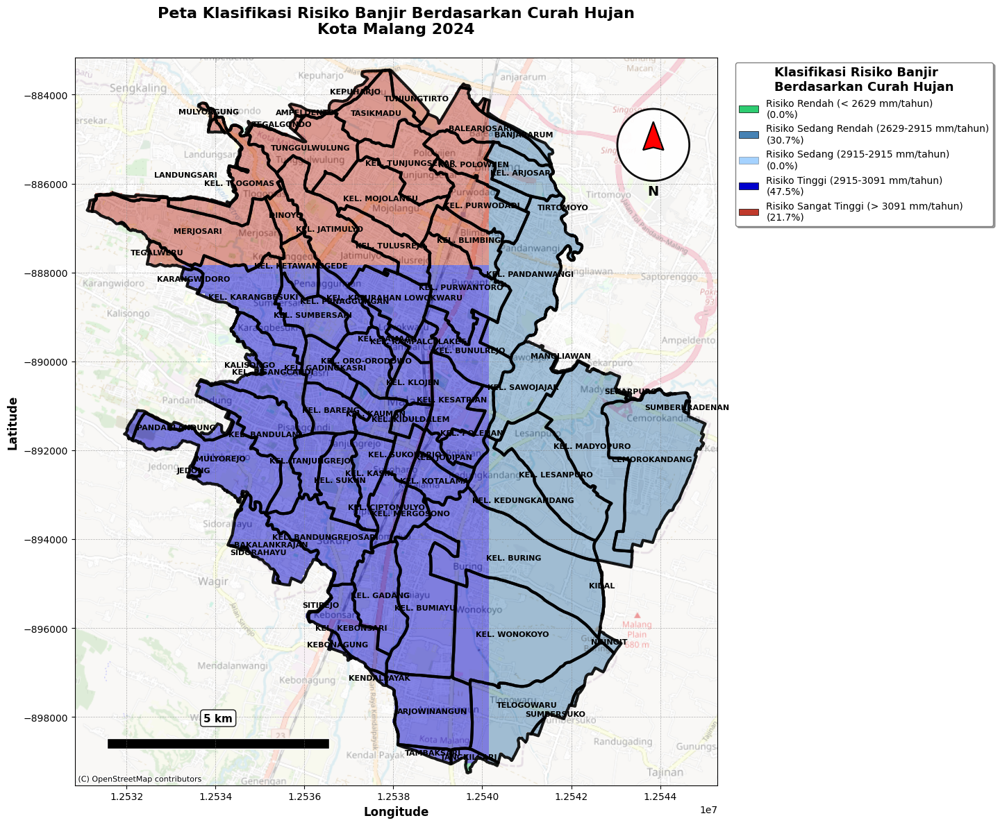


=== SUMMARY HASIL SKORING ===
Distribusi risiko banjir berdasarkan curah hujan:
Skor 1: 11 piksel (0.02%)
Skor 2: 13,882 piksel (30.75%)
Skor 3: 0 piksel (0.00%)
Skor 4: 21,444 piksel (47.50%)
Skor 5: 9,808 piksel (21.73%)

Verifikasi logika skoring:
Curah hujan terendah: 2417.91 mm -> Skor 1 (Risiko Rendah)
Curah hujan tertinggi: 3091.02 mm -> Skor 5 (Risiko Sangat Tinggi)


In [ ]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm
import json
from rasterio import uint8
from pyproj import Transformer
from shapely.geometry import mapping
import contextily as ctx
from matplotlib.patches import Rectangle, FancyBboxPatch
from matplotlib.patches import Polygon as MplPolygon
import matplotlib.patches as mpatches
from matplotlib.offsetbox import AnchoredText

# 1. Baca shapefile batas administrasi Kota Malang
shp_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
gdf = gpd.read_file(shp_path)

# === 2. Baca raster Curah Hujan ===
rainfall_path = "/content/drive/MyDrive/GEE_Exports/ChMalang.tif"
rainfall_raster = rasterio.open(rainfall_path)

# 3. Samakan proyeksi shapefile dengan raster
gdf = gdf.to_crs(rainfall_raster.crs)

# Reproyeksi ke Web Mercator untuk basemap
gdf_mercator = gdf.to_crs(epsg=3857)

# 4. Klip raster curah hujan dengan batas administrasi
# Menggunakan all_touched=False untuk membuat pixel pas dalam batas
geoms = [mapping(geom) for geom in gdf.geometry]
rainfall_clip, transform_clip = mask(
    rainfall_raster,
    geoms,
    crop=True,
    filled=True,
    nodata=-9999,
    all_touched=False,  # Hanya pixel yang sepenuhnya dalam batas
    invert=False
)
rainfall_clip = rainfall_clip[0].astype(np.float32)

# Buat mask untuk data valid (bukan NoData)
valid_mask = rainfall_clip != -9999

# Aplikasikan mask tambahan untuk memastikan pixel hanya dalam batas geometri
from rasterio.features import geometry_mask
geo_mask = geometry_mask(
    geoms,
    out_shape=rainfall_clip.shape,
    transform=transform_clip,
    all_touched=False,  # Pixel hanya jika sepenuhnya dalam batas
    invert=True
)

# Gabungkan mask geometri dengan mask data valid
final_mask = valid_mask & geo_mask
rainfall_clip[~final_mask] = -9999  # Set pixel di luar batas menjadi NoData

print(f"Statistik Curah Hujan Kota Malang:")
print(f"Curah hujan minimum: {rainfall_clip[final_mask].min():.2f} mm/tahun")
print(f"Curah hujan maksimum: {rainfall_clip[final_mask].max():.2f} mm/tahun")
print(f"Curah hujan rata-rata: {rainfall_clip[final_mask].mean():.2f} mm/tahun")
print(f"Curah hujan median: {np.median(rainfall_clip[final_mask]):.2f} mm/tahun")
print()

# === 5. Klasifikasi Curah Hujan untuk Skoring Kerentanan ===
rainfall_min = rainfall_clip[final_mask].min()
rainfall_max = rainfall_clip[final_mask].max()

# Pembagian berdasarkan quantile
q20 = np.percentile(rainfall_clip[final_mask], 20)
q40 = np.percentile(rainfall_clip[final_mask], 40)
q60 = np.percentile(rainfall_clip[final_mask], 60)
q80 = np.percentile(rainfall_clip[final_mask], 80)

print(f"Threshold curah hujan berdasarkan quantile:")
print(f"20% terendah (Curah Hujan Rendah): < {q20:.2f} mm/tahun")
print(f"20-40% (Curah Hujan Sedang Rendah): {q20:.2f} - {q40:.2f} mm/tahun")
print(f"40-60% (Curah Hujan Sedang): {q40:.2f} - {q60:.2f} mm/tahun")
print(f"60-80% (Curah Hujan Sedang Tinggi): {q60:.2f} - {q80:.2f} mm/tahun")
print(f"20% tertinggi (Curah Hujan Tinggi): > {q80:.2f} mm/tahun")
print()

# === 6. Skoring Curah Hujan untuk Klasifikasi Kerentanan Banjir ===
# PERBAIKAN: Inisialisasi dengan NoData untuk semua pixel
skor_curah_hujan = np.full_like(rainfall_clip, fill_value=-9999, dtype=np.float32)

# PERBAIKAN: Logika skoring yang benar untuk risiko banjir
# Curah hujan TINGGI = risiko banjir TINGGI
# Curah hujan RENDAH = risiko banjir RENDAH
conditions = [
    (rainfall_clip < q20) & final_mask,      # 20% terendah
    (rainfall_clip >= q20) & (rainfall_clip < q40) & final_mask,  # 20-40%
    (rainfall_clip >= q40) & (rainfall_clip < q60) & final_mask,  # 40-60%
    (rainfall_clip >= q60) & (rainfall_clip < q80) & final_mask,  # 60-80%
    (rainfall_clip >= q80) & final_mask      # 20% tertinggi
]

# Skor: 1 = risiko rendah, 5 = risiko sangat tinggi
choices = [1, 2, 3, 4, 5]

# Gunakan np.select untuk assignment yang lebih efisien
skor_curah_hujan = np.select(conditions, choices, default=-9999).astype(np.float32)

# Konversi ke uint8 untuk visualisasi dengan NoData = 255
skor_curah_hujan_vis = np.where(skor_curah_hujan == -9999, 255, skor_curah_hujan).astype(np.uint8)

# PERBAIKAN: Colormap dan labels yang konsisten
# Opsi 1: Gradasi Klasik (Hijau > Kuning > Merah)
colors_map = {
    255: '#f0f0f0',  # NoData (abu-abu muda)
    1: '#2ECC71',    # Risiko Rendah - Hijau (Emerald)
    2: '#4682B4',    # Sedang (biru sedang)
    3: '#1E90FF',    # Tinggi (biru dodger)
    4: '#0000CD',    # Sangat Tinggi (biru medium)
    5: '#C0392B'     # Risiko Sangat Tinggi - Merah Tua (Pomegranate)
}


labels_skor = {
    1: f'Risiko Rendah (< {q20:.0f} mm/tahun)',
    2: f'Risiko Sedang Rendah ({q20:.0f}-{q40:.0f} mm/tahun)',
    3: f'Risiko Sedang ({q40:.0f}-{q60:.0f} mm/tahun)',
    4: f'Risiko Tinggi ({q60:.0f}-{q80:.0f} mm/tahun)',
    5: f'Risiko Sangat Tinggi (> {q80:.0f} mm/tahun)'
}

# Debugging informasi
unique, counts = np.unique(skor_curah_hujan_vis, return_counts=True)
print("DEBUG: Nilai unik dalam data setelah klasifikasi curah hujan:")
print(f"Unique values: {unique}")
print(f"Counts: {counts}")
print()

print("Distribusi Klasifikasi Risiko Banjir Berdasarkan Curah Hujan:")
total_valid_pixels = np.sum(final_mask)

for u, c in zip(unique, counts):
    if u != 255:
        percentage = (c / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
        print(f"Skor {u} ({labels_skor.get(u, 'Tidak Dikenal')}): {c:,} piksel ({percentage:.2f}%)")

print(f"NoData (luar batas): {(skor_curah_hujan_vis == 255).sum():,} piksel")
print(f"Total piksel valid: {total_valid_pixels:,}")

# Buat colormap hanya untuk nilai skor yang ada dalam data
values_in_map = sorted([val for val in unique if val != 255])  # Exclude NoData dari colormap
colors_list = [colors_map[val] for val in values_in_map]
cmap = ListedColormap(colors_list)

# Buat bounds yang sesuai dengan nilai data (tanpa NoData)
bounds = []
for val in values_in_map:
    bounds.append(val - 0.5)
bounds.append(values_in_map[-1] + 0.5)

norm = BoundaryNorm(bounds, cmap.N)

# 7. Plotting dengan basemap
fig, ax = plt.subplots(figsize=(14, 12), facecolor='white')

# Reprojeksi raster ke Web Mercator untuk basemap
try:
    bounds_mercator = gdf_mercator.total_bounds

    from rasterio.warp import reproject, Resampling, calculate_default_transform
    from rasterio.crs import CRS

    dst_crs = CRS.from_epsg(3857)

    transform_mercator, width_mercator, height_mercator = calculate_default_transform(
        rainfall_raster.crs, dst_crs, rainfall_raster.width, rainfall_raster.height, *rainfall_raster.bounds
    )

    skor_curah_hujan_mercator = np.full((height_mercator, width_mercator), fill_value=255, dtype=np.uint8)
    reproject(
        source=skor_curah_hujan_vis,
        destination=skor_curah_hujan_mercator,
        src_transform=transform_clip,
        src_crs=rainfall_raster.crs,
        dst_transform=transform_mercator,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )

    # Mask NoData untuk transparansi
    masked_data = np.ma.masked_where(skor_curah_hujan_mercator == 255, skor_curah_hujan_mercator)

    im = ax.imshow(masked_data, extent=[
        transform_mercator[2], transform_mercator[2] + width_mercator * transform_mercator[0],
        transform_mercator[5] + height_mercator * transform_mercator[4], transform_mercator[5]
    ], cmap=cmap, norm=norm, alpha=0.8, interpolation='nearest')

    # Tambahkan basemap
    try:
        ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.OpenStreetMap.Mapnik, alpha=0.4)
        basemap_added = True
    except Exception as e_basemap:
        print(f"Warning: Tidak dapat menambahkan basemap OpenStreetMap: {e_basemap}")
        try:
            ctx.add_basemap(ax, crs=gdf_mercator.crs, source=ctx.providers.CartoDB.Positron, alpha=0.4)
            basemap_added = True
        except Exception as e_alt:
            print(f"Warning: Basemap alternatif tidak tersedia: {e_alt}")
            basemap_added = False

    # Plot boundary dengan garis tebal
    gdf_mercator.boundary.plot(ax=ax, edgecolor='black', linewidth=3, alpha=0.9)

    # Set limits dengan sedikit padding
    padding = (bounds_mercator[2] - bounds_mercator[0]) * 0.02
    ax.set_xlim(bounds_mercator[0] - padding, bounds_mercator[2] + padding)
    ax.set_ylim(bounds_mercator[1] - padding, bounds_mercator[3] + padding)
    use_mercator = True

except Exception as e:
    print(f"Warning: Gagal reprojeksi ke Web Mercator: {e}")
    print("Menggunakan proyeksi asli...")

    # Mask NoData untuk transparansi
    masked_data = np.ma.masked_where(skor_curah_hujan_vis == 255, skor_curah_hujan_vis)

    im = show(masked_data, transform=transform_clip, ax=ax, cmap=cmap, norm=norm, alpha=0.8)
    gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=3, alpha=0.9)
    use_mercator = False
    basemap_added = False

# Tambahkan judul
title = "Peta Klasifikasi Risiko Banjir Berdasarkan Curah Hujan\nKota Malang 2024"
ax.set_title(title, fontsize=16, fontweight='bold', pad=25)

# Label nama wilayah dengan styling yang lebih baik
gdf_to_use = gdf_mercator if use_mercator else gdf
for idx, row in gdf_to_use.iterrows():
    if row.geometry.centroid.is_empty:
        continue
    ax.text(row.geometry.centroid.x, row.geometry.centroid.y,
            row['NAMOBJ'], fontsize=8, ha='center', va='center',
            color='black', weight='bold')

# Legenda dengan warna baru
legend_elements = []
all_possible_scores = sorted(list(labels_skor.keys()))

for score_val in all_possible_scores:
    if score_val in unique and score_val != 255:
        count_legend = counts[unique == score_val][0]
        if total_valid_pixels > 0:
            percentage_legend = (count_legend / total_valid_pixels) * 100
            label_text = f"{labels_skor[score_val]}\n({percentage_legend:.1f}%)"
        else:
            label_text = f"{labels_skor[score_val]}\n(0.0%)"
        alpha_val = 1.0
    else:
        label_text = f"{labels_skor[score_val]}\n(0.0%)"
        alpha_val = 0.4

    legend_elements.append(
        Patch(facecolor=colors_map[score_val], alpha=alpha_val, label=label_text, edgecolor='black', linewidth=0.5)
    )

legend = ax.legend(
    handles=legend_elements,
    title='Klasifikasi Risiko Banjir\nBerdasarkan Curah Hujan',
    title_fontsize=13,
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),
    fontsize=10,
    frameon=True,
    edgecolor='gray',
    fancybox=True,
    shadow=True,
    ncol=1
)
legend.get_title().set_fontweight('bold')

# Koordinat dan grid
ax.set_xlabel("Longitude", fontsize=12, fontweight='bold')
ax.set_ylabel("Latitude", fontsize=12, fontweight='bold')
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6, color='gray')

# ========================================
# SCALE BAR
# ========================================
def add_scalebar(ax, length_km=5, location='lower left'):
    """Tambahkan scale bar ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if use_mercator:
        length_m = length_km * 1000
        scale_length = length_m
        unit_text = f"{length_km} km"
    else:
        scale_length = length_km / 111.0
        unit_text = f"{length_km} km"

    if location == 'lower right':
        x_pos = xlim[1] - (xlim[1] - xlim[0]) * 0.25
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05
    elif location == 'lower left':
        x_pos = xlim[0] + (xlim[1] - xlim[0]) * 0.05
        y_pos = ylim[0] + (ylim[1] - ylim[0]) * 0.05

    scale_bar = Rectangle((x_pos, y_pos), scale_length, (ylim[1] - ylim[0]) * 0.015,
                          facecolor='black', edgecolor='white', linewidth=1)
    ax.add_patch(scale_bar)

    ax.text(x_pos + scale_length/2, y_pos + (ylim[1] - ylim[0]) * 0.035,
            unit_text, ha='center', va='bottom', fontsize=11, weight='bold',
            bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.9, edgecolor='black'))

# ========================================
# NORTH ARROW
# ========================================
def add_north_arrow(ax, location='upper right', size=0.08):
    """Tambahkan panah utara ke peta"""
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    if location == 'upper right':
        x_center = xlim[1] - (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.12
    elif location == 'upper left':
        x_center = xlim[0] + (xlim[1] - xlim[0]) * 0.1
        y_center = ylim[1] - (ylim[1] - ylim[0]) * 0.12

    arrow_size = min(xlim[1] - xlim[0], ylim[1] - ylim[0]) * size

    # Background circle
    circle = plt.Circle((x_center, y_center), arrow_size * 0.7,
                        facecolor='white', edgecolor='black', alpha=0.95, linewidth=2)
    ax.add_patch(circle)

    # Arrow points
    arrow_points = np.array([
        [x_center, y_center + arrow_size * 0.45],
        [x_center - arrow_size * 0.2, y_center - arrow_size * 0.1],
        [x_center, y_center - arrow_size * 0.05],
        [x_center + arrow_size * 0.2, y_center - arrow_size * 0.1],
    ])

    arrow = MplPolygon(arrow_points, facecolor='red', edgecolor='black', linewidth=1.5)
    ax.add_patch(arrow)

    ax.text(x_center, y_center - arrow_size * 0.9, 'N',
            ha='center', va='center', fontsize=14, weight='bold', color='black')

# Tambahkan scale bar dan north arrow
add_scalebar(ax, length_km=5, location='lower left')
add_north_arrow(ax, location='upper right', size=0.08)

plt.tight_layout()
plt.show()

# TAMBAHAN: Simpan hasil skoring untuk analisis lebih lanjut
print("\n=== SUMMARY HASIL SKORING ===")
print(f"Distribusi risiko banjir berdasarkan curah hujan:")
for i in range(1, 6):
    count = np.sum(skor_curah_hujan == i)
    percentage = (count / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    print(f"Skor {i}: {count:,} piksel ({percentage:.2f}%)")

# Verifikasi logika skoring
print(f"\nVerifikasi logika skoring:")
print(f"Curah hujan terendah: {rainfall_clip[final_mask].min():.2f} mm -> Skor 1 (Risiko Rendah)")
print(f"Curah hujan tertinggi: {rainfall_clip[final_mask].max():.2f} mm -> Skor 5 (Risiko Sangat Tinggi)")

In [ ]:
# === 9. Simpan hasil skoring sebagai GeoTIFF ===
output_skor_tif_path = "/content/drive/MyDrive/Output/Skoringg_CHHH.tif" # Ganti dengan path yang Anda inginkan

# Perbarui profil untuk output GeoTIFF
# Pastikan tipe data sesuai dengan skor_curah_hujan (uint8)
# Use the profile obtained from the rainfall_raster object, which is still in scope
output_profile_skor = rainfall_raster.profile.copy()
output_profile_skor.update({
    "driver": "GTiff",
    "height": skor_curah_hujan.shape[0],
    "width": skor_curah_hujan.shape[1],
    "transform": transform_clip, # Gunakan transform dari hasil clipping
    "crs": rainfall_raster.crs, # Gunakan CRS dari raster input
    "dtype": skor_curah_hujan.dtype, # Pastikan dtype sesuai dengan array skor_curah_hujan (np.uint8)
    "nodata": 255 # Pastikan nodata value juga diset (sesuai dengan inisialisasi skor_curah_hujan)
})

try:
    with rasterio.open(output_skor_tif_path, 'w', **output_profile_skor) as dst:
        dst.write(skor_curah_hujan, 1) # Tulis array skor_curah_hujan ke band 1
    print(f"\nFile GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: {output_skor_tif_path}")
except Exception as e:
    print(f"\nError saat menyimpan GeoTIFF Skor Kerentanan Banjir: {e}")


File GeoTIFF Skor Kerentanan Banjir berhasil disimpan di: /content/drive/MyDrive/Output/Skoringg_CHHH.tif


##Data Sungai

In [ ]:
sungai = gpd.read_file("/content/drive/MyDrive/ProjectUAS/SUNGAI_AR_25K.shp")

In [ ]:
print("CRS Awal:", sungai.crs)
if sungai.crs != "EPSG:32749":
    sungai = sungai.to_crs(epsg=32749)

CRS Awal: EPSG:32749


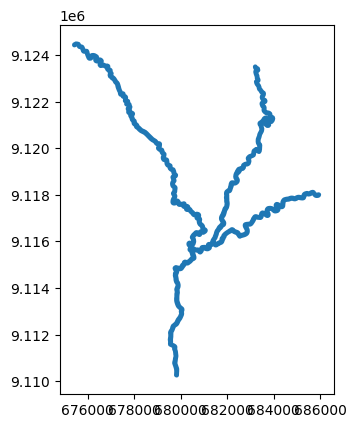

In [ ]:
sungai.plot()
plt.show()

In [ ]:
sungai.head()

,NAMOBJ,JNSSNG,KLSSNG,FCODE,REMARK,SRS_ID,LCODE,METADATA,NAMWS,NAMDAS,SHAPE_Leng,SHAPE_Area,geometry
0,KALI BRANTAS,0,0,None,Sungai,None,DA0280,None,None,None,0.802763,0.000100,"POLYGON ((675526.543 9124374.869, 675525.887 9..."
1,KALI BANGO,0,0,None,Sungai,None,DA0280,None,None,None,0.118236,0.000014,"POLYGON ((681277.522 9115990.683, 681277.302 9..."
2,KALI AMPRONG,0,0,None,Sungai,None,DA0280,None,None,None,0.149809,0.000016,"POLYGON ((680346.836 9115657.493, 680346.813 9..."
3,KALI SARI,0,0,None,Sungai,None,DA0280,None,None,None,0.119772,0.000011,"POLYGON ((683145.346 9123377.126, 683139.349 9..."


Data sungai berhasil dibaca: 4 fitur
CRS awal: EPSG:32749


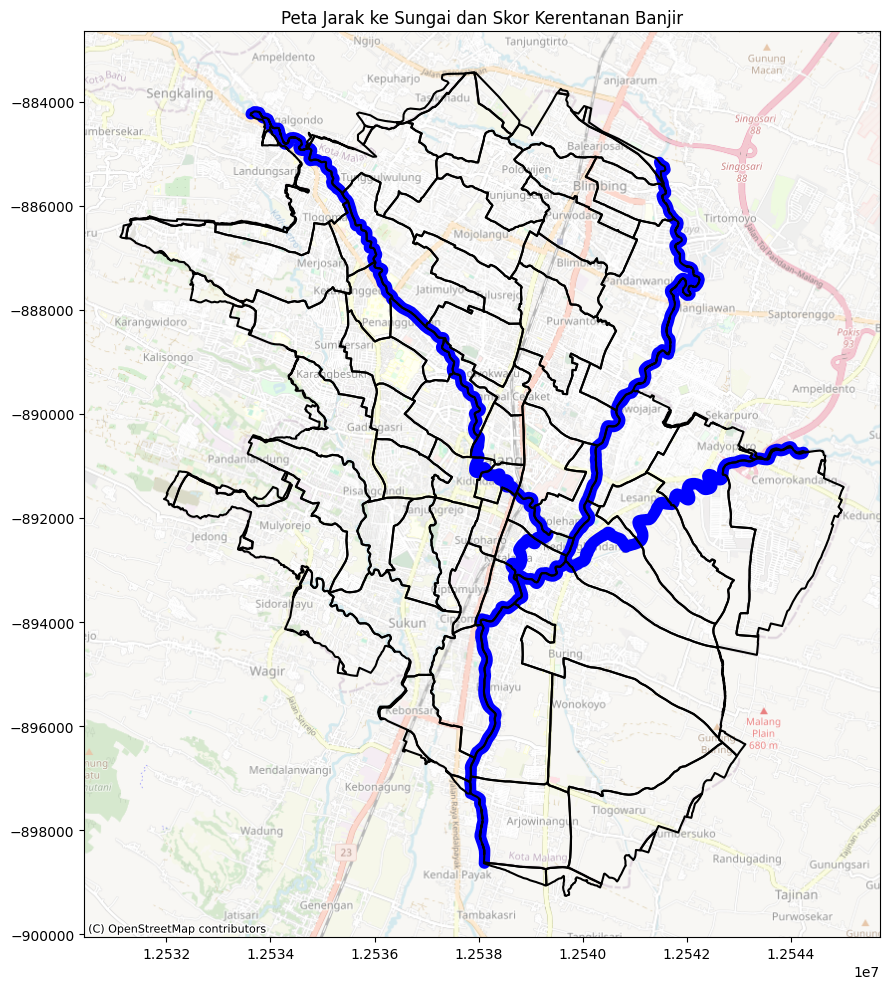

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point, Polygon
from rasterio.features import rasterize
from rasterio.transform import from_origin
from scipy.ndimage import distance_transform_edt
import numpy as np
import rasterio
import warnings
warnings.filterwarnings('ignore')

# 1. Baca data sungai
sungai = gpd.read_file("/content/drive/MyDrive/ProjectUAS/SUNGAI_AR_25K.shp")
print(f"Data sungai berhasil dibaca: {len(sungai)} fitur")
print(f"CRS awal: {sungai.crs}")

# 2. Ubah CRS ke UTM (meter)
if sungai.crs.is_geographic:
    sungai = sungai.to_crs(epsg=32749)

# 3. Baca batas administrasi Kota Malang
malang_boundary = gpd.read_file("/content/drive/MyDrive/ProjectUAS/Malang.shp")
if malang_boundary.crs.is_geographic:
    malang_boundary = malang_boundary.to_crs(epsg=32749)

# 4. Buat raster kosong
bounds = malang_boundary.total_bounds  # xmin, ymin, xmax, ymax
pixel_size = 30  # meter
width = int((bounds[2] - bounds[0]) / pixel_size)
height = int((bounds[3] - bounds[1]) / pixel_size)
transform = from_origin(bounds[0], bounds[3], pixel_size, pixel_size)

# 5. Rasterisasi sungai (nilai 1 = sungai, lainnya = 0)
sungai_raster = rasterize(
    ((geom, 1) for geom in sungai.geometry),
    out_shape=(height, width),
    transform=transform,
    fill=0,
    dtype=np.uint8
)

# 6. Hitung jarak Euclidean ke sungai (pixel yang bukan sungai dihitung ke sungai terdekat)
distance = distance_transform_edt(sungai_raster == 0) * pixel_size  # dalam meter

# 7. Skoring berdasarkan jarak
skor_jarak = np.full_like(distance, fill_value=0, dtype=np.uint8)
skor_jarak[distance <= 50] = 5  # Sangat Rawan
skor_jarak[(distance > 50) & (distance <= 100)] = 4
skor_jarak[(distance > 100) & (distance <= 250)] = 3
skor_jarak[(distance > 250) & (distance <= 500)] = 2
skor_jarak[distance > 500] = 1  # Tidak Rawan

# 8. Simpan hasil ke file GeoTIFF
out_meta = {
    'driver': 'GTiff',
    'height': height,
    'width': width,
    'count': 1,
    'dtype': 'uint8',
    'crs': sungai.crs,
    'transform': transform
}

with rasterio.open("/content/drive/MyDrive/ProjectUAS/skor_jarak_sungaiii.tif", "w", **out_meta) as dst:
    dst.write(skor_jarak, 1)

# 9. Visualisasi
fig, ax = plt.subplots(figsize=(12, 10))
malang_boundary.to_crs(epsg=3857).boundary.plot(ax=ax, edgecolor='black')
sungai.to_crs(epsg=3857).plot(ax=ax, color='blue', linewidth=1)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs='EPSG:3857', alpha=0.5)
ax.set_title("Peta Jarak ke Sungai dan Skor Kerentanan Banjir")
plt.tight_layout()
plt.show()


##skoriiing


ANALISIS RAWAN BANJIR KOTA MALANG
1. LOADING DATA
------------------------------
✓ Berhasil memuat Batas Administrasi Malang: 82 features
✓ Berhasil memuat 4 jalur sungai
  CRS sungai asli: EPSG:32749
  Melakukan reprojeksi CRS...
✓ Ditemukan 4 segmen sungai dalam area

2. ANALISIS RASTER
------------------------------
✓ File curah_hujan ditemukan
✓ File ketinggian ditemukan
✓ File kemiringan ditemukan
✓ File tutupan_lahan ditemukan
✓ File jarak_sungai ditemukan
✓ Referensi raster: (314, 279), CRS: EPSG:4326

MEMPROSES OVERLAY RASTER

Memproses: curah_hujan (bobot: 0.25)
  Shape: (314, 279), CRS: EPSG:4326
  Valid pixels: 45145
  Range: 1.000 - 5.000
  ✓ Berhasil diproses

Memproses: ketinggian (bobot: 0.2)
  Shape: (524, 464), CRS: EPSG:4326
  Reprojecting dari EPSG:4326 ke EPSG:4326
  Valid pixels: 43462
  Range: 1.000 - 5.000
  ✓ Berhasil diproses

Memproses: kemiringan (bobot: 0.2)
  Shape: (523, 465), CRS: EPSG:4326
  Reprojecting dari EPSG:4326 ke EPSG:4326
  Valid pixels: 43462


Traceback (most recent call last):
  File "/tmp/ipython-input-33-2055982848.py", line 626, in main
    fig = create_visualization(klasifikasi, gdf_malang, gdf_rivers,
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-33-2055982848.py", line 492, in create_visualization
    ax_legend.text(x_indent + 0.02, y_current - 0.005, sources_text, fontsize=10,
                                                       ^^^^^^^^^^^^
NameError: name 'sources_text' is not defined


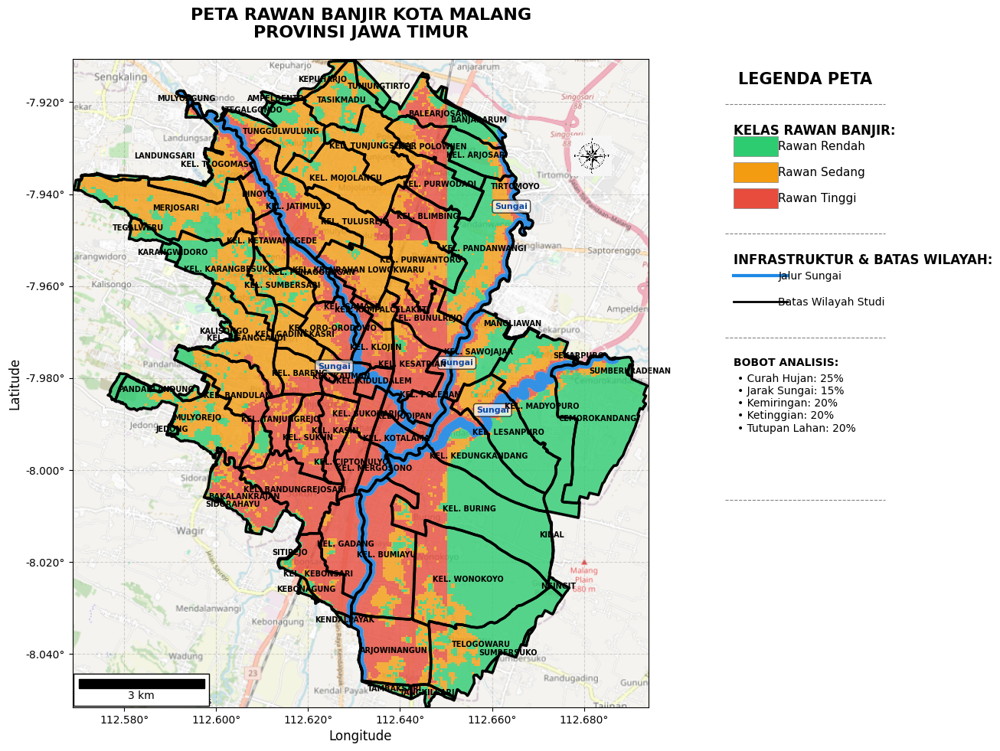

In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import numpy as np
from shapely.geometry import mapping
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as mticker
from pyproj import Transformer
import tempfile
import os
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.image as mpimg
import contextily as cx
from matplotlib.patches import Rectangle
import pandas as pd
import traceback
import warnings
warnings.filterwarnings('ignore')

def load_shapefile(path, name):
    """Load shapefile with error handling"""
    try:
        gdf = gpd.read_file(path)
        if gdf.empty:
            raise ValueError(f"Shapefile {name} kosong!")
        print(f"✓ Berhasil memuat {name}: {len(gdf)} features")
        return gdf
    except Exception as e:
        print(f"✗ Error memuat {name}: {e}")
        return None

def load_and_process_rivers(river_path, admin_gdf):
    """Load and process river shapefile"""
    try:
        gdf_rivers = gpd.read_file(river_path)
        print(f"✓ Berhasil memuat {len(gdf_rivers)} jalur sungai")
        print(f"  CRS sungai asli: {gdf_rivers.crs}")

        # Perbaiki CRS jika berbeda
        if gdf_rivers.crs != admin_gdf.crs:
            print("  Melakukan reprojeksi CRS...")
            gdf_rivers = gdf_rivers.to_crs(admin_gdf.crs)

        # Test overlap dengan area admin
        gdf_rivers_test = gpd.clip(gdf_rivers, admin_gdf)
        if len(gdf_rivers_test) == 0:
            print("⚠ PERINGATAN: Tidak ada sungai dalam area Malang!")
            print(f"  Bounds Malang: {admin_gdf.total_bounds}")
            print(f"  Bounds sungai: {gdf_rivers.total_bounds}")
            return None
        else:
            print(f"✓ Ditemukan {len(gdf_rivers_test)} segmen sungai dalam area")
            return gdf_rivers

    except Exception as e:
        print(f"✗ Error memuat sungai: {e}")
        return None

def process_raster_overlay(raster_files, weights, admin_gdf):
    """Process raster overlay with weighted analysis"""

    # Validasi file raster
    valid_files = {}
    for name, path in raster_files.items():
        if os.path.exists(path):
            valid_files[name] = path
            print(f"✓ File {name} ditemukan")
        else:
            print(f"✗ File {name} tidak ditemukan: {path}")

    if not valid_files:
        raise ValueError("Tidak ada file raster yang valid!")

    # Ambil referensi dari file pertama
    ref_path = list(valid_files.values())[0]
    with rasterio.open(ref_path) as ref:
        ref_crs = ref.crs
        ref_transform = ref.transform
        ref_shape = (ref.height, ref.width)
        ref_meta = ref.meta.copy()
        print(f"✓ Referensi raster: {ref_shape}, CRS: {ref_crs}")

    # Inisialisasi array skor
    skor_total = np.zeros((ref_shape[0], ref_shape[1]), dtype='float32')
    out_meta = ref_meta.copy()
    out_meta.update({"dtype": "float32", "count": 1, "nodata": np.nan})

    # Proses setiap raster
    print("\n" + "="*50)
    print("MEMPROSES OVERLAY RASTER")
    print("="*50)

    total_weight_used = 0
    for name, path in valid_files.items():
        if name not in weights:
            print(f"⚠ Warning: Bobot untuk {name} tidak ditemukan, skip")
            continue

        weight = weights[name]
        print(f"\nMemproses: {name} (bobot: {weight})")

        try:
            with rasterio.open(path) as src:
                print(f"  Shape: {src.shape}, CRS: {src.crs}")

                # Reproyeksi admin boundary jika perlu
                admin_masked = admin_gdf.to_crs(src.crs) if admin_gdf.crs != src.crs else admin_gdf
                shapes = [mapping(geom) for geom in admin_masked.geometry]

                # Mask raster
                masked, masked_transform = mask(src, shapes, crop=True)

                # Handle nodata dan konversi tipe data
                masked = masked.astype('float32')
                if src.nodata is not None:
                    masked[masked == src.nodata] = np.nan

                # Reproject ke referensi jika perlu
                if src.crs != ref_crs or masked.shape[1:] != ref_shape:
                    print(f"  Reprojecting dari {src.crs} ke {ref_crs}")
                    resampled = np.empty((ref_shape[0], ref_shape[1]), dtype='float32')
                    reproject(
                        source=masked,
                        destination=resampled,
                        src_transform=masked_transform,
                        src_crs=src.crs,
                        dst_transform=ref_transform,
                        dst_crs=ref_crs,
                        resampling=Resampling.bilinear
                    )
                else:
                    resampled = masked[0] if len(masked.shape) == 3 else masked

                # Validasi data
                valid_pixels = np.sum(~np.isnan(resampled))
                if valid_pixels == 0:
                    print(f"  ⚠ Warning: Tidak ada data valid untuk {name}")
                    continue

                print(f"  Valid pixels: {valid_pixels}")
                print(f"  Range: {np.nanmin(resampled):.3f} - {np.nanmax(resampled):.3f}")

                # Tambahkan ke skor total dengan bobot
                valid_mask = ~np.isnan(resampled)
                skor_total[valid_mask] += (resampled[valid_mask] * weight)
                total_weight_used += weight

                print(f"  ✓ Berhasil diproses")

        except Exception as e:
            print(f"  ✗ Error processing {name}: {e}")
            continue

    print(f"\nTotal bobot yang digunakan: {total_weight_used}")

    # Normalisasi jika total bobot tidak 1.0
    if total_weight_used != 1.0 and total_weight_used > 0:
        print(f"Normalisasi skor dengan faktor: {1.0/total_weight_used}")
        skor_total = skor_total / total_weight_used

    return skor_total, ref_transform, ref_crs, out_meta

def classify_flood_risk(skor_total, admin_gdf, ref_transform, ref_crs):
    """Classify flood risk levels"""

    # Final masking untuk area administrasi
    print("\nMelakukan masking akhir...")
    admin_reprojected = admin_gdf.to_crs(ref_crs) if admin_gdf.crs != ref_crs else admin_gdf
    shapes = [mapping(geom) for geom in admin_reprojected.geometry]

    # Create temporary file untuk masking
    with tempfile.TemporaryDirectory() as tmpdir:
        tmpfile = os.path.join(tmpdir, "temp_skor.tif")

        # Metadata untuk file temporary
        out_meta = {
            'driver': 'GTiff',
            'height': skor_total.shape[0],
            'width': skor_total.shape[1],
            'count': 1,
            'dtype': 'float32',
            'crs': ref_crs,
            'transform': ref_transform,
            'nodata': np.nan
        }

        with rasterio.open(tmpfile, "w", **out_meta) as dst:
            dst.write(skor_total, 1)

        with rasterio.open(tmpfile) as src_tmp:
            masked_data, _ = mask(src_tmp, shapes, crop=False, nodata=np.nan)

    skor_total_masked = masked_data[0]

    # Debug info
    valid_scores = skor_total_masked[~np.isnan(skor_total_masked)]
    print(f"Skor total - Min: {np.nanmin(skor_total_masked):.3f}, Max: {np.nanmax(skor_total_masked):.3f}")
    print(f"Jumlah piksel valid: {len(valid_scores)}")

    if len(valid_scores) == 0:
        raise ValueError("Tidak ada data valid untuk klasifikasi!")

    # Klasifikasi berdasarkan persentil
    klasifikasi = np.full(skor_total_masked.shape, np.nan)

    p33 = np.percentile(valid_scores, 33)
    p67 = np.percentile(valid_scores, 67)

    print(f"Threshold - Rendah: ≤{p33:.3f}, Sedang: {p33:.3f}-{p67:.3f}, Tinggi: >{p67:.3f}")

    # Assign classification
    klasifikasi[~np.isnan(skor_total_masked) & (skor_total_masked <= p33)] = 1  # Rendah
    klasifikasi[~np.isnan(skor_total_masked) & (skor_total_masked > p33) & (skor_total_masked <= p67)] = 2  # Sedang
    klasifikasi[~np.isnan(skor_total_masked) & (skor_total_masked > p67)] = 3  # Tinggi

    # Print distribution
    unique, counts = np.unique(klasifikasi[~np.isnan(klasifikasi)], return_counts=True)
    print("Distribusi klasifikasi:")
    class_names = {1: "Rawan Rendah", 2: "Rawan Sedang", 3: "Rawan Tinggi"}
    for val, count in zip(unique, counts):
        if val in class_names:
            percentage = (count / len(valid_scores)) * 100
            print(f"  {class_names[val]}: {count:,} piksel ({percentage:.1f}%)")

    return skor_total_masked, klasifikasi
def create_visualization(klasifikasi, admin_gdf, gdf_rivers, ref_transform, ref_crs, weights, output_path):
    """Create comprehensive flood risk map visualization"""

    print("\n" + "="*50)
    print("MEMBUAT VISUALISASI")
    print("="*50)

    # Calculate plot extent
    rows, cols = klasifikasi.shape
    plot_extent = (
        ref_transform.c,
        ref_transform.c + ref_transform.a * cols,
        ref_transform.f + ref_transform.e * rows,
        ref_transform.f
    )

    # Convert to WGS84 for plotting
    if ref_crs.to_epsg() != 4326:
        transformer = Transformer.from_crs(ref_crs, "EPSG:4326", always_xy=True)
        xmin_lon, ymin_lat = transformer.transform(plot_extent[0], plot_extent[2])
        xmax_lon, ymax_lat = transformer.transform(plot_extent[1], plot_extent[3])
        plot_extent_wgs84 = (xmin_lon, xmax_lon, ymin_lat, ymax_lat)
    else:
        plot_extent_wgs84 = plot_extent

    # Create figure with external legend
    fig = plt.figure(figsize=(14, 11)) # Ukuran figure sedikit lebih besar untuk legenda
    gs = fig.add_gridspec(1, 2, width_ratios=[4, 1.2], hspace=0.1, wspace=0.15) # Rasio untuk legenda

    # Main map subplot
    ax = fig.add_subplot(gs[0])

    # Define colormap
    cmap = colors.ListedColormap(['#2ECC71', '#F39C12', '#E74C3C'])  # Green, Orange, Red
    bounds = [0.5, 1.5, 2.5, 3.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    # Plot classification
    im = ax.imshow(klasifikasi, cmap=cmap, norm=norm,
                    extent=plot_extent_wgs84, origin='upper',
                    interpolation='none', alpha=0.8, zorder=2)

    # Add basemap
    try:
        cx.add_basemap(ax, crs="EPSG:4326", source=cx.providers.OpenStreetMap.Mapnik, alpha=0.7)
        print("✓ Basemap ditambahkan")
    except Exception as e:
        print(f"⚠ Warning: Basemap tidak dapat ditambahkan: {e}")

    # Plot administrative boundary
    admin_plot = admin_gdf.to_crs("EPSG:4326")
    admin_plot.boundary.plot(ax=ax, edgecolor='black', linewidth=2.5, zorder=5)

    # Plot rivers if available
    river_legend_needed = False
    if gdf_rivers is not None:
        try:
            print("Menambahkan jalur sungai...")
            rivers_plot = gdf_rivers.to_crs("EPSG:4326")
            rivers_clipped = gpd.clip(rivers_plot, admin_plot)

            if len(rivers_clipped) > 0:
                # Plot with outline for better visibility
                rivers_clipped.plot(ax=ax, color='white', linewidth=4, alpha=0.8, zorder=3)
                rivers_clipped.plot(ax=ax, color='#1E88E5', linewidth=2.5, alpha=0.9, zorder=4)
                river_legend_needed = True
                print(f"✓ {len(rivers_clipped)} segmen sungai ditampilkan")

                # Add river labels if name column exists
                name_columns = ['NAMA', 'NAME', 'REMARK', 'NAMOBJ', 'RIVER_NAME', 'NAMA_SUNGAI']
                name_col = None
                for col in name_columns:
                    if col in rivers_clipped.columns:
                        name_col = col
                        break

                if name_col:
                    for idx, row in rivers_clipped.iterrows():
                        if pd.notna(row[name_col]) and hasattr(row.geometry, 'centroid'):
                            try:
                                centroid = row.geometry.centroid
                                if (plot_extent_wgs84[0] <= centroid.x <= plot_extent_wgs84[1] and
                                    plot_extent_wgs84[2] <= centroid.y <= plot_extent_wgs84[3]):
                                    ax.text(centroid.x, centroid.y, str(row[name_col]),
                                            fontsize=8, ha='center', va='center',
                                            color='#0D47A1', weight='bold', zorder=6,
                                            bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
                            except:
                                continue

        except Exception as e:
            print(f"⚠ Warning: Error menampilkan sungai: {e}")

    # Add area labels
    if 'NAMOBJ' in admin_plot.columns:
        for idx, row in admin_plot.iterrows():
            if hasattr(row.geometry, 'centroid'):
                centroid = row.geometry.centroid
                ax.text(centroid.x, centroid.y, row["NAMOBJ"],
                        fontsize=7, ha='center', va='center',
                        color='black', weight='bold', zorder=6,
                    )

    # Map formatting
    ax.set_title("PETA RAWAN BANJIR KOTA MALANG\nPROVINSI JAWA TIMUR",
                 fontsize=16, weight='bold', pad=20)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)

    # Grid and formatting
    ax.grid(True, linestyle='--', alpha=0.3, color='gray')
    ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda val, pos: f'{val:.3f}°'))
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda val, pos: f'{val:.3f}°'))

    # Scale bar
    try:
        fontprops = fm.FontProperties(size=10)
        center_lat = (plot_extent_wgs84[2] + plot_extent_wgs84[3]) / 2
        # Adjust scale bar length based on map extent roughly
        map_width_km = (plot_extent_wgs84[1] - plot_extent_wgs84[0]) * 111.32 * np.cos(np.deg2rad(center_lat))

        # Determine a reasonable scale length (e.g., 1/5th of map width, rounded)
        target_scale_km = round(map_width_km / 5, -0) # Round to nearest 10 for better appearance
        if target_scale_km == 0: target_scale_km = 1 # Avoid 0 if map is very small
        if target_scale_km > 10: target_scale_km = round(target_scale_km, -1) # Round to nearest 10
        elif target_scale_km > 1: target_scale_km = round(target_scale_km, 0) # Round to nearest 1

        scale_length_degrees = target_scale_km / (111.32 * np.cos(np.deg2rad(center_lat)))

        scalebar = AnchoredSizeBar(ax.transData, scale_length_degrees, f'{target_scale_km:.0f} km',
                                     'lower left', pad=0.5, color='black', frameon=True,
                                     size_vertical=0.002, fontproperties=fontprops, zorder=7)
        ax.add_artist(scalebar)
        print("✓ Scale bar ditambahkan")
    except Exception as e:
        print(f"⚠ Scale bar tidak dapat ditambahkan: {e}")

    # North arrow (if image exists)
    compass_paths = [
        "/content/drive/MyDrive/ProjectUAS/Arah Mata Angin.jpeg",
        "/content/drive/MyDrive/ProjectUAS/compass.png",
        "compass.png"
    ]

    for compass_path in compass_paths:
        if os.path.exists(compass_path):
            try:
                img = mpimg.imread(compass_path)
                img_x = plot_extent_wgs84[0] + 0.9 * (plot_extent_wgs84[1] - plot_extent_wgs84[0])
                img_y = plot_extent_wgs84[3] - 0.15 * (plot_extent_wgs84[3] - plot_extent_wgs84[2])
                imagebox = OffsetImage(img, zoom=0.08)
                ab = AnnotationBbox(imagebox, (img_x, img_y), frameon=False, zorder=7)
                ax.add_artist(ab)
                print("✓ Kompas ditambahkan")
                break
            except Exception as e:
                print(f"⚠ Error menambahkan kompas: {e}")
                continue

    ax.set_aspect('equal')
    # plt.tight_layout() # Akan disesuaikan secara manual dengan gridspec

    # --- Bagian Legenda yang Diperbarui ---
    ax_legend = fig.add_subplot(gs[1])
    ax_legend.axis('off') # Sembunyikan axis untuk tampilan legenda yang bersih

    # Koordinat awal untuk elemen legenda
    y_current = 0.98 # Mulai dari atas
    x_indent = 0.1 # Indentasi awal

    # Judul Legenda
    ax_legend.text(0.5, y_current, 'LEGENDA PETA', fontsize=15, weight='bold',
                   ha='center', va='top', transform=ax_legend.transAxes)
    y_current -= 0.05 # Spasi setelah judul

    # Separator
    ax_legend.plot([0.05, 0.95], [y_current, y_current], color='gray', linestyle='--', linewidth=0.8, transform=ax_legend.transAxes)
    y_current -= 0.03

    # KELAS RAWAN BANJIR
    ax_legend.text(x_indent, y_current, 'KELAS RAWAN BANJIR:', fontsize=12, weight='bold',
                   va='top', transform=ax_legend.transAxes)
    y_current -= 0.01 # Spasi setelah sub-judul

    colors_list = ['#2ECC71', '#F39C12', '#E74C3C']  # Hijau, Oranye, Merah
    labels_list = ['Rawan Rendah', 'Rawan Sedang', 'Rawan Tinggi']

    rect_width = 0.25 # Lebar simbol warna
    rect_height = 0.03 # Tinggi simbol warna
    text_offset_x = 0.35 # Offset teks dari simbol

    for i, (color, label) in enumerate(zip(colors_list, labels_list)):
        y_current -= (rect_height + 0.01) # Spasi antara item legenda
        rect = Rectangle((x_indent, y_current), rect_width, rect_height,
                         facecolor=color, edgecolor='grey', linewidth=0.5, transform=ax_legend.transAxes)
        ax_legend.add_patch(rect)
        ax_legend.text(text_offset_x, y_current + rect_height/2, label,
                       fontsize=11, va='center', transform=ax_legend.transAxes)

    y_current -= 0.04 # Spasi setelah bagian kelas rawan

    # Separator
    ax_legend.plot([0.05, 0.95], [y_current, y_current], color='gray', linestyle='--', linewidth=0.8, transform=ax_legend.transAxes)
    y_current -= 0.03

    # INFRASTRUKTUR & BATAS WILAYAH
    ax_legend.text(x_indent, y_current, 'INFRASTRUKTUR & BATAS WILAYAH:', fontsize=12, weight='bold',
                   va='top', transform=ax_legend.transAxes)
    y_current -= 0.01

    line_width = 0.3 # Lebar garis simbol
    line_height_offset = 0.015 # Offset Y untuk tengah garis

    if river_legend_needed:
        y_current -= (rect_height + 0.01)
        ax_legend.plot([x_indent, x_indent + line_width], [y_current + line_height_offset, y_current + line_height_offset],
                       color='#1E88E5', linewidth=3, transform=ax_legend.transAxes)
        ax_legend.text(text_offset_x, y_current + line_height_offset, 'Jalur Sungai', fontsize=10, va='center', transform=ax_legend.transAxes)

    y_current -= (rect_height + 0.01)
    ax_legend.plot([x_indent, x_indent + line_width], [y_current + line_height_offset, y_current + line_height_offset],
                   color='black', linewidth=2, transform=ax_legend.transAxes)
    ax_legend.text(text_offset_x, y_current + line_height_offset, 'Batas Wilayah Studi', fontsize=10, va='center', transform=ax_legend.transAxes)

    y_current -= 0.04 # Spasi setelah bagian infrastruktur

    # Separator
    ax_legend.plot([0.05, 0.95], [y_current, y_current], color='gray', linestyle='--', linewidth=0.8, transform=ax_legend.transAxes)
    y_current -= 0.03

    # BOBOT ANALISIS
    ax_legend.text(x_indent, y_current, 'BOBOT ANALISIS:', fontsize=10, weight='bold',
                   va='top', transform=ax_legend.transAxes)
    y_current -= 0.02

    # Format bobot ke dalam teks
    info_text = ""
    for param, weight in weights.items():
        param_name = param.replace('_', ' ').title()
        info_text += f"• {param_name}: {weight*100:.0f}%\n"

    # Penyesuaian agar teks tidak terlalu panjang dan melewati batas
    max_chars_per_line = 25 # Perkiraan karakter per baris sebelum wrap
    wrapped_info_text = ""
    for line in info_text.split('\n'):
        if len(line) > max_chars_per_line:
            parts = [line[i:i+max_chars_per_line] for i in range(0, len(line), max_chars_per_line)]
            wrapped_info_text += '\n'.join(parts) + '\n'
        else:
            wrapped_info_text += line + '\n'

    ax_legend.text(x_indent + 0.02, y_current - 0.005, wrapped_info_text.strip(), fontsize=10,
                   va='top', transform=ax_legend.transAxes)
    y_current -= (len(wrapped_info_text.split('\n')) * 0.02) + 0.02 # Sesuaikan y_current dengan jumlah baris teks

    y_current -= 0.04 # Spasi setelah bagian bobot

    # Separator
    ax_legend.plot([0.05, 0.95], [y_current, y_current], color='gray', linestyle='--', linewidth=0.8, transform=ax_legend.transAxes)
    y_current -= 0.03


    ax_legend.text(x_indent + 0.02, y_current - 0.005, sources_text, fontsize=10,
                   va='top', transform=ax_legend.transAxes)
    y_current -= (len(sources_text.split('\n')) * 0.02) + 0.02

    # Pastikan tidak ada elemen yang tumpang tindih dengan menyesuaikan ukuran plot utama
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.15) # Sesuaikan spasi antar subplot jika perlu

    # Save and show
    try:
        plt.savefig(output_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"✓ Peta berhasil disimpan: {output_path}")
    except Exception as e:
        print(f"⚠ Error menyimpan peta: {e}")

    plt.show()

    return fig

def calculate_river_statistics(gdf_rivers, admin_gdf):
    """Calculate river statistics"""
    if gdf_rivers is None:
        return

    print("\n" + "="*50)
    print("STATISTIK JALUR SUNGAI")
    print("="*50)

    try:
        # Use UTM for accurate length calculation
        utm_crs = "EPSG:32749"  # UTM Zone 49S for Indonesia
        try:
            rivers_utm = gdf_rivers.to_crs(utm_crs)
            admin_utm = admin_gdf.to_crs(utm_crs)
        except:
            # Fallback to Web Mercator
            utm_crs = "EPSG:3857"
            rivers_utm = gdf_rivers.to_crs(utm_crs)
            admin_utm = admin_gdf.to_crs(utm_crs)

        # Clip to admin area
        rivers_clipped = gpd.clip(rivers_utm, admin_utm)

        if len(rivers_clipped) > 0:
            lengths = rivers_clipped.geometry.length
            total_length = lengths.sum() / 1000  # Convert to km
            avg_length = lengths.mean() / 1000
            max_length = lengths.max() / 1000

            print(f"Jumlah segmen sungai: {len(rivers_clipped):,}")
            print(f"Total panjang sungai: {total_length:.2f} km")
            print(f"Panjang rata-rata per segmen: {avg_length:.2f} km")
            print(f"Panjang segmen terpanjang: {max_length:.2f} km")

            # Check for name columns
            name_columns = ['NAMA', 'NAME', 'REMARK', 'NAMOBJ', 'RIVER_NAME', 'NAMA_SUNGAI']
            name_col = None
            for col in name_columns:
                if col in rivers_clipped.columns:
                    name_col = col
                    break

            if name_col:
                unique_names = rivers_clipped[name_col].dropna().unique()
                print(f"Jumlah nama sungai unik: {len(unique_names)}")
                if len(unique_names) <= 15:
                    print("Nama-nama sungai:")
                    for name in sorted(unique_names):
                        if pd.notna(name) and str(name).strip():
                            print(f"  • {name}")
        else:
            print("Tidak ada sungai dalam area administrasi")

    except Exception as e:
        print(f"Error menghitung statistik: {e}")
def main():
    """Main function to run flood risk analysis"""

    print("="*60)
    print("ANALISIS RAWAN BANJIR KOTA MALANG")
    print("="*60)

    # File paths - sesuaikan dengan lokasi file Anda
    shapefile_path = "/content/drive/MyDrive/ProjectUAS/Malang.shp"
    river_shapefile_path = "/content/drive/MyDrive/ProjectUAS/SUNGAI_AR_25K.shp"

    # >>> THIS IS THE CORRECTION <<<
    raster_files = {
        "curah_hujan": "/content/drive/MyDrive/Output/Skoringg_CHHH.tif",
        "ketinggian": "/content/drive/MyDrive/Output/Skoring_Elevasii.tif",
        "kemiringan": "/content/drive/MyDrive/Output/Skoring_Sloope.tif",
        "tutupan_lahan": "/content/drive/MyDrive/Output/Skoring_DynamicWorld.tif",
        "jarak_sungai": "/content/drive/MyDrive/ProjectUAS/skor_jarak_sungaiii.tif"
    }

    # Corrected weights - now sum to 1.0
    weights = {
      "curah_hujan": 0.25,
    "jarak_sungai": 0.15,
    "kemiringan": 0.20,
    "ketinggian": 0.20,
    "tutupan_lahan": 0.20
    }
    # >>> END OF CORRECTION <<<

    output_path = "/content/drive/MyDrive/ProjectUAS/peta_rawan_banjir_final.png"

    try:
        # Load administrative boundary
        print("1. LOADING DATA")
        print("-" * 30)
        gdf_malang = load_shapefile(shapefile_path, "Batas Administrasi Malang")
        if gdf_malang is None:
            raise ValueError("Gagal memuat shapefile administrasi!")


        # Load rivers (optional)
        gdf_rivers = load_and_process_rivers(river_shapefile_path, gdf_malang)

        # Process raster overlay
        print("\n2. ANALISIS RASTER")
        print("-" * 30)
        skor_total, ref_transform, ref_crs, out_meta = process_raster_overlay(
            raster_files, weights, gdf_malang)

        # Classify flood risk
        print("\n3. KLASIFIKASI RISIKO")
        print("-" * 30)
        skor_total_masked, klasifikasi = classify_flood_risk(
            skor_total, gdf_malang, ref_transform, ref_crs)

        # Create visualization
        print("\n4. VISUALISASI")
        print("-" * 30)
        fig = create_visualization(klasifikasi, gdf_malang, gdf_rivers,
                                 ref_transform, ref_crs, weights, output_path)

        # Calculate river statistics
        print("\n5. STATISTIK TAMBAHAN")
        print("-" * 30)
        calculate_river_statistics(gdf_rivers, gdf_malang)

        print("\n" + "="*60)
        print("✅ ANALISIS SELESAI!")
        print("="*60)

        return fig, klasifikasi, skor_total_masked

    except Exception as e:
        print(f"\n❌ ERROR: {e}")
        traceback.print_exc()
        return None, None, None

#
if __name__ == "__main__":
    fig, klasifikasi, skor_total = main()